In [1]:
 ### Prepare module structure ###

import sys
sys.path.append("../")

In [2]:
### IMPORT ###

import numpy as np
import math
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import time

import matplotlib.pyplot as plt
%matplotlib inline

from util import *
from data import *
import models

# auto reload imports on local changes
%load_ext autoreload
%autoreload 2
print(torch.__version__)

1.0.0


In [3]:
### Check device ###

USE_GPU = True

dtype = torch.float32

if USE_GPU and torch.cuda.is_available():
    # TODO: Change to CPU used!
    device = torch.device('cuda:1')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda:1


fashion


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


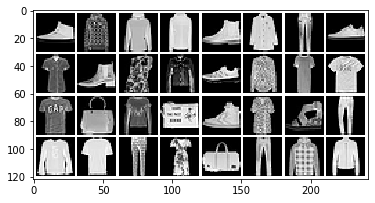

torch.Size([32, 1, 28, 28])


In [4]:
### LOAD DATA ###
dataset = 'fashion'
dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=32)

sample = next(iter(dataloader['train']))
plot_grid(sample)
print(sample.shape)
sample_ft =  torch.rfft(sample, 2, onesided=False)
sample_magnitudes = torch.sqrt(torch.sum(sample_ft**2, -1))

In [5]:
def calc_mags(x):
    ft =  torch.rfft(x, 2, onesided=False)
    mags = torch.sqrt(torch.sum(ft ** 2, -1) + 1e-16)
    return mags

# Function to compute test images

def test_generator(model, device, testloader):
    # put model to eval mode
    model = model.to(device=device)
    model.eval()

    # move test images to device and reduce to magnitude information in fourier space
    test_images = []
    outputs = []
    
    for data in testloader:
        z = torch.randn(*data.shape).to(device)
        data = data.to(device=device)
        magn = calc_mags(data)
        net_input = torch.cat([z, magn], dim=1)
        ouput = model(net_input)

        test_images.append(data.cpu().numpy())
        outputs.append(ouput.cpu().detach().numpy())
    
    return np.concatenate(outputs), np.concatenate(test_images)

In [5]:
# Define Gen and Disc loss
def gen_loss(disc_gen, gen_output, x, lmd):
    reconstruction = torch.mean(torch.abs(x - gen_output))
    adversarial = -torch.mean(torch.log(disc_gen))
    return  adversarial + lmd * reconstruction

def disc_loss(disc_real, disc_gen):
    return -torch.mean((torch.log(disc_real) + torch.log(1 - disc_gen)) / 2.0)

In [6]:
### Create new models ###

gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=2048)
#disc = models.FCDiscriminator(imsize=imsize, h=2048)
disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=64)

Version 0.4


In [7]:
# Set training parameters

lmd = 1e3 # loss signal

g_opt = optim.Adam(gen.parameters(), lr=1e-4)
d_opt = optim.Adam(disc.parameters(), lr=1e-4)

In [10]:
# Initial loss

gen = gen.to(device)
disc = disc.to(device)
sample = sample.to(device)
sample_magnitudes = sample_magnitudes.to(device)

zm = torch.cat([torch.randn(*sample.shape).to(device), sample_magnitudes], dim=1)
gen_out = gen(zm)

xm = torch.cat([sample, sample_magnitudes], dim=1)
disc_output_real = disc(xm)
disc_output_generated = disc(torch.cat([gen_out, sample_magnitudes], dim=1))

g_loss = gen_loss(disc_output_generated, gen_out, sample, lmd)
d_loss = disc_loss(disc_output_real, disc_output_generated)

print("Generator loss:", g_loss.item())
print("Discriminator initial loss:", d_loss.item())

Generator loss: 377.1575927734375
Discriminator initial loss: 0.694253146648407


In [11]:
def train_model(gen, disc, g_opt, d_opt, device, loader_train, epochs=1):
    """
    Train a the conditional gan
    
    Returns: Loss history per iteration step
    """
    
    # move the model parameters to CPU/GPU
    disc = disc.to(device=device)
    gen = gen.to(device=device)
    
    # loss history
    history_g = []
    history_d = []
    history_mse = []
    
    for e in range(epochs):
        for t, x in enumerate(loader_train):
            # move x to device and reduce to magnitude information in fourier space
            x = x.to(device=device)
            magnitudes = calc_mags(x)
            
            # stack magnitudes to noise / generator input
            z = torch.randn(*x.shape).to(device)
            zm = torch.cat([z, magnitudes], dim=1)
            
            # calc gen output
            gen.train()
            gen_output = gen(zm)
            
            # calc disc output for real and generated image
            xm = torch.cat([x, magnitudes], dim=1)
            disc.train()
            disc_output_real = disc(xm)
            disc_output_generated = disc(torch.cat([gen_output, magnitudes], dim=1))
            
            # calculate generator loss and update generator
            g_loss = gen_loss(disc_output_generated, gen(zm), x, lmd)
            history_g.append(g_loss.item())
            g_opt.zero_grad()
            g_loss.backward(retain_graph=True)
            #torch.nn.utils.clip_grad_value_(gen.parameters(), 1e-1)
            g_opt.step()
           
            # calculate discriminator loss and update discriminator
            d_loss = disc_loss(disc_output_real, disc_output_generated)
            history_d.append(d_loss.item())
            d_opt.zero_grad()
            d_loss.backward()
            #torch.nn.utils.clip_grad_value_(disc.parameters(), 1e-1)
            d_opt.step()
            
            mse_loss = torch.mean((x - gen_output) ** 2)
            history_mse.append(mse_loss.detach().cpu().item())

            if t % 100 == 0:
                print("epoch: {:2} \t step:{} \t loss: {:3.4}".format(e+1, t, history_g[-1]))
            
        plt.plot(history_g[-10000:], label="Gen loss")
        plt.plot(history_d[-10000:], label="Disc loss")
        plt.plot(history_mse[-10000:], label="MSE")
        plt.legend()
        plt.show()
        
        test_outputs, test_images = test_generator(gen, device, dataloader['val'])
        plot_grid(np.vstack([test_images[:16],test_outputs[:16], test_images[16:32], test_outputs[16:32]]), figsize=(8,8))
        
        mse_val = np.mean((test_outputs - test_images)**2)
        print("Mean squared dist:", mse_val)
        
        gen_weights = gen.state_dict().copy()
        disc_weights = disc.state_dict().copy()
        torch.save(gen_weights, "../cache/FCGenerator2048Fashion_{0:04d}_{1}_{2:.3f}.sd".format(e+1, time.strftime("%Y%m%d_%H%M%S"), mse_val))
        torch.save(disc_weights, "../cache/ConvDiscriminator64Fashion_{0:04d}_{1}_{2:.3f}.sd".format(e+1, time.strftime("%Y%m%d_%H%M%S"), mse_val))
        #if mse_val < 0.012:
        #    break
        
    return mse_val

epoch:  1 	 step:0 	 loss: 392.4
epoch:  1 	 step:100 	 loss: 132.3
epoch:  1 	 step:200 	 loss: 113.4
epoch:  1 	 step:300 	 loss: 98.39
epoch:  1 	 step:400 	 loss: 96.44
epoch:  1 	 step:500 	 loss: 94.61
epoch:  1 	 step:600 	 loss: 97.48
epoch:  1 	 step:700 	 loss: 98.93
epoch:  1 	 step:800 	 loss: 95.5
epoch:  1 	 step:900 	 loss: 95.84
epoch:  1 	 step:1000 	 loss: 96.98
epoch:  1 	 step:1100 	 loss: 79.24
epoch:  1 	 step:1200 	 loss: 95.72
epoch:  1 	 step:1300 	 loss: 84.53
epoch:  1 	 step:1400 	 loss: 78.4
epoch:  1 	 step:1500 	 loss: 77.16
epoch:  1 	 step:1600 	 loss: 85.39
epoch:  1 	 step:1700 	 loss: 84.76
epoch:  1 	 step:1800 	 loss: 83.98


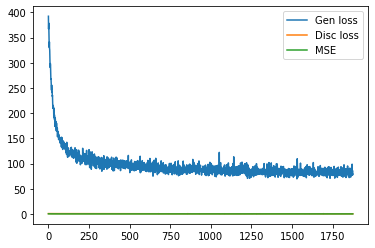

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


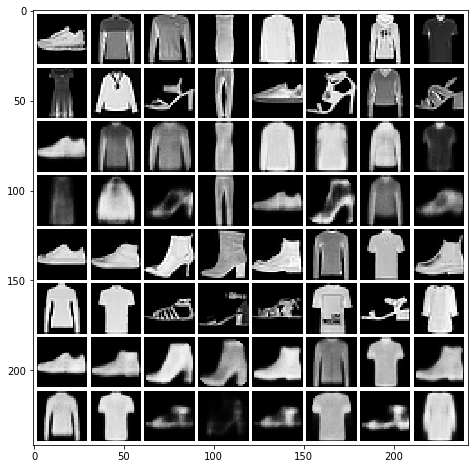

Mean squared dist: 0.023380542
epoch:  2 	 step:0 	 loss: 73.96
epoch:  2 	 step:100 	 loss: 85.6
epoch:  2 	 step:200 	 loss: 74.57
epoch:  2 	 step:300 	 loss: 69.85
epoch:  2 	 step:400 	 loss: 88.58
epoch:  2 	 step:500 	 loss: 80.22
epoch:  2 	 step:600 	 loss: 79.25
epoch:  2 	 step:700 	 loss: 70.08
epoch:  2 	 step:800 	 loss: 70.71
epoch:  2 	 step:900 	 loss: 79.67
epoch:  2 	 step:1000 	 loss: 87.4
epoch:  2 	 step:1100 	 loss: 81.63
epoch:  2 	 step:1200 	 loss: 77.73
epoch:  2 	 step:1300 	 loss: 74.18
epoch:  2 	 step:1400 	 loss: 69.6
epoch:  2 	 step:1500 	 loss: 75.53
epoch:  2 	 step:1600 	 loss: 75.83
epoch:  2 	 step:1700 	 loss: 68.74
epoch:  2 	 step:1800 	 loss: 85.65


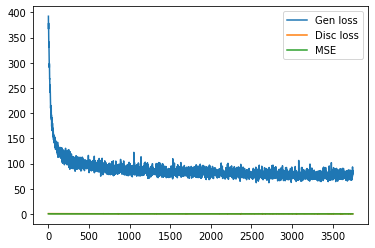

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


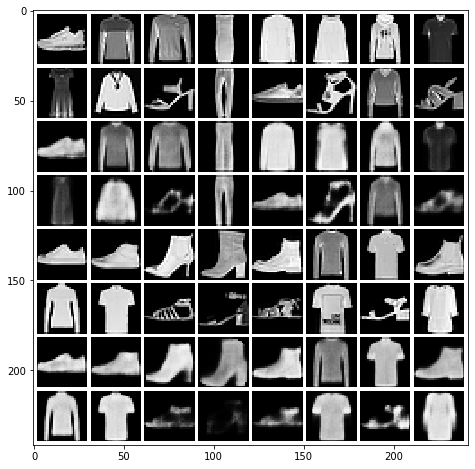

Mean squared dist: 0.021945888
epoch:  3 	 step:0 	 loss: 69.93
epoch:  3 	 step:100 	 loss: 80.06
epoch:  3 	 step:200 	 loss: 73.48
epoch:  3 	 step:300 	 loss: 84.76
epoch:  3 	 step:400 	 loss: 67.62
epoch:  3 	 step:500 	 loss: 72.89
epoch:  3 	 step:600 	 loss: 69.21
epoch:  3 	 step:700 	 loss: 78.19
epoch:  3 	 step:800 	 loss: 73.85
epoch:  3 	 step:900 	 loss: 78.97
epoch:  3 	 step:1000 	 loss: 77.02
epoch:  3 	 step:1100 	 loss: 76.3
epoch:  3 	 step:1200 	 loss: 71.18
epoch:  3 	 step:1300 	 loss: 70.67
epoch:  3 	 step:1400 	 loss: 72.12
epoch:  3 	 step:1500 	 loss: 85.46
epoch:  3 	 step:1600 	 loss: 88.36
epoch:  3 	 step:1700 	 loss: 74.21
epoch:  3 	 step:1800 	 loss: 75.49


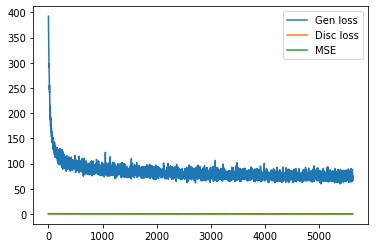

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


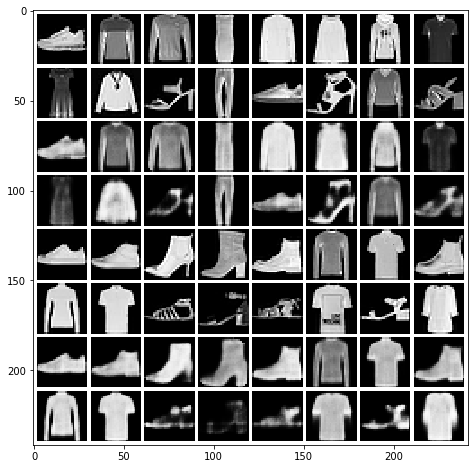

Mean squared dist: 0.02056721
epoch:  4 	 step:0 	 loss: 71.49
epoch:  4 	 step:100 	 loss: 68.06
epoch:  4 	 step:200 	 loss: 73.35
epoch:  4 	 step:300 	 loss: 75.47
epoch:  4 	 step:400 	 loss: 75.23
epoch:  4 	 step:500 	 loss: 84.11
epoch:  4 	 step:600 	 loss: 71.74
epoch:  4 	 step:700 	 loss: 74.43
epoch:  4 	 step:800 	 loss: 66.64
epoch:  4 	 step:900 	 loss: 73.79
epoch:  4 	 step:1000 	 loss: 71.76
epoch:  4 	 step:1100 	 loss: 70.66
epoch:  4 	 step:1200 	 loss: 74.39
epoch:  4 	 step:1300 	 loss: 70.2
epoch:  4 	 step:1400 	 loss: 67.04
epoch:  4 	 step:1500 	 loss: 60.38
epoch:  4 	 step:1600 	 loss: 73.98
epoch:  4 	 step:1700 	 loss: 61.15
epoch:  4 	 step:1800 	 loss: 66.46


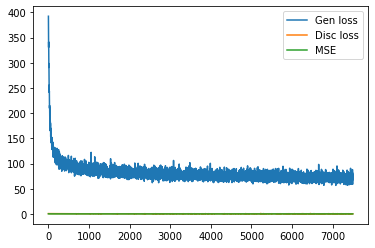

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


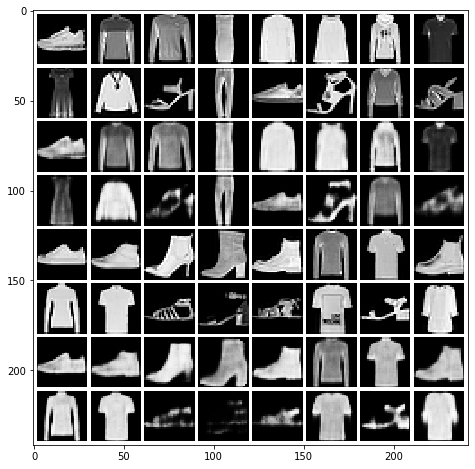

Mean squared dist: 0.019864598
epoch:  5 	 step:0 	 loss: 67.3
epoch:  5 	 step:100 	 loss: 72.56
epoch:  5 	 step:200 	 loss: 71.43
epoch:  5 	 step:300 	 loss: 70.01
epoch:  5 	 step:400 	 loss: 83.67
epoch:  5 	 step:500 	 loss: 77.61
epoch:  5 	 step:600 	 loss: 73.15
epoch:  5 	 step:700 	 loss: 73.78
epoch:  5 	 step:800 	 loss: 74.8
epoch:  5 	 step:900 	 loss: 72.61
epoch:  5 	 step:1000 	 loss: 70.5
epoch:  5 	 step:1100 	 loss: 70.36
epoch:  5 	 step:1200 	 loss: 74.57
epoch:  5 	 step:1300 	 loss: 60.84
epoch:  5 	 step:1400 	 loss: 68.4
epoch:  5 	 step:1500 	 loss: 68.49
epoch:  5 	 step:1600 	 loss: 70.53
epoch:  5 	 step:1700 	 loss: 57.9
epoch:  5 	 step:1800 	 loss: 81.03


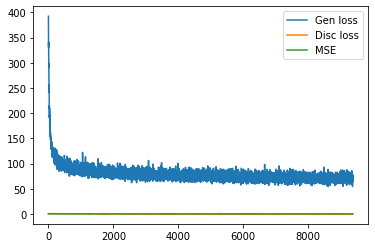

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


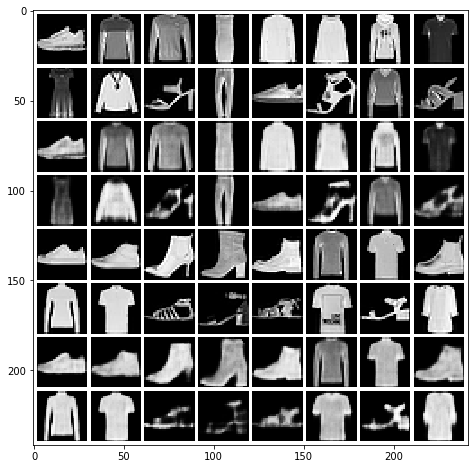

Mean squared dist: 0.019628763
epoch:  6 	 step:0 	 loss: 71.24
epoch:  6 	 step:100 	 loss: 80.49
epoch:  6 	 step:200 	 loss: 70.99
epoch:  6 	 step:300 	 loss: 71.72
epoch:  6 	 step:400 	 loss: 75.1
epoch:  6 	 step:500 	 loss: 75.02
epoch:  6 	 step:600 	 loss: 70.38
epoch:  6 	 step:700 	 loss: 81.11
epoch:  6 	 step:800 	 loss: 67.89
epoch:  6 	 step:900 	 loss: 67.63
epoch:  6 	 step:1000 	 loss: 74.56
epoch:  6 	 step:1100 	 loss: 70.94
epoch:  6 	 step:1200 	 loss: 70.4
epoch:  6 	 step:1300 	 loss: 69.24
epoch:  6 	 step:1400 	 loss: 68.72
epoch:  6 	 step:1500 	 loss: 65.25
epoch:  6 	 step:1600 	 loss: 69.84
epoch:  6 	 step:1700 	 loss: 65.35
epoch:  6 	 step:1800 	 loss: 65.37


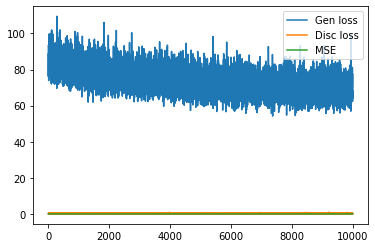

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


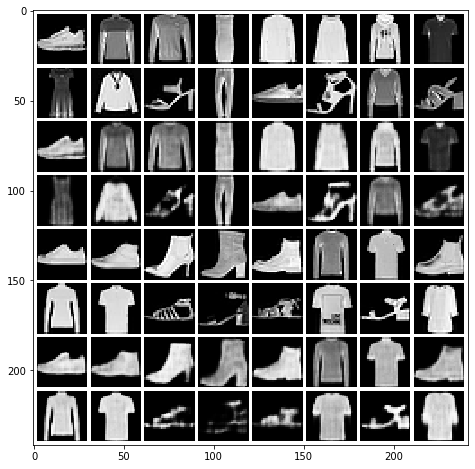

Mean squared dist: 0.01931482
epoch:  7 	 step:0 	 loss: 69.05
epoch:  7 	 step:100 	 loss: 61.23
epoch:  7 	 step:200 	 loss: 59.42
epoch:  7 	 step:300 	 loss: 67.71
epoch:  7 	 step:400 	 loss: 70.43
epoch:  7 	 step:500 	 loss: 76.23
epoch:  7 	 step:600 	 loss: 66.08
epoch:  7 	 step:700 	 loss: 71.12
epoch:  7 	 step:800 	 loss: 70.47
epoch:  7 	 step:900 	 loss: 64.7
epoch:  7 	 step:1000 	 loss: 68.66
epoch:  7 	 step:1100 	 loss: 58.03
epoch:  7 	 step:1200 	 loss: 77.42
epoch:  7 	 step:1300 	 loss: 65.71
epoch:  7 	 step:1400 	 loss: 62.69
epoch:  7 	 step:1500 	 loss: 58.16
epoch:  7 	 step:1600 	 loss: 66.23
epoch:  7 	 step:1700 	 loss: 65.02
epoch:  7 	 step:1800 	 loss: 69.53


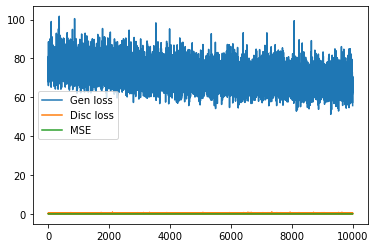

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


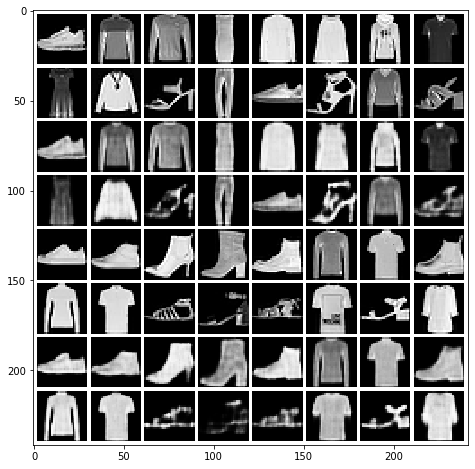

Mean squared dist: 0.019235397
epoch:  8 	 step:0 	 loss: 67.9
epoch:  8 	 step:100 	 loss: 69.71
epoch:  8 	 step:200 	 loss: 65.44
epoch:  8 	 step:300 	 loss: 68.55
epoch:  8 	 step:400 	 loss: 66.32
epoch:  8 	 step:500 	 loss: 68.68
epoch:  8 	 step:600 	 loss: 65.4
epoch:  8 	 step:700 	 loss: 67.88
epoch:  8 	 step:800 	 loss: 73.58
epoch:  8 	 step:900 	 loss: 60.25
epoch:  8 	 step:1000 	 loss: 63.9
epoch:  8 	 step:1100 	 loss: 64.15
epoch:  8 	 step:1200 	 loss: 75.62
epoch:  8 	 step:1300 	 loss: 59.46
epoch:  8 	 step:1400 	 loss: 65.65
epoch:  8 	 step:1500 	 loss: 65.62
epoch:  8 	 step:1600 	 loss: 69.16
epoch:  8 	 step:1700 	 loss: 66.35
epoch:  8 	 step:1800 	 loss: 56.39


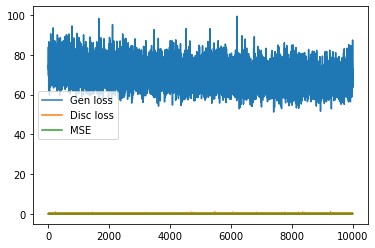

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


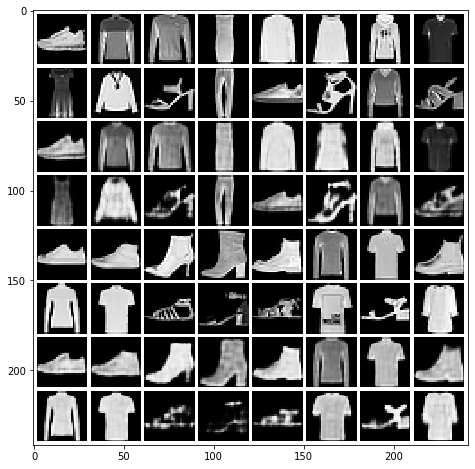

Mean squared dist: 0.018822312
epoch:  9 	 step:0 	 loss: 60.08
epoch:  9 	 step:100 	 loss: 63.4
epoch:  9 	 step:200 	 loss: 60.34
epoch:  9 	 step:300 	 loss: 68.1
epoch:  9 	 step:400 	 loss: 59.53
epoch:  9 	 step:500 	 loss: 62.14
epoch:  9 	 step:600 	 loss: 62.87
epoch:  9 	 step:700 	 loss: 76.62
epoch:  9 	 step:800 	 loss: 63.19
epoch:  9 	 step:900 	 loss: 67.82
epoch:  9 	 step:1000 	 loss: 68.71
epoch:  9 	 step:1100 	 loss: 70.75
epoch:  9 	 step:1200 	 loss: 75.07
epoch:  9 	 step:1300 	 loss: 69.63
epoch:  9 	 step:1400 	 loss: 56.41
epoch:  9 	 step:1500 	 loss: 64.17
epoch:  9 	 step:1600 	 loss: 63.03
epoch:  9 	 step:1700 	 loss: 74.33
epoch:  9 	 step:1800 	 loss: 63.37


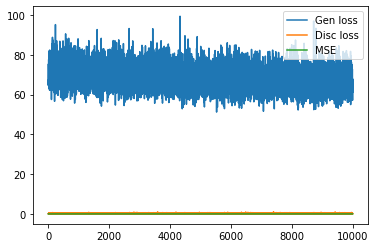

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


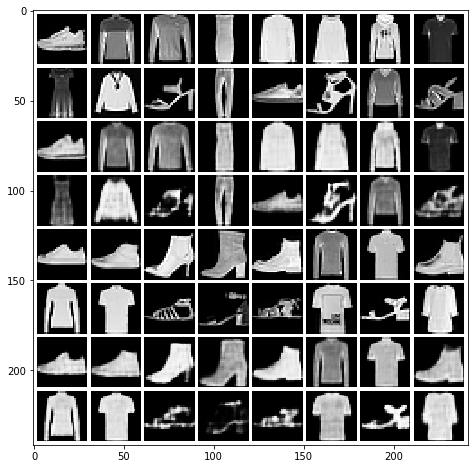

Mean squared dist: 0.019572023
epoch: 10 	 step:0 	 loss: 63.65
epoch: 10 	 step:100 	 loss: 68.33
epoch: 10 	 step:200 	 loss: 65.7
epoch: 10 	 step:300 	 loss: 72.17
epoch: 10 	 step:400 	 loss: 62.76
epoch: 10 	 step:500 	 loss: 62.69
epoch: 10 	 step:600 	 loss: 60.11
epoch: 10 	 step:700 	 loss: 68.96
epoch: 10 	 step:800 	 loss: 60.27
epoch: 10 	 step:900 	 loss: 68.74
epoch: 10 	 step:1000 	 loss: 70.55
epoch: 10 	 step:1100 	 loss: 67.63
epoch: 10 	 step:1200 	 loss: 66.57
epoch: 10 	 step:1300 	 loss: 71.29
epoch: 10 	 step:1400 	 loss: 58.65
epoch: 10 	 step:1500 	 loss: 65.2
epoch: 10 	 step:1600 	 loss: 74.39
epoch: 10 	 step:1700 	 loss: 61.25
epoch: 10 	 step:1800 	 loss: 63.72


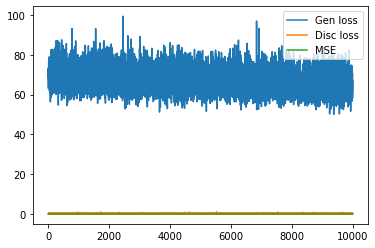

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


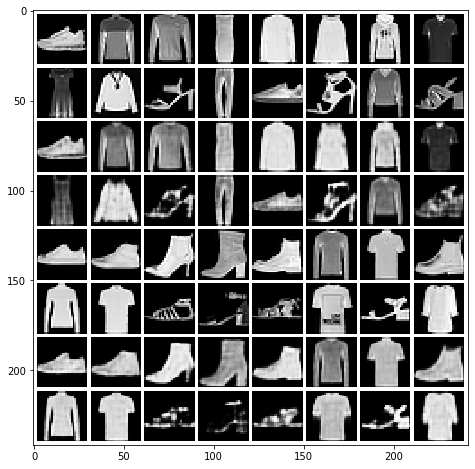

Mean squared dist: 0.018579913
epoch: 11 	 step:0 	 loss: 75.95
epoch: 11 	 step:100 	 loss: 67.4
epoch: 11 	 step:200 	 loss: 66.61
epoch: 11 	 step:300 	 loss: 67.31
epoch: 11 	 step:400 	 loss: 75.72
epoch: 11 	 step:500 	 loss: 70.19
epoch: 11 	 step:600 	 loss: 60.7
epoch: 11 	 step:700 	 loss: 68.28
epoch: 11 	 step:800 	 loss: 65.89
epoch: 11 	 step:900 	 loss: 64.15
epoch: 11 	 step:1000 	 loss: 60.74
epoch: 11 	 step:1100 	 loss: 69.3
epoch: 11 	 step:1200 	 loss: 56.49
epoch: 11 	 step:1300 	 loss: 62.16
epoch: 11 	 step:1400 	 loss: 65.24
epoch: 11 	 step:1500 	 loss: 70.3
epoch: 11 	 step:1600 	 loss: 64.35
epoch: 11 	 step:1700 	 loss: 67.09
epoch: 11 	 step:1800 	 loss: 80.72


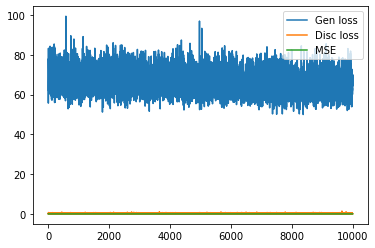

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


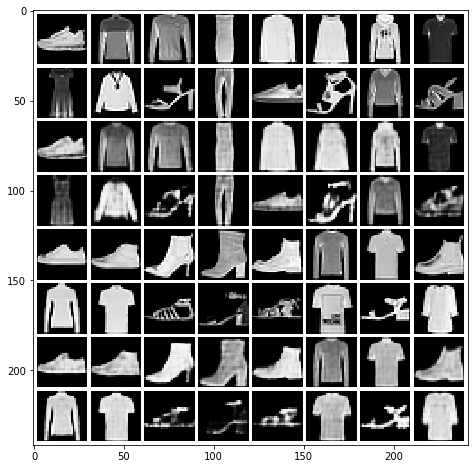

Mean squared dist: 0.01920678
epoch: 12 	 step:0 	 loss: 67.17
epoch: 12 	 step:100 	 loss: 55.34
epoch: 12 	 step:200 	 loss: 69.04
epoch: 12 	 step:300 	 loss: 62.43
epoch: 12 	 step:400 	 loss: 61.16
epoch: 12 	 step:500 	 loss: 56.61
epoch: 12 	 step:600 	 loss: 66.63
epoch: 12 	 step:700 	 loss: 60.59
epoch: 12 	 step:800 	 loss: 67.58
epoch: 12 	 step:900 	 loss: 64.05
epoch: 12 	 step:1000 	 loss: 69.33
epoch: 12 	 step:1100 	 loss: 66.2
epoch: 12 	 step:1200 	 loss: 66.68
epoch: 12 	 step:1300 	 loss: 59.15
epoch: 12 	 step:1400 	 loss: 60.29
epoch: 12 	 step:1500 	 loss: 59.21
epoch: 12 	 step:1600 	 loss: 63.38
epoch: 12 	 step:1700 	 loss: 61.5
epoch: 12 	 step:1800 	 loss: 61.93


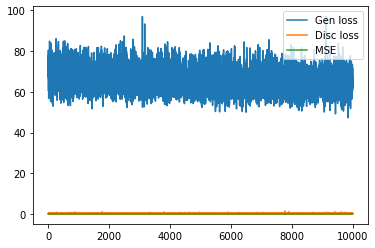

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


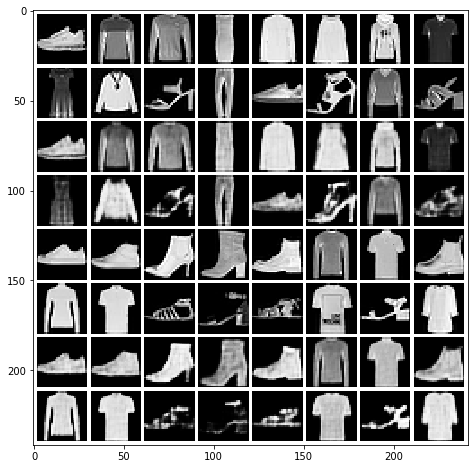

Mean squared dist: 0.018999586
epoch: 13 	 step:0 	 loss: 62.2
epoch: 13 	 step:100 	 loss: 62.46
epoch: 13 	 step:200 	 loss: 65.17
epoch: 13 	 step:300 	 loss: 62.27
epoch: 13 	 step:400 	 loss: 64.21
epoch: 13 	 step:500 	 loss: 65.22
epoch: 13 	 step:600 	 loss: 58.76
epoch: 13 	 step:700 	 loss: 60.23
epoch: 13 	 step:800 	 loss: 64.86
epoch: 13 	 step:900 	 loss: 58.65
epoch: 13 	 step:1000 	 loss: 79.39
epoch: 13 	 step:1100 	 loss: 63.89
epoch: 13 	 step:1200 	 loss: 64.87
epoch: 13 	 step:1300 	 loss: 63.35
epoch: 13 	 step:1400 	 loss: 64.88
epoch: 13 	 step:1500 	 loss: 61.81
epoch: 13 	 step:1600 	 loss: 63.28
epoch: 13 	 step:1700 	 loss: 66.11
epoch: 13 	 step:1800 	 loss: 62.88


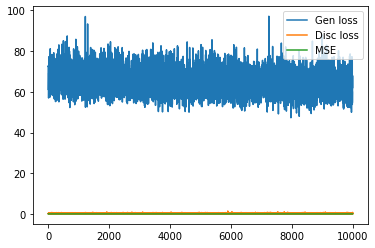

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


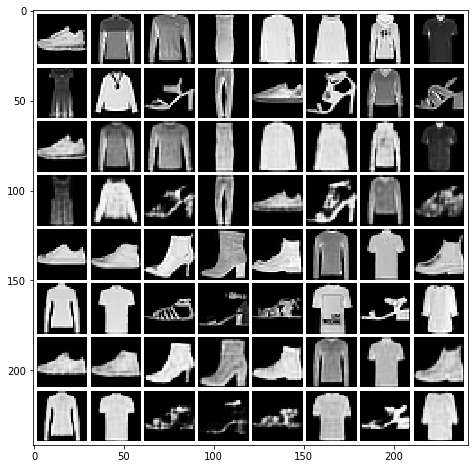

Mean squared dist: 0.018555121
epoch: 14 	 step:0 	 loss: 65.92
epoch: 14 	 step:100 	 loss: 62.34
epoch: 14 	 step:200 	 loss: 58.98
epoch: 14 	 step:300 	 loss: 70.83
epoch: 14 	 step:400 	 loss: 62.35
epoch: 14 	 step:500 	 loss: 68.88
epoch: 14 	 step:600 	 loss: 62.82
epoch: 14 	 step:700 	 loss: 63.13
epoch: 14 	 step:800 	 loss: 60.12
epoch: 14 	 step:900 	 loss: 57.23
epoch: 14 	 step:1000 	 loss: 56.97
epoch: 14 	 step:1100 	 loss: 70.05
epoch: 14 	 step:1200 	 loss: 66.85
epoch: 14 	 step:1300 	 loss: 61.03
epoch: 14 	 step:1400 	 loss: 60.9
epoch: 14 	 step:1500 	 loss: 60.7
epoch: 14 	 step:1600 	 loss: 57.97
epoch: 14 	 step:1700 	 loss: 52.01
epoch: 14 	 step:1800 	 loss: 56.23


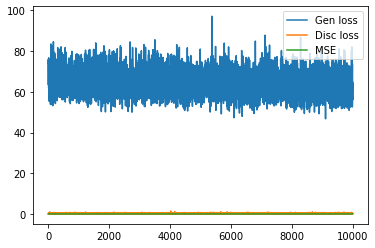

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


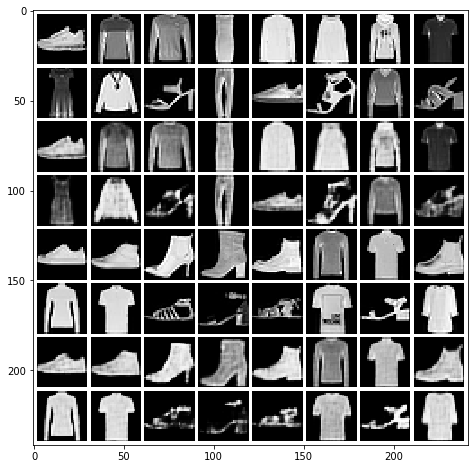

Mean squared dist: 0.018864622
epoch: 15 	 step:0 	 loss: 55.38
epoch: 15 	 step:100 	 loss: 75.22
epoch: 15 	 step:200 	 loss: 56.6
epoch: 15 	 step:300 	 loss: 61.48
epoch: 15 	 step:400 	 loss: 56.62
epoch: 15 	 step:500 	 loss: 63.21
epoch: 15 	 step:600 	 loss: 61.14
epoch: 15 	 step:700 	 loss: 63.23
epoch: 15 	 step:800 	 loss: 58.52
epoch: 15 	 step:900 	 loss: 63.23
epoch: 15 	 step:1000 	 loss: 61.59
epoch: 15 	 step:1100 	 loss: 70.91
epoch: 15 	 step:1200 	 loss: 58.16
epoch: 15 	 step:1300 	 loss: 55.71
epoch: 15 	 step:1400 	 loss: 60.89
epoch: 15 	 step:1500 	 loss: 55.5
epoch: 15 	 step:1600 	 loss: 60.0
epoch: 15 	 step:1700 	 loss: 60.61
epoch: 15 	 step:1800 	 loss: 64.97


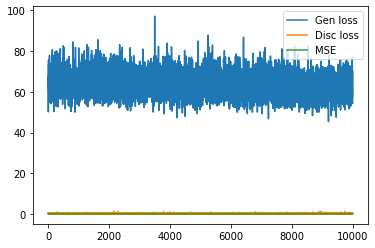

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


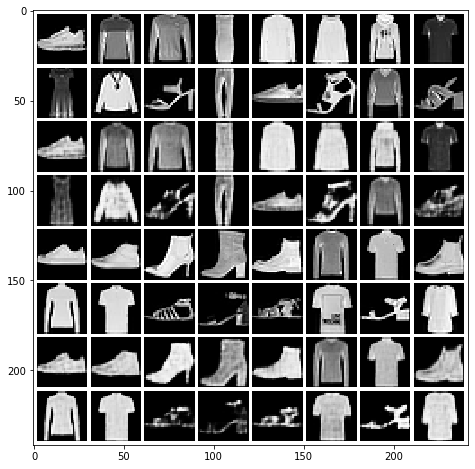

Mean squared dist: 0.018736325
epoch: 16 	 step:0 	 loss: 63.48
epoch: 16 	 step:100 	 loss: 59.3
epoch: 16 	 step:200 	 loss: 54.55
epoch: 16 	 step:300 	 loss: 59.72
epoch: 16 	 step:400 	 loss: 62.65
epoch: 16 	 step:500 	 loss: 64.79
epoch: 16 	 step:600 	 loss: 59.87
epoch: 16 	 step:700 	 loss: 60.23
epoch: 16 	 step:800 	 loss: 61.97
epoch: 16 	 step:900 	 loss: 63.6
epoch: 16 	 step:1000 	 loss: 62.84
epoch: 16 	 step:1100 	 loss: 62.71
epoch: 16 	 step:1200 	 loss: 60.47
epoch: 16 	 step:1300 	 loss: 60.72
epoch: 16 	 step:1400 	 loss: 51.39
epoch: 16 	 step:1500 	 loss: 73.16
epoch: 16 	 step:1600 	 loss: 59.11
epoch: 16 	 step:1700 	 loss: 67.28
epoch: 16 	 step:1800 	 loss: 59.09


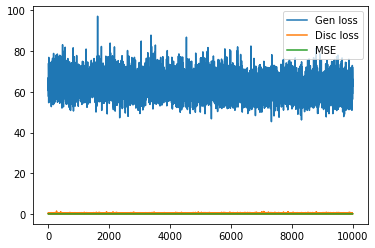

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


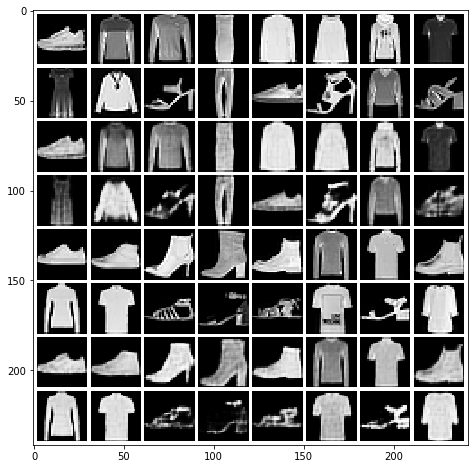

Mean squared dist: 0.018300118
epoch: 17 	 step:0 	 loss: 55.15
epoch: 17 	 step:100 	 loss: 70.46
epoch: 17 	 step:200 	 loss: 53.76
epoch: 17 	 step:300 	 loss: 70.67
epoch: 17 	 step:400 	 loss: 65.04
epoch: 17 	 step:500 	 loss: 62.89
epoch: 17 	 step:600 	 loss: 64.36
epoch: 17 	 step:700 	 loss: 67.16
epoch: 17 	 step:800 	 loss: 52.52
epoch: 17 	 step:900 	 loss: 56.04
epoch: 17 	 step:1000 	 loss: 60.04
epoch: 17 	 step:1100 	 loss: 58.31
epoch: 17 	 step:1200 	 loss: 61.44
epoch: 17 	 step:1300 	 loss: 66.49
epoch: 17 	 step:1400 	 loss: 60.82
epoch: 17 	 step:1500 	 loss: 70.67
epoch: 17 	 step:1600 	 loss: 55.78
epoch: 17 	 step:1700 	 loss: 69.44
epoch: 17 	 step:1800 	 loss: 67.27


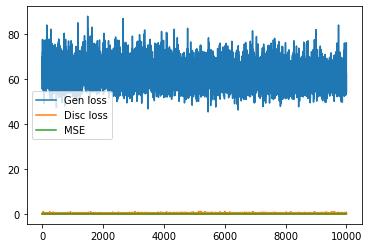

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


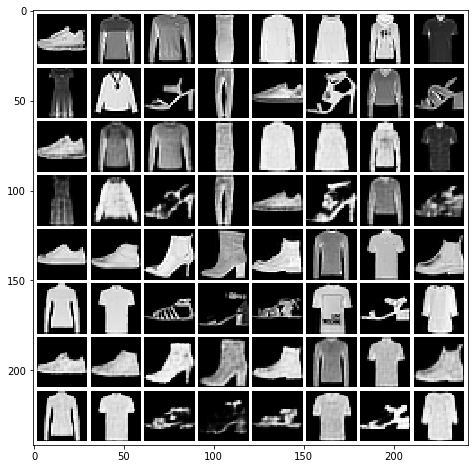

Mean squared dist: 0.018588515
epoch: 18 	 step:0 	 loss: 58.6
epoch: 18 	 step:100 	 loss: 64.01
epoch: 18 	 step:200 	 loss: 61.17
epoch: 18 	 step:300 	 loss: 60.77
epoch: 18 	 step:400 	 loss: 57.49
epoch: 18 	 step:500 	 loss: 61.59
epoch: 18 	 step:600 	 loss: 55.53
epoch: 18 	 step:700 	 loss: 67.47
epoch: 18 	 step:800 	 loss: 64.58
epoch: 18 	 step:900 	 loss: 68.93
epoch: 18 	 step:1000 	 loss: 57.96
epoch: 18 	 step:1100 	 loss: 69.25
epoch: 18 	 step:1200 	 loss: 56.86
epoch: 18 	 step:1300 	 loss: 58.67
epoch: 18 	 step:1400 	 loss: 56.87
epoch: 18 	 step:1500 	 loss: 63.6
epoch: 18 	 step:1600 	 loss: 62.19
epoch: 18 	 step:1700 	 loss: 59.8
epoch: 18 	 step:1800 	 loss: 56.2


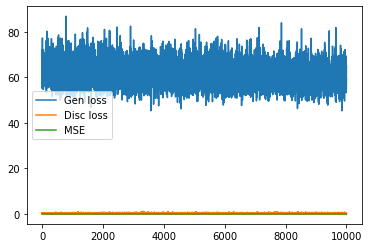

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


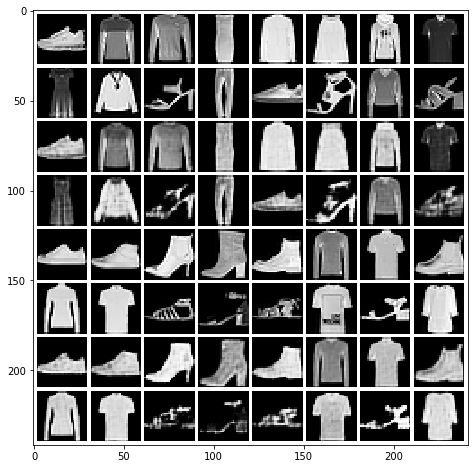

Mean squared dist: 0.018674497
epoch: 19 	 step:0 	 loss: 68.32
epoch: 19 	 step:100 	 loss: 61.06
epoch: 19 	 step:200 	 loss: 57.98
epoch: 19 	 step:300 	 loss: 61.18
epoch: 19 	 step:400 	 loss: 60.48
epoch: 19 	 step:500 	 loss: 63.41
epoch: 19 	 step:600 	 loss: 59.99
epoch: 19 	 step:700 	 loss: 64.49
epoch: 19 	 step:800 	 loss: 66.15
epoch: 19 	 step:900 	 loss: 57.53
epoch: 19 	 step:1000 	 loss: 56.89
epoch: 19 	 step:1100 	 loss: 65.91
epoch: 19 	 step:1200 	 loss: 54.62
epoch: 19 	 step:1300 	 loss: 58.74
epoch: 19 	 step:1400 	 loss: 57.04
epoch: 19 	 step:1500 	 loss: 58.7
epoch: 19 	 step:1600 	 loss: 57.77
epoch: 19 	 step:1700 	 loss: 67.85
epoch: 19 	 step:1800 	 loss: 60.94


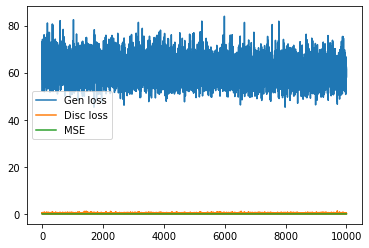

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


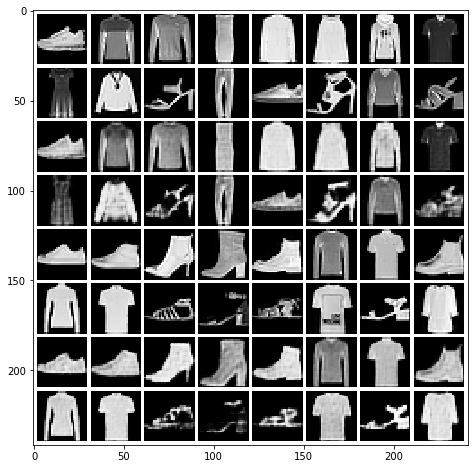

Mean squared dist: 0.018247312
epoch: 20 	 step:0 	 loss: 58.2
epoch: 20 	 step:100 	 loss: 57.5
epoch: 20 	 step:200 	 loss: 69.23
epoch: 20 	 step:300 	 loss: 62.11
epoch: 20 	 step:400 	 loss: 52.99
epoch: 20 	 step:500 	 loss: 56.24
epoch: 20 	 step:600 	 loss: 56.39
epoch: 20 	 step:700 	 loss: 58.89
epoch: 20 	 step:800 	 loss: 59.37
epoch: 20 	 step:900 	 loss: 55.64
epoch: 20 	 step:1000 	 loss: 61.6
epoch: 20 	 step:1100 	 loss: 63.7
epoch: 20 	 step:1200 	 loss: 57.53
epoch: 20 	 step:1300 	 loss: 57.28
epoch: 20 	 step:1400 	 loss: 59.02
epoch: 20 	 step:1500 	 loss: 60.03
epoch: 20 	 step:1600 	 loss: 60.65
epoch: 20 	 step:1700 	 loss: 56.78
epoch: 20 	 step:1800 	 loss: 57.28


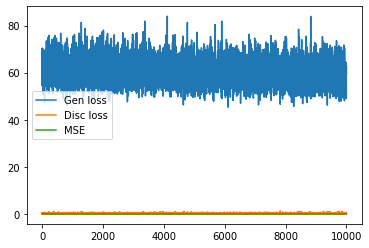

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


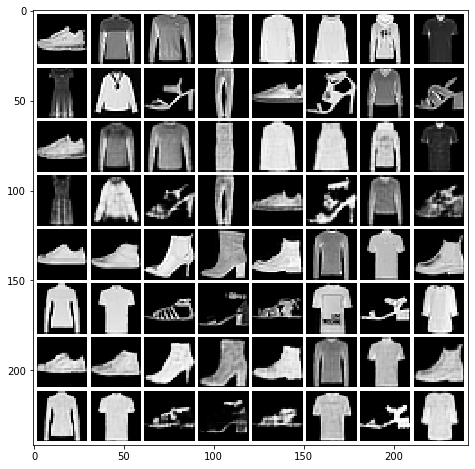

Mean squared dist: 0.018633
epoch: 21 	 step:0 	 loss: 63.75
epoch: 21 	 step:100 	 loss: 58.33
epoch: 21 	 step:200 	 loss: 54.75
epoch: 21 	 step:300 	 loss: 52.49
epoch: 21 	 step:400 	 loss: 58.17
epoch: 21 	 step:500 	 loss: 53.47
epoch: 21 	 step:600 	 loss: 58.86
epoch: 21 	 step:700 	 loss: 56.51
epoch: 21 	 step:800 	 loss: 58.28
epoch: 21 	 step:900 	 loss: 47.02
epoch: 21 	 step:1000 	 loss: 70.53
epoch: 21 	 step:1100 	 loss: 56.12
epoch: 21 	 step:1200 	 loss: 56.22
epoch: 21 	 step:1300 	 loss: 61.09
epoch: 21 	 step:1400 	 loss: 66.35
epoch: 21 	 step:1500 	 loss: 57.87
epoch: 21 	 step:1600 	 loss: 54.04
epoch: 21 	 step:1700 	 loss: 61.56
epoch: 21 	 step:1800 	 loss: 51.55


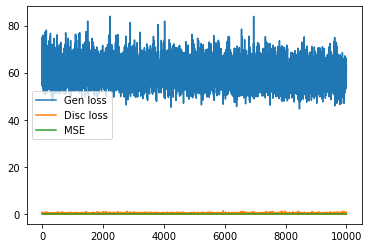

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


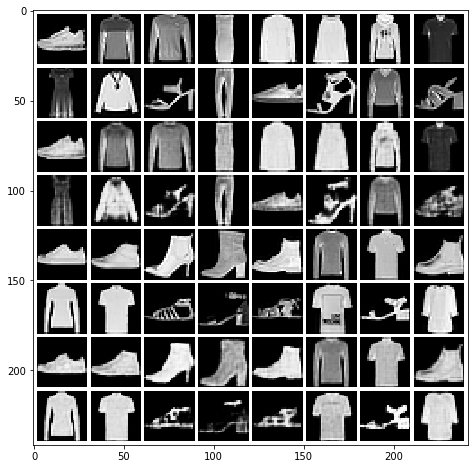

Mean squared dist: 0.018374616
epoch: 22 	 step:0 	 loss: 61.36
epoch: 22 	 step:100 	 loss: 59.63
epoch: 22 	 step:200 	 loss: 56.12
epoch: 22 	 step:300 	 loss: 62.38
epoch: 22 	 step:400 	 loss: 60.66
epoch: 22 	 step:500 	 loss: 57.47
epoch: 22 	 step:600 	 loss: 57.42
epoch: 22 	 step:700 	 loss: 53.06
epoch: 22 	 step:800 	 loss: 58.81
epoch: 22 	 step:900 	 loss: 49.24
epoch: 22 	 step:1000 	 loss: 52.33
epoch: 22 	 step:1100 	 loss: 57.32
epoch: 22 	 step:1200 	 loss: 61.8
epoch: 22 	 step:1300 	 loss: 65.88
epoch: 22 	 step:1400 	 loss: 59.37
epoch: 22 	 step:1500 	 loss: 55.52
epoch: 22 	 step:1600 	 loss: 63.28
epoch: 22 	 step:1700 	 loss: 61.14
epoch: 22 	 step:1800 	 loss: 60.85


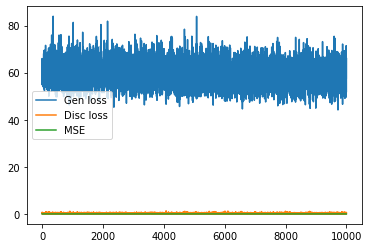

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


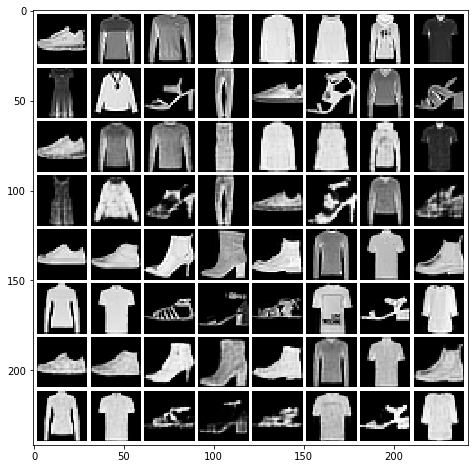

Mean squared dist: 0.01828543
epoch: 23 	 step:0 	 loss: 49.87
epoch: 23 	 step:100 	 loss: 58.66
epoch: 23 	 step:200 	 loss: 57.22
epoch: 23 	 step:300 	 loss: 51.86
epoch: 23 	 step:400 	 loss: 52.07
epoch: 23 	 step:500 	 loss: 53.26
epoch: 23 	 step:600 	 loss: 55.86
epoch: 23 	 step:700 	 loss: 57.93
epoch: 23 	 step:800 	 loss: 50.63
epoch: 23 	 step:900 	 loss: 55.62
epoch: 23 	 step:1000 	 loss: 63.06
epoch: 23 	 step:1100 	 loss: 59.25
epoch: 23 	 step:1200 	 loss: 53.29
epoch: 23 	 step:1300 	 loss: 49.35
epoch: 23 	 step:1400 	 loss: 63.25
epoch: 23 	 step:1500 	 loss: 61.98
epoch: 23 	 step:1600 	 loss: 68.01
epoch: 23 	 step:1700 	 loss: 58.73
epoch: 23 	 step:1800 	 loss: 59.23


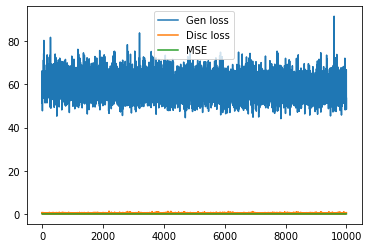

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


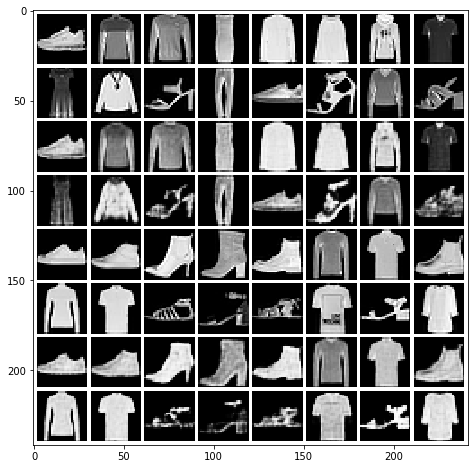

Mean squared dist: 0.018470792
epoch: 24 	 step:0 	 loss: 51.05
epoch: 24 	 step:100 	 loss: 57.93
epoch: 24 	 step:200 	 loss: 53.91
epoch: 24 	 step:300 	 loss: 54.69
epoch: 24 	 step:400 	 loss: 60.55
epoch: 24 	 step:500 	 loss: 61.68
epoch: 24 	 step:600 	 loss: 60.37
epoch: 24 	 step:700 	 loss: 63.59
epoch: 24 	 step:800 	 loss: 50.71
epoch: 24 	 step:900 	 loss: 61.14
epoch: 24 	 step:1000 	 loss: 55.9
epoch: 24 	 step:1100 	 loss: 55.91
epoch: 24 	 step:1200 	 loss: 54.3
epoch: 24 	 step:1300 	 loss: 52.48
epoch: 24 	 step:1400 	 loss: 56.77
epoch: 24 	 step:1500 	 loss: 64.79
epoch: 24 	 step:1600 	 loss: 50.51
epoch: 24 	 step:1700 	 loss: 61.37
epoch: 24 	 step:1800 	 loss: 60.4


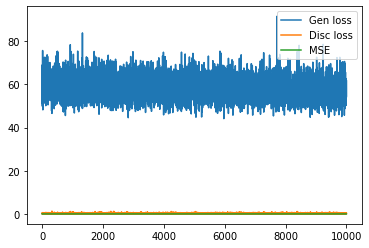

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


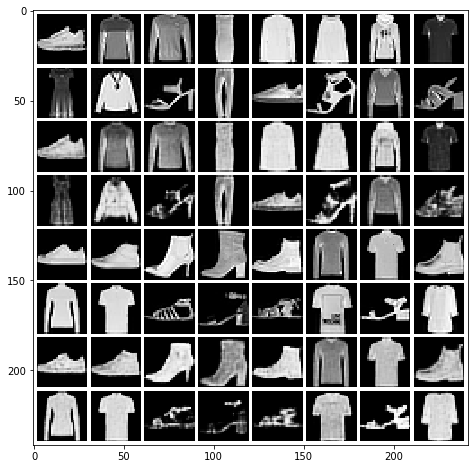

Mean squared dist: 0.018352006
epoch: 25 	 step:0 	 loss: 55.43
epoch: 25 	 step:100 	 loss: 55.79
epoch: 25 	 step:200 	 loss: 49.85
epoch: 25 	 step:300 	 loss: 57.94
epoch: 25 	 step:400 	 loss: 55.73
epoch: 25 	 step:500 	 loss: 59.35
epoch: 25 	 step:600 	 loss: 64.09
epoch: 25 	 step:700 	 loss: 52.14
epoch: 25 	 step:800 	 loss: 56.78
epoch: 25 	 step:900 	 loss: 61.8
epoch: 25 	 step:1000 	 loss: 56.66
epoch: 25 	 step:1100 	 loss: 57.04
epoch: 25 	 step:1200 	 loss: 60.66
epoch: 25 	 step:1300 	 loss: 64.07
epoch: 25 	 step:1400 	 loss: 64.3
epoch: 25 	 step:1500 	 loss: 50.46
epoch: 25 	 step:1600 	 loss: 61.32
epoch: 25 	 step:1700 	 loss: 54.01
epoch: 25 	 step:1800 	 loss: 61.27


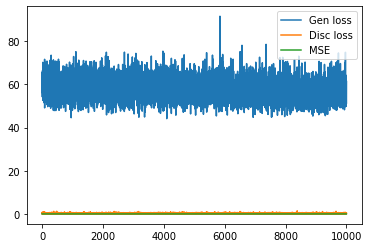

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


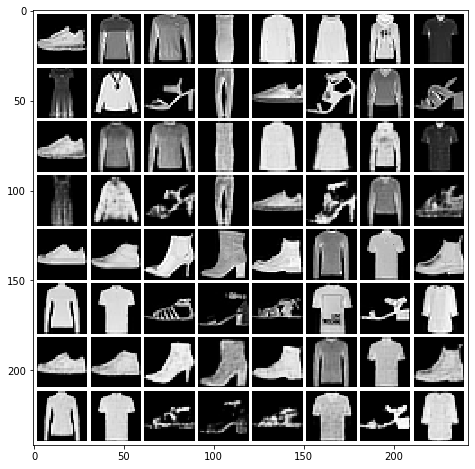

Mean squared dist: 0.018032966
epoch: 26 	 step:0 	 loss: 49.08
epoch: 26 	 step:100 	 loss: 58.12
epoch: 26 	 step:200 	 loss: 63.9
epoch: 26 	 step:300 	 loss: 56.28
epoch: 26 	 step:400 	 loss: 53.13
epoch: 26 	 step:500 	 loss: 57.18
epoch: 26 	 step:600 	 loss: 57.5
epoch: 26 	 step:700 	 loss: 56.5
epoch: 26 	 step:800 	 loss: 53.55
epoch: 26 	 step:900 	 loss: 52.56
epoch: 26 	 step:1000 	 loss: 61.97
epoch: 26 	 step:1100 	 loss: 59.29
epoch: 26 	 step:1200 	 loss: 55.82
epoch: 26 	 step:1300 	 loss: 62.05
epoch: 26 	 step:1400 	 loss: 52.71
epoch: 26 	 step:1500 	 loss: 54.15
epoch: 26 	 step:1600 	 loss: 61.18
epoch: 26 	 step:1700 	 loss: 50.08
epoch: 26 	 step:1800 	 loss: 60.33


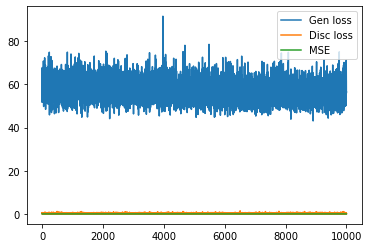

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


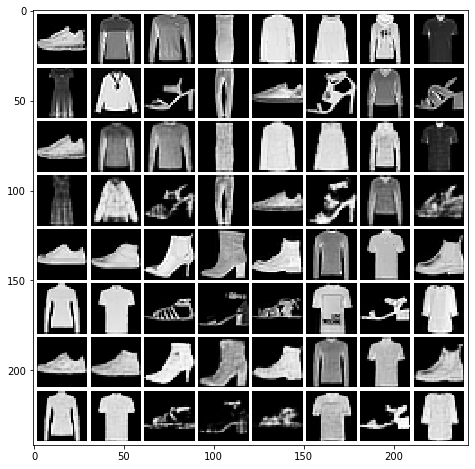

Mean squared dist: 0.01805331
epoch: 27 	 step:0 	 loss: 55.11
epoch: 27 	 step:100 	 loss: 55.46
epoch: 27 	 step:200 	 loss: 54.74
epoch: 27 	 step:300 	 loss: 57.59
epoch: 27 	 step:400 	 loss: 60.38
epoch: 27 	 step:500 	 loss: 57.83
epoch: 27 	 step:600 	 loss: 58.13
epoch: 27 	 step:700 	 loss: 54.8
epoch: 27 	 step:800 	 loss: 61.67
epoch: 27 	 step:900 	 loss: 50.27
epoch: 27 	 step:1000 	 loss: 57.37
epoch: 27 	 step:1100 	 loss: 57.71
epoch: 27 	 step:1200 	 loss: 61.43
epoch: 27 	 step:1300 	 loss: 56.67
epoch: 27 	 step:1400 	 loss: 58.54
epoch: 27 	 step:1500 	 loss: 61.35
epoch: 27 	 step:1600 	 loss: 63.17
epoch: 27 	 step:1700 	 loss: 65.78
epoch: 27 	 step:1800 	 loss: 58.37


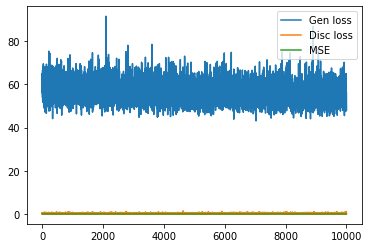

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


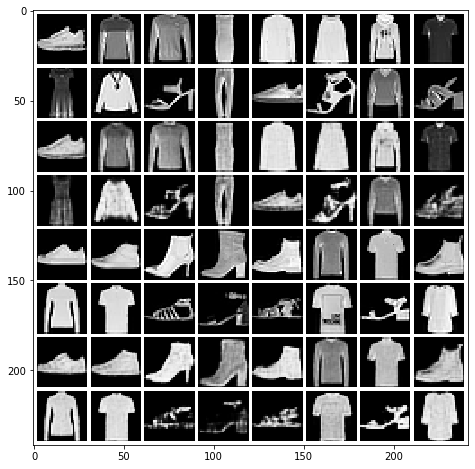

Mean squared dist: 0.01812545
epoch: 28 	 step:0 	 loss: 48.13
epoch: 28 	 step:100 	 loss: 55.93
epoch: 28 	 step:200 	 loss: 53.11
epoch: 28 	 step:300 	 loss: 54.86
epoch: 28 	 step:400 	 loss: 50.82
epoch: 28 	 step:500 	 loss: 53.73
epoch: 28 	 step:600 	 loss: 60.86
epoch: 28 	 step:700 	 loss: 51.62
epoch: 28 	 step:800 	 loss: 62.26
epoch: 28 	 step:900 	 loss: 60.06
epoch: 28 	 step:1000 	 loss: 63.29
epoch: 28 	 step:1100 	 loss: 60.39
epoch: 28 	 step:1200 	 loss: 55.6
epoch: 28 	 step:1300 	 loss: 51.33
epoch: 28 	 step:1400 	 loss: 50.79
epoch: 28 	 step:1500 	 loss: 56.75
epoch: 28 	 step:1600 	 loss: 53.44
epoch: 28 	 step:1700 	 loss: 65.23
epoch: 28 	 step:1800 	 loss: 60.08


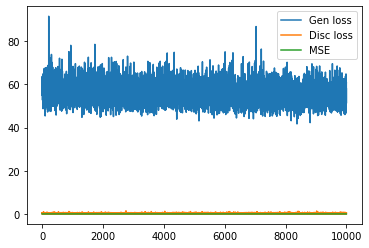

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


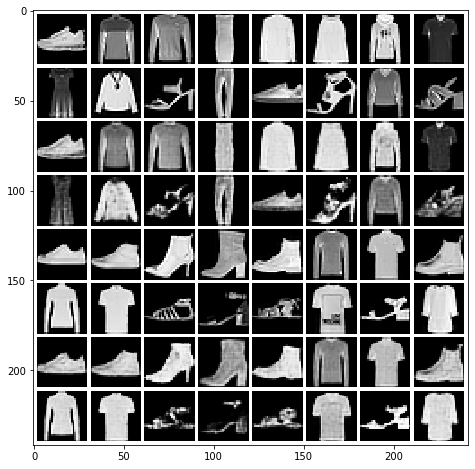

Mean squared dist: 0.018237112
epoch: 29 	 step:0 	 loss: 51.86
epoch: 29 	 step:100 	 loss: 49.16
epoch: 29 	 step:200 	 loss: 48.31
epoch: 29 	 step:300 	 loss: 53.1
epoch: 29 	 step:400 	 loss: 56.77
epoch: 29 	 step:500 	 loss: 50.48
epoch: 29 	 step:600 	 loss: 46.53
epoch: 29 	 step:700 	 loss: 64.59
epoch: 29 	 step:800 	 loss: 56.63
epoch: 29 	 step:900 	 loss: 60.38
epoch: 29 	 step:1000 	 loss: 54.92
epoch: 29 	 step:1100 	 loss: 59.94
epoch: 29 	 step:1200 	 loss: 52.74
epoch: 29 	 step:1300 	 loss: 49.68
epoch: 29 	 step:1400 	 loss: 57.27
epoch: 29 	 step:1500 	 loss: 60.22
epoch: 29 	 step:1600 	 loss: 56.31
epoch: 29 	 step:1700 	 loss: 47.99
epoch: 29 	 step:1800 	 loss: 54.09


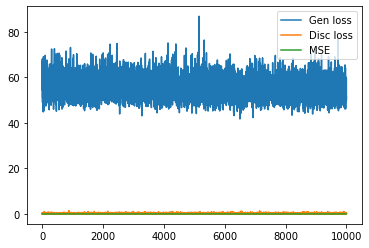

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


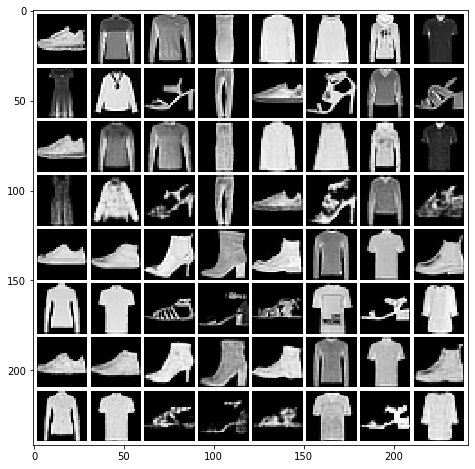

Mean squared dist: 0.018280769
epoch: 30 	 step:0 	 loss: 47.91
epoch: 30 	 step:100 	 loss: 55.72
epoch: 30 	 step:200 	 loss: 56.04
epoch: 30 	 step:300 	 loss: 55.27
epoch: 30 	 step:400 	 loss: 56.2
epoch: 30 	 step:500 	 loss: 55.58
epoch: 30 	 step:600 	 loss: 52.82
epoch: 30 	 step:700 	 loss: 50.57
epoch: 30 	 step:800 	 loss: 55.59
epoch: 30 	 step:900 	 loss: 51.68
epoch: 30 	 step:1000 	 loss: 61.94
epoch: 30 	 step:1100 	 loss: 54.22
epoch: 30 	 step:1200 	 loss: 55.5
epoch: 30 	 step:1300 	 loss: 59.1
epoch: 30 	 step:1400 	 loss: 45.96
epoch: 30 	 step:1500 	 loss: 59.91
epoch: 30 	 step:1600 	 loss: 54.93
epoch: 30 	 step:1700 	 loss: 51.22
epoch: 30 	 step:1800 	 loss: 60.03


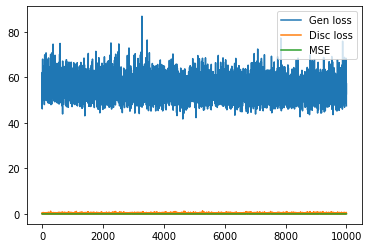

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


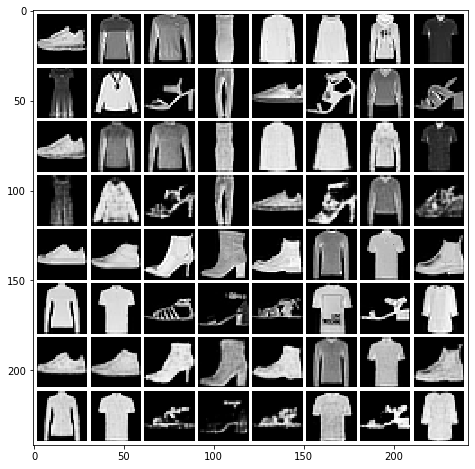

Mean squared dist: 0.017943205
epoch: 31 	 step:0 	 loss: 50.37
epoch: 31 	 step:100 	 loss: 56.25
epoch: 31 	 step:200 	 loss: 53.83
epoch: 31 	 step:300 	 loss: 56.59
epoch: 31 	 step:400 	 loss: 52.67
epoch: 31 	 step:500 	 loss: 47.19
epoch: 31 	 step:600 	 loss: 57.47
epoch: 31 	 step:700 	 loss: 56.01
epoch: 31 	 step:800 	 loss: 56.97
epoch: 31 	 step:900 	 loss: 51.95
epoch: 31 	 step:1000 	 loss: 49.39
epoch: 31 	 step:1100 	 loss: 60.97
epoch: 31 	 step:1200 	 loss: 50.16
epoch: 31 	 step:1300 	 loss: 55.21
epoch: 31 	 step:1400 	 loss: 56.71
epoch: 31 	 step:1500 	 loss: 55.76
epoch: 31 	 step:1600 	 loss: 53.21
epoch: 31 	 step:1700 	 loss: 47.04
epoch: 31 	 step:1800 	 loss: 54.32


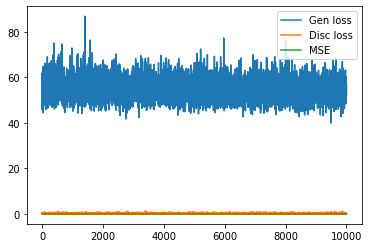

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


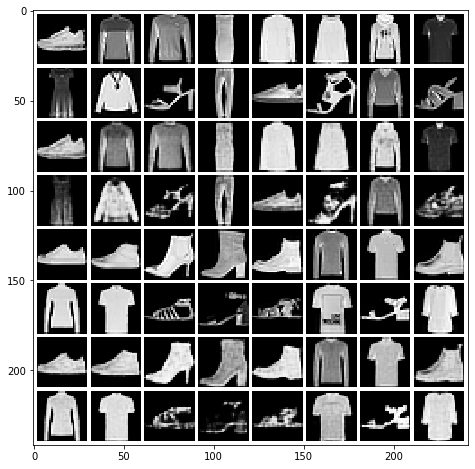

Mean squared dist: 0.01826518
epoch: 32 	 step:0 	 loss: 48.26
epoch: 32 	 step:100 	 loss: 49.83
epoch: 32 	 step:200 	 loss: 53.12
epoch: 32 	 step:300 	 loss: 54.6
epoch: 32 	 step:400 	 loss: 52.08
epoch: 32 	 step:500 	 loss: 47.9
epoch: 32 	 step:600 	 loss: 46.04
epoch: 32 	 step:700 	 loss: 50.93
epoch: 32 	 step:800 	 loss: 65.45
epoch: 32 	 step:900 	 loss: 52.26
epoch: 32 	 step:1000 	 loss: 58.64
epoch: 32 	 step:1100 	 loss: 58.59
epoch: 32 	 step:1200 	 loss: 54.42
epoch: 32 	 step:1300 	 loss: 53.92
epoch: 32 	 step:1400 	 loss: 61.57
epoch: 32 	 step:1500 	 loss: 56.46
epoch: 32 	 step:1600 	 loss: 46.71
epoch: 32 	 step:1700 	 loss: 48.99
epoch: 32 	 step:1800 	 loss: 53.11


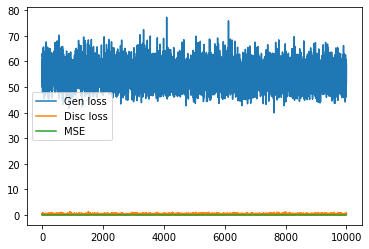

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


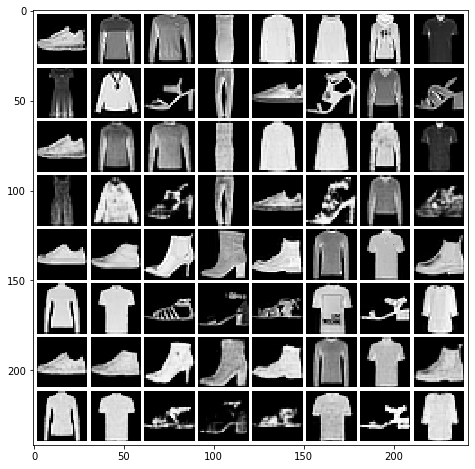

Mean squared dist: 0.018518021
epoch: 33 	 step:0 	 loss: 48.48
epoch: 33 	 step:100 	 loss: 54.24
epoch: 33 	 step:200 	 loss: 50.56
epoch: 33 	 step:300 	 loss: 51.65
epoch: 33 	 step:400 	 loss: 53.43
epoch: 33 	 step:500 	 loss: 52.68
epoch: 33 	 step:600 	 loss: 57.0
epoch: 33 	 step:700 	 loss: 57.66
epoch: 33 	 step:800 	 loss: 46.87
epoch: 33 	 step:900 	 loss: 48.94
epoch: 33 	 step:1000 	 loss: 50.04
epoch: 33 	 step:1100 	 loss: 51.6
epoch: 33 	 step:1200 	 loss: 59.64
epoch: 33 	 step:1300 	 loss: 49.84
epoch: 33 	 step:1400 	 loss: 56.47
epoch: 33 	 step:1500 	 loss: 60.0
epoch: 33 	 step:1600 	 loss: 49.16
epoch: 33 	 step:1700 	 loss: 53.97
epoch: 33 	 step:1800 	 loss: 48.5


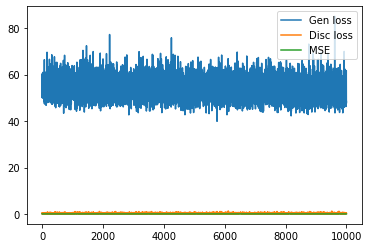

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


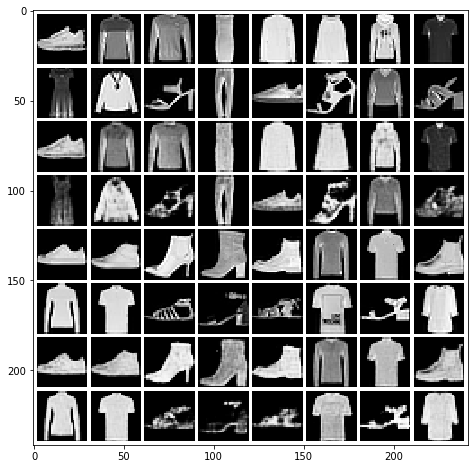

Mean squared dist: 0.018426148
epoch: 34 	 step:0 	 loss: 53.91
epoch: 34 	 step:100 	 loss: 51.8
epoch: 34 	 step:200 	 loss: 58.68
epoch: 34 	 step:300 	 loss: 50.31
epoch: 34 	 step:400 	 loss: 52.61
epoch: 34 	 step:500 	 loss: 47.89
epoch: 34 	 step:600 	 loss: 44.71
epoch: 34 	 step:700 	 loss: 49.58
epoch: 34 	 step:800 	 loss: 53.18
epoch: 34 	 step:900 	 loss: 48.77
epoch: 34 	 step:1000 	 loss: 51.7
epoch: 34 	 step:1100 	 loss: 59.27
epoch: 34 	 step:1200 	 loss: 57.5
epoch: 34 	 step:1300 	 loss: 54.71
epoch: 34 	 step:1400 	 loss: 49.11
epoch: 34 	 step:1500 	 loss: 52.35
epoch: 34 	 step:1600 	 loss: 59.47
epoch: 34 	 step:1700 	 loss: 50.52
epoch: 34 	 step:1800 	 loss: 51.4


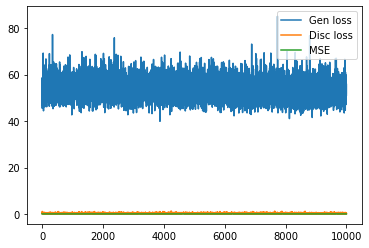

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


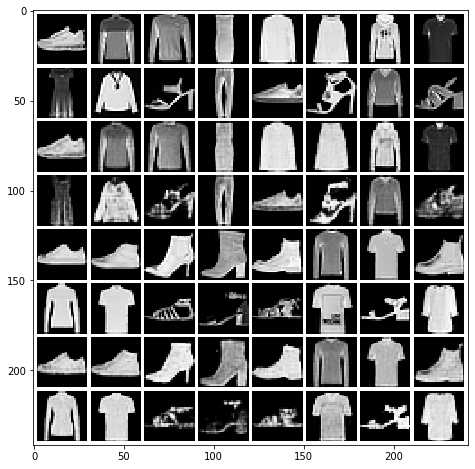

Mean squared dist: 0.01811044
epoch: 35 	 step:0 	 loss: 51.27
epoch: 35 	 step:100 	 loss: 55.34
epoch: 35 	 step:200 	 loss: 54.88
epoch: 35 	 step:300 	 loss: 48.58
epoch: 35 	 step:400 	 loss: 44.35
epoch: 35 	 step:500 	 loss: 45.3
epoch: 35 	 step:600 	 loss: 53.99
epoch: 35 	 step:700 	 loss: 49.14
epoch: 35 	 step:800 	 loss: 47.95
epoch: 35 	 step:900 	 loss: 48.94
epoch: 35 	 step:1000 	 loss: 50.96
epoch: 35 	 step:1100 	 loss: 56.3
epoch: 35 	 step:1200 	 loss: 47.31
epoch: 35 	 step:1300 	 loss: 52.6
epoch: 35 	 step:1400 	 loss: 56.44
epoch: 35 	 step:1500 	 loss: 48.4
epoch: 35 	 step:1600 	 loss: 48.46
epoch: 35 	 step:1700 	 loss: 50.28
epoch: 35 	 step:1800 	 loss: 49.14


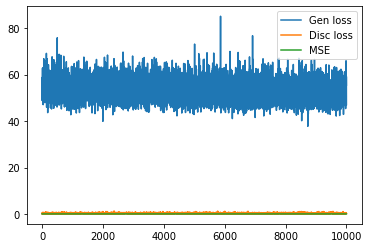

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


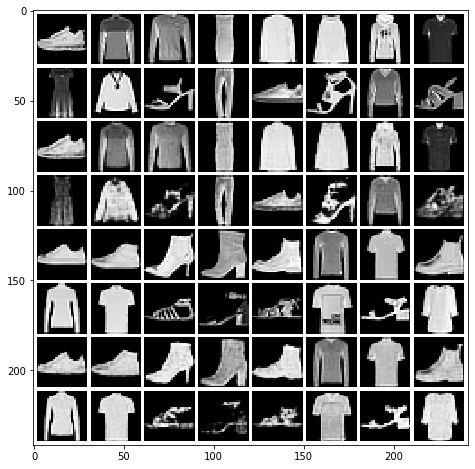

Mean squared dist: 0.01839696
epoch: 36 	 step:0 	 loss: 63.4
epoch: 36 	 step:100 	 loss: 52.43
epoch: 36 	 step:200 	 loss: 52.61
epoch: 36 	 step:300 	 loss: 48.24
epoch: 36 	 step:400 	 loss: 52.7
epoch: 36 	 step:500 	 loss: 45.7
epoch: 36 	 step:600 	 loss: 51.15
epoch: 36 	 step:700 	 loss: 49.22
epoch: 36 	 step:800 	 loss: 51.82
epoch: 36 	 step:900 	 loss: 54.95
epoch: 36 	 step:1000 	 loss: 52.16
epoch: 36 	 step:1100 	 loss: 52.53
epoch: 36 	 step:1200 	 loss: 55.62
epoch: 36 	 step:1300 	 loss: 55.52
epoch: 36 	 step:1400 	 loss: 52.01
epoch: 36 	 step:1500 	 loss: 57.72
epoch: 36 	 step:1600 	 loss: 53.79
epoch: 36 	 step:1700 	 loss: 54.71
epoch: 36 	 step:1800 	 loss: 48.71


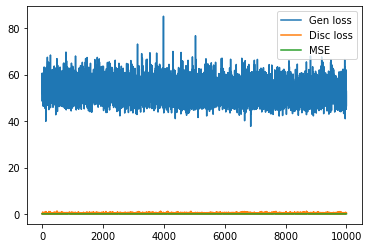

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


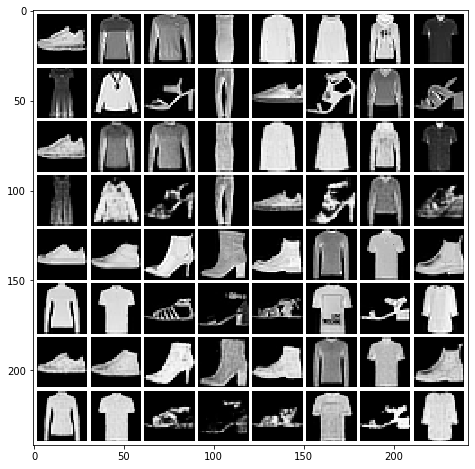

Mean squared dist: 0.018347275
epoch: 37 	 step:0 	 loss: 50.23
epoch: 37 	 step:100 	 loss: 51.52
epoch: 37 	 step:200 	 loss: 51.33
epoch: 37 	 step:300 	 loss: 54.48
epoch: 37 	 step:400 	 loss: 50.08
epoch: 37 	 step:500 	 loss: 47.55
epoch: 37 	 step:600 	 loss: 46.98
epoch: 37 	 step:700 	 loss: 48.95
epoch: 37 	 step:800 	 loss: 51.4
epoch: 37 	 step:900 	 loss: 53.64
epoch: 37 	 step:1000 	 loss: 45.61
epoch: 37 	 step:1100 	 loss: 53.2
epoch: 37 	 step:1200 	 loss: 51.02
epoch: 37 	 step:1300 	 loss: 47.84
epoch: 37 	 step:1400 	 loss: 55.27
epoch: 37 	 step:1500 	 loss: 46.5
epoch: 37 	 step:1600 	 loss: 52.02
epoch: 37 	 step:1700 	 loss: 56.52
epoch: 37 	 step:1800 	 loss: 52.06


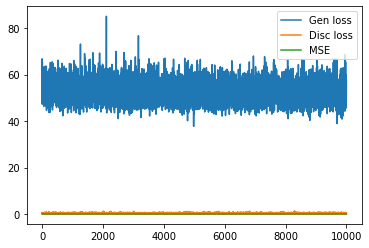

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


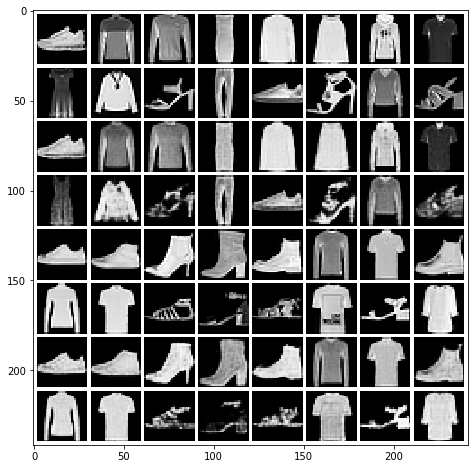

Mean squared dist: 0.017679794
epoch: 38 	 step:0 	 loss: 51.51
epoch: 38 	 step:100 	 loss: 48.59
epoch: 38 	 step:200 	 loss: 48.56
epoch: 38 	 step:300 	 loss: 53.87
epoch: 38 	 step:400 	 loss: 56.63
epoch: 38 	 step:500 	 loss: 52.9
epoch: 38 	 step:600 	 loss: 53.26
epoch: 38 	 step:700 	 loss: 49.43
epoch: 38 	 step:800 	 loss: 49.38
epoch: 38 	 step:900 	 loss: 54.4
epoch: 38 	 step:1000 	 loss: 63.47
epoch: 38 	 step:1100 	 loss: 50.92
epoch: 38 	 step:1200 	 loss: 49.17
epoch: 38 	 step:1300 	 loss: 57.28
epoch: 38 	 step:1400 	 loss: 44.91
epoch: 38 	 step:1500 	 loss: 61.05
epoch: 38 	 step:1600 	 loss: 54.57
epoch: 38 	 step:1700 	 loss: 46.73
epoch: 38 	 step:1800 	 loss: 53.63


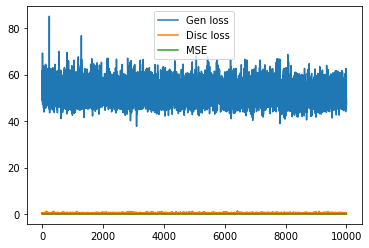

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


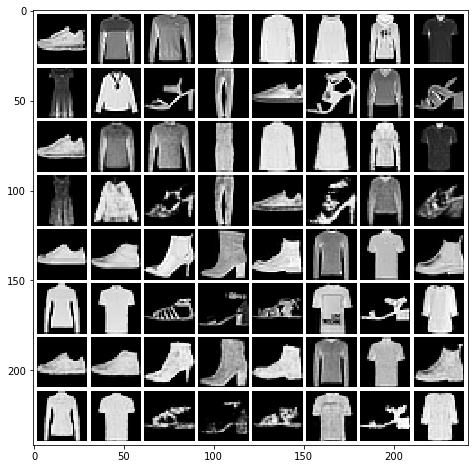

Mean squared dist: 0.01824983
epoch: 39 	 step:0 	 loss: 52.1
epoch: 39 	 step:100 	 loss: 52.83
epoch: 39 	 step:200 	 loss: 43.93
epoch: 39 	 step:300 	 loss: 48.7
epoch: 39 	 step:400 	 loss: 51.55
epoch: 39 	 step:500 	 loss: 45.94
epoch: 39 	 step:600 	 loss: 48.11
epoch: 39 	 step:700 	 loss: 50.68
epoch: 39 	 step:800 	 loss: 48.53
epoch: 39 	 step:900 	 loss: 44.82
epoch: 39 	 step:1000 	 loss: 55.06
epoch: 39 	 step:1100 	 loss: 53.54
epoch: 39 	 step:1200 	 loss: 56.19
epoch: 39 	 step:1300 	 loss: 47.01
epoch: 39 	 step:1400 	 loss: 53.73
epoch: 39 	 step:1500 	 loss: 56.78
epoch: 39 	 step:1600 	 loss: 52.26
epoch: 39 	 step:1700 	 loss: 51.06
epoch: 39 	 step:1800 	 loss: 55.35


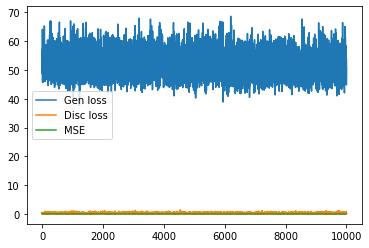

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


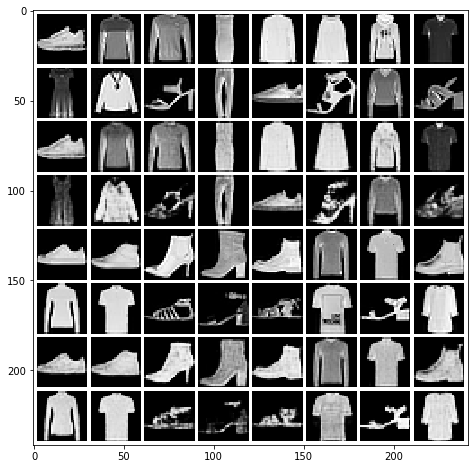

Mean squared dist: 0.018083699
epoch: 40 	 step:0 	 loss: 47.51
epoch: 40 	 step:100 	 loss: 50.89
epoch: 40 	 step:200 	 loss: 50.17
epoch: 40 	 step:300 	 loss: 51.19
epoch: 40 	 step:400 	 loss: 49.2
epoch: 40 	 step:500 	 loss: 45.49
epoch: 40 	 step:600 	 loss: 46.74
epoch: 40 	 step:700 	 loss: 49.41
epoch: 40 	 step:800 	 loss: 58.95
epoch: 40 	 step:900 	 loss: 46.39
epoch: 40 	 step:1000 	 loss: 46.86
epoch: 40 	 step:1100 	 loss: 50.55
epoch: 40 	 step:1200 	 loss: 54.68
epoch: 40 	 step:1300 	 loss: 51.6
epoch: 40 	 step:1400 	 loss: 51.9
epoch: 40 	 step:1500 	 loss: 57.22
epoch: 40 	 step:1600 	 loss: 54.9
epoch: 40 	 step:1700 	 loss: 54.73
epoch: 40 	 step:1800 	 loss: 54.62


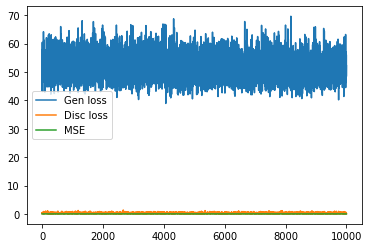

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


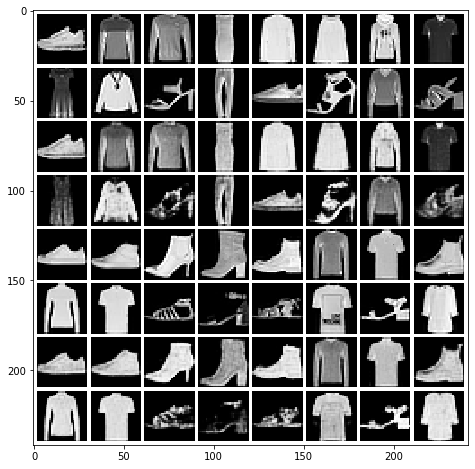

Mean squared dist: 0.018291902
epoch: 41 	 step:0 	 loss: 60.55
epoch: 41 	 step:100 	 loss: 52.43
epoch: 41 	 step:200 	 loss: 47.85
epoch: 41 	 step:300 	 loss: 46.35
epoch: 41 	 step:400 	 loss: 54.71
epoch: 41 	 step:500 	 loss: 50.54
epoch: 41 	 step:600 	 loss: 58.54
epoch: 41 	 step:700 	 loss: 42.21
epoch: 41 	 step:800 	 loss: 47.26
epoch: 41 	 step:900 	 loss: 44.51
epoch: 41 	 step:1000 	 loss: 47.16
epoch: 41 	 step:1100 	 loss: 52.18
epoch: 41 	 step:1200 	 loss: 52.34
epoch: 41 	 step:1300 	 loss: 53.24
epoch: 41 	 step:1400 	 loss: 53.98
epoch: 41 	 step:1500 	 loss: 54.82
epoch: 41 	 step:1600 	 loss: 53.11
epoch: 41 	 step:1700 	 loss: 47.48
epoch: 41 	 step:1800 	 loss: 50.51


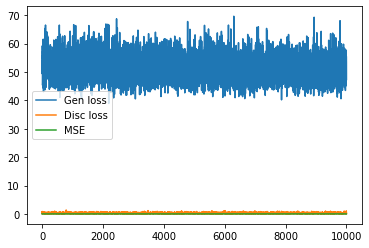

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


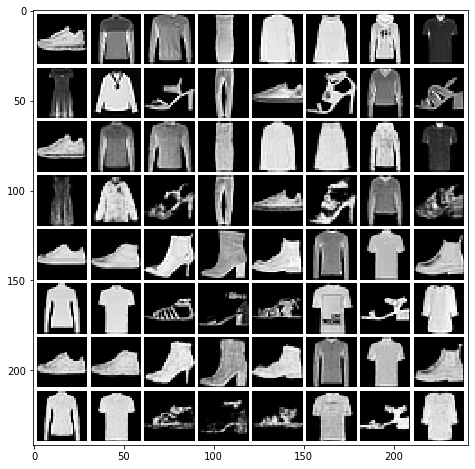

Mean squared dist: 0.017837353
epoch: 42 	 step:0 	 loss: 45.38
epoch: 42 	 step:100 	 loss: 50.56
epoch: 42 	 step:200 	 loss: 55.52
epoch: 42 	 step:300 	 loss: 49.59
epoch: 42 	 step:400 	 loss: 49.92
epoch: 42 	 step:500 	 loss: 54.07
epoch: 42 	 step:600 	 loss: 41.75
epoch: 42 	 step:700 	 loss: 50.01
epoch: 42 	 step:800 	 loss: 47.35
epoch: 42 	 step:900 	 loss: 48.72
epoch: 42 	 step:1000 	 loss: 42.35
epoch: 42 	 step:1100 	 loss: 51.52
epoch: 42 	 step:1200 	 loss: 44.47
epoch: 42 	 step:1300 	 loss: 54.74
epoch: 42 	 step:1400 	 loss: 45.84
epoch: 42 	 step:1500 	 loss: 55.84
epoch: 42 	 step:1600 	 loss: 44.78
epoch: 42 	 step:1700 	 loss: 46.94
epoch: 42 	 step:1800 	 loss: 55.24


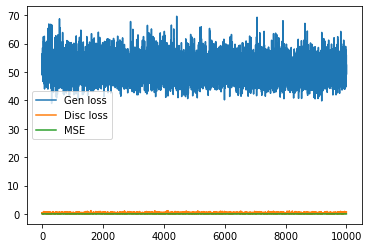

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


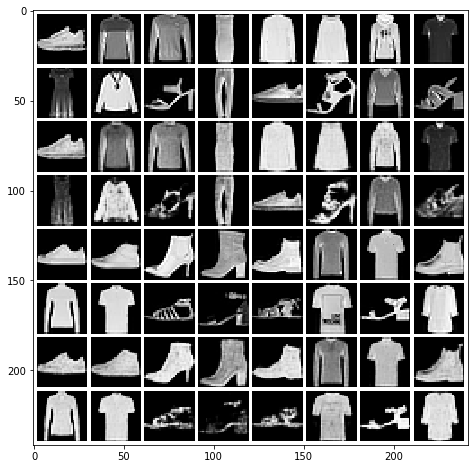

Mean squared dist: 0.01815988
epoch: 43 	 step:0 	 loss: 47.89
epoch: 43 	 step:100 	 loss: 53.07
epoch: 43 	 step:200 	 loss: 47.95
epoch: 43 	 step:300 	 loss: 50.7
epoch: 43 	 step:400 	 loss: 48.08
epoch: 43 	 step:500 	 loss: 54.97
epoch: 43 	 step:600 	 loss: 46.99
epoch: 43 	 step:700 	 loss: 47.29
epoch: 43 	 step:800 	 loss: 49.01
epoch: 43 	 step:900 	 loss: 53.87
epoch: 43 	 step:1000 	 loss: 51.33
epoch: 43 	 step:1100 	 loss: 52.95
epoch: 43 	 step:1200 	 loss: 44.27
epoch: 43 	 step:1300 	 loss: 49.33
epoch: 43 	 step:1400 	 loss: 51.54
epoch: 43 	 step:1500 	 loss: 44.39
epoch: 43 	 step:1600 	 loss: 44.97
epoch: 43 	 step:1700 	 loss: 50.94
epoch: 43 	 step:1800 	 loss: 53.45


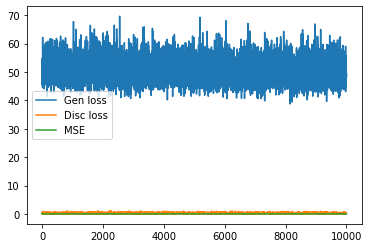

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


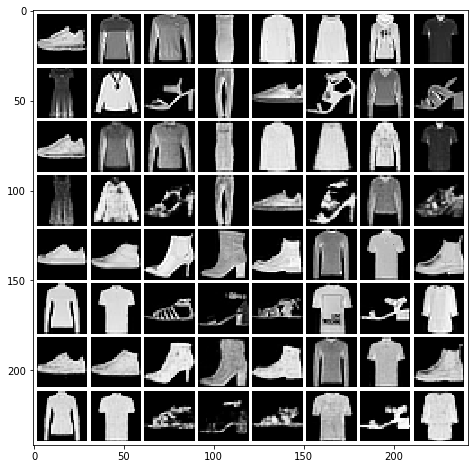

Mean squared dist: 0.018486412
epoch: 44 	 step:0 	 loss: 47.2
epoch: 44 	 step:100 	 loss: 50.56
epoch: 44 	 step:200 	 loss: 50.66
epoch: 44 	 step:300 	 loss: 49.9
epoch: 44 	 step:400 	 loss: 51.67
epoch: 44 	 step:500 	 loss: 45.26
epoch: 44 	 step:600 	 loss: 51.91
epoch: 44 	 step:700 	 loss: 53.79
epoch: 44 	 step:800 	 loss: 47.45
epoch: 44 	 step:900 	 loss: 49.36
epoch: 44 	 step:1000 	 loss: 47.92
epoch: 44 	 step:1100 	 loss: 52.19
epoch: 44 	 step:1200 	 loss: 54.5
epoch: 44 	 step:1300 	 loss: 49.36
epoch: 44 	 step:1400 	 loss: 51.11
epoch: 44 	 step:1500 	 loss: 49.61
epoch: 44 	 step:1600 	 loss: 54.56
epoch: 44 	 step:1700 	 loss: 50.98
epoch: 44 	 step:1800 	 loss: 48.75


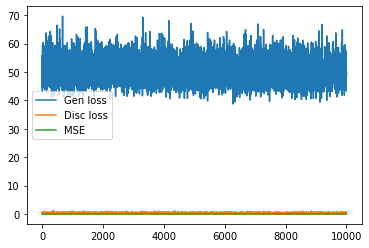

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


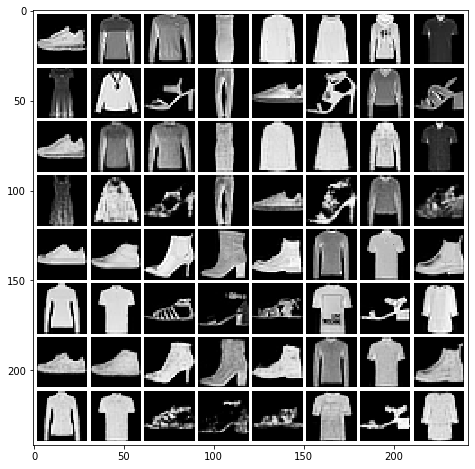

Mean squared dist: 0.017887922
epoch: 45 	 step:0 	 loss: 48.51
epoch: 45 	 step:100 	 loss: 51.64
epoch: 45 	 step:200 	 loss: 45.73
epoch: 45 	 step:300 	 loss: 50.2
epoch: 45 	 step:400 	 loss: 45.98
epoch: 45 	 step:500 	 loss: 61.66
epoch: 45 	 step:600 	 loss: 47.5
epoch: 45 	 step:700 	 loss: 48.64
epoch: 45 	 step:800 	 loss: 42.64
epoch: 45 	 step:900 	 loss: 51.81
epoch: 45 	 step:1000 	 loss: 52.47
epoch: 45 	 step:1100 	 loss: 48.14
epoch: 45 	 step:1200 	 loss: 46.15
epoch: 45 	 step:1300 	 loss: 47.49
epoch: 45 	 step:1400 	 loss: 50.52
epoch: 45 	 step:1500 	 loss: 44.05
epoch: 45 	 step:1600 	 loss: 50.4
epoch: 45 	 step:1700 	 loss: 58.39
epoch: 45 	 step:1800 	 loss: 48.04


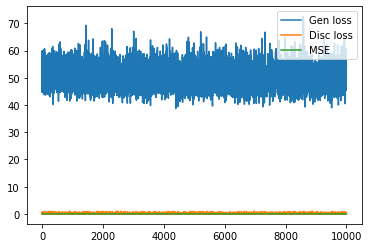

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


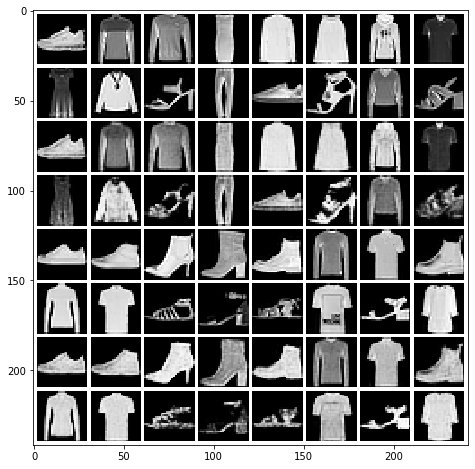

Mean squared dist: 0.018053632
epoch: 46 	 step:0 	 loss: 49.58
epoch: 46 	 step:100 	 loss: 47.69
epoch: 46 	 step:200 	 loss: 52.99
epoch: 46 	 step:300 	 loss: 49.53
epoch: 46 	 step:400 	 loss: 50.75
epoch: 46 	 step:500 	 loss: 47.7
epoch: 46 	 step:600 	 loss: 52.69
epoch: 46 	 step:700 	 loss: 47.22
epoch: 46 	 step:800 	 loss: 47.81
epoch: 46 	 step:900 	 loss: 54.42
epoch: 46 	 step:1000 	 loss: 52.71
epoch: 46 	 step:1100 	 loss: 53.63
epoch: 46 	 step:1200 	 loss: 45.28
epoch: 46 	 step:1300 	 loss: 57.87
epoch: 46 	 step:1400 	 loss: 50.53
epoch: 46 	 step:1500 	 loss: 49.18
epoch: 46 	 step:1600 	 loss: 43.09
epoch: 46 	 step:1700 	 loss: 51.78
epoch: 46 	 step:1800 	 loss: 54.07


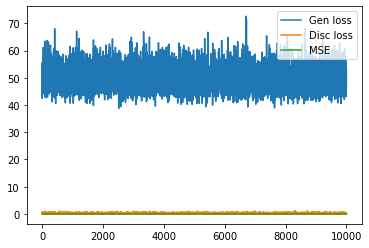

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


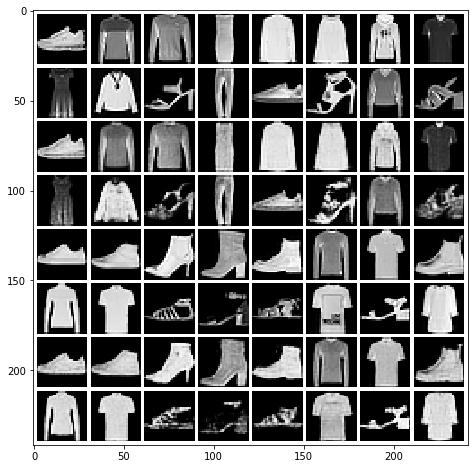

Mean squared dist: 0.018154833
epoch: 47 	 step:0 	 loss: 42.57
epoch: 47 	 step:100 	 loss: 46.81
epoch: 47 	 step:200 	 loss: 51.02
epoch: 47 	 step:300 	 loss: 55.67
epoch: 47 	 step:400 	 loss: 43.63
epoch: 47 	 step:500 	 loss: 51.92
epoch: 47 	 step:600 	 loss: 43.01
epoch: 47 	 step:700 	 loss: 42.47
epoch: 47 	 step:800 	 loss: 48.16
epoch: 47 	 step:900 	 loss: 45.33
epoch: 47 	 step:1000 	 loss: 52.06
epoch: 47 	 step:1100 	 loss: 55.19
epoch: 47 	 step:1200 	 loss: 53.06
epoch: 47 	 step:1300 	 loss: 45.61
epoch: 47 	 step:1400 	 loss: 54.39
epoch: 47 	 step:1500 	 loss: 49.21
epoch: 47 	 step:1600 	 loss: 46.43
epoch: 47 	 step:1700 	 loss: 49.43
epoch: 47 	 step:1800 	 loss: 51.91


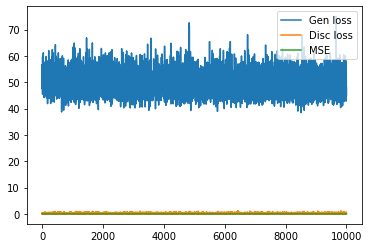

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


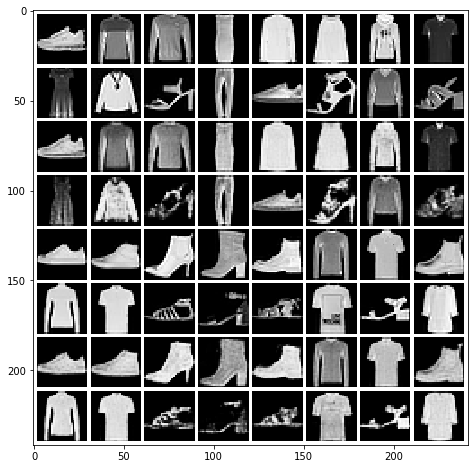

Mean squared dist: 0.017865067
epoch: 48 	 step:0 	 loss: 43.56
epoch: 48 	 step:100 	 loss: 47.51
epoch: 48 	 step:200 	 loss: 47.52
epoch: 48 	 step:300 	 loss: 53.23
epoch: 48 	 step:400 	 loss: 44.07
epoch: 48 	 step:500 	 loss: 50.54
epoch: 48 	 step:600 	 loss: 59.61
epoch: 48 	 step:700 	 loss: 45.51
epoch: 48 	 step:800 	 loss: 44.51
epoch: 48 	 step:900 	 loss: 49.28
epoch: 48 	 step:1000 	 loss: 55.46
epoch: 48 	 step:1100 	 loss: 52.32
epoch: 48 	 step:1200 	 loss: 49.53
epoch: 48 	 step:1300 	 loss: 48.25
epoch: 48 	 step:1400 	 loss: 47.28
epoch: 48 	 step:1500 	 loss: 49.26
epoch: 48 	 step:1600 	 loss: 46.28
epoch: 48 	 step:1700 	 loss: 56.51
epoch: 48 	 step:1800 	 loss: 51.34


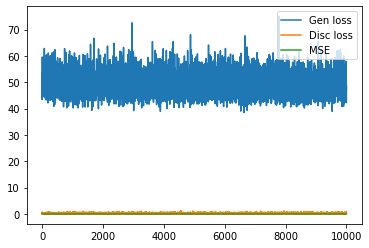

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


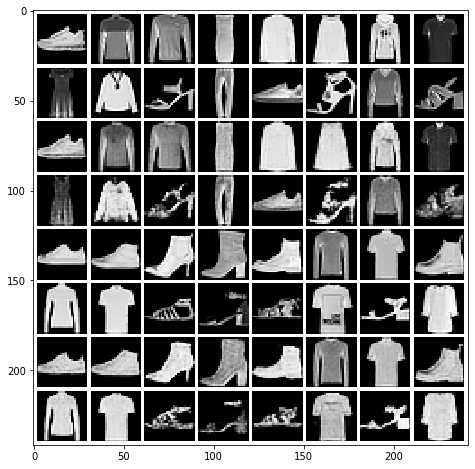

Mean squared dist: 0.018320134
epoch: 49 	 step:0 	 loss: 56.19
epoch: 49 	 step:100 	 loss: 45.19
epoch: 49 	 step:200 	 loss: 40.81
epoch: 49 	 step:300 	 loss: 52.95
epoch: 49 	 step:400 	 loss: 48.86
epoch: 49 	 step:500 	 loss: 44.79
epoch: 49 	 step:600 	 loss: 46.6
epoch: 49 	 step:700 	 loss: 47.26
epoch: 49 	 step:800 	 loss: 47.5
epoch: 49 	 step:900 	 loss: 44.58
epoch: 49 	 step:1000 	 loss: 49.8
epoch: 49 	 step:1100 	 loss: 51.26
epoch: 49 	 step:1200 	 loss: 51.19
epoch: 49 	 step:1300 	 loss: 53.06
epoch: 49 	 step:1400 	 loss: 47.39
epoch: 49 	 step:1500 	 loss: 51.42
epoch: 49 	 step:1600 	 loss: 51.52
epoch: 49 	 step:1700 	 loss: 42.67
epoch: 49 	 step:1800 	 loss: 51.7


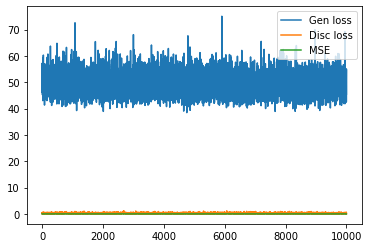

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


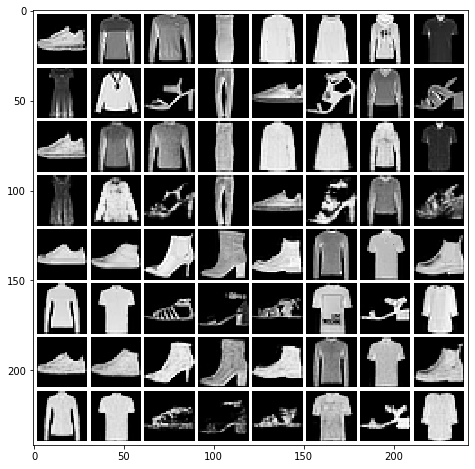

Mean squared dist: 0.017922955
epoch: 50 	 step:0 	 loss: 38.16
epoch: 50 	 step:100 	 loss: 46.04
epoch: 50 	 step:200 	 loss: 53.89
epoch: 50 	 step:300 	 loss: 42.4
epoch: 50 	 step:400 	 loss: 52.35
epoch: 50 	 step:500 	 loss: 46.37
epoch: 50 	 step:600 	 loss: 46.71
epoch: 50 	 step:700 	 loss: 49.54
epoch: 50 	 step:800 	 loss: 50.16
epoch: 50 	 step:900 	 loss: 49.66
epoch: 50 	 step:1000 	 loss: 52.33
epoch: 50 	 step:1100 	 loss: 52.44
epoch: 50 	 step:1200 	 loss: 54.04
epoch: 50 	 step:1300 	 loss: 52.17
epoch: 50 	 step:1400 	 loss: 42.88
epoch: 50 	 step:1500 	 loss: 53.77
epoch: 50 	 step:1600 	 loss: 50.45
epoch: 50 	 step:1700 	 loss: 41.88
epoch: 50 	 step:1800 	 loss: 45.76


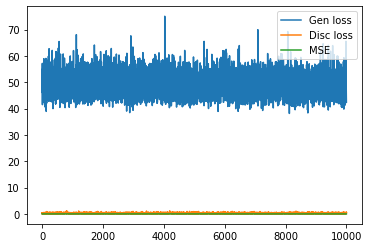

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


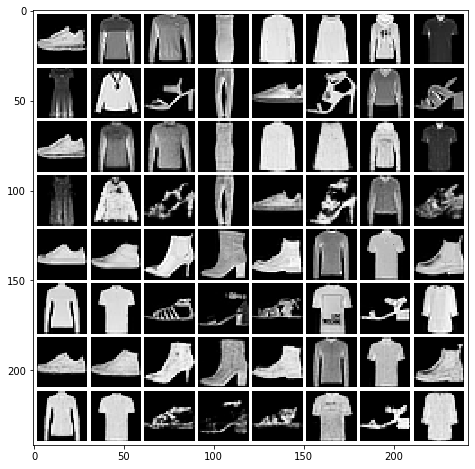

Mean squared dist: 0.018343989
epoch: 51 	 step:0 	 loss: 48.48
epoch: 51 	 step:100 	 loss: 45.31
epoch: 51 	 step:200 	 loss: 46.07
epoch: 51 	 step:300 	 loss: 46.99
epoch: 51 	 step:400 	 loss: 49.6
epoch: 51 	 step:500 	 loss: 49.14
epoch: 51 	 step:600 	 loss: 54.25
epoch: 51 	 step:700 	 loss: 51.77
epoch: 51 	 step:800 	 loss: 51.98
epoch: 51 	 step:900 	 loss: 55.03
epoch: 51 	 step:1000 	 loss: 51.47
epoch: 51 	 step:1100 	 loss: 46.03
epoch: 51 	 step:1200 	 loss: 46.03
epoch: 51 	 step:1300 	 loss: 50.58
epoch: 51 	 step:1400 	 loss: 50.03
epoch: 51 	 step:1500 	 loss: 45.98
epoch: 51 	 step:1600 	 loss: 47.71
epoch: 51 	 step:1700 	 loss: 51.74
epoch: 51 	 step:1800 	 loss: 47.86


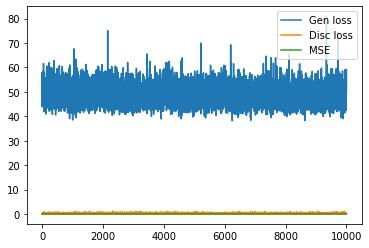

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


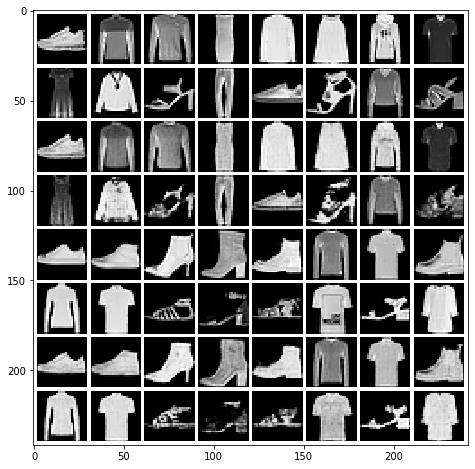

Mean squared dist: 0.017998971
epoch: 52 	 step:0 	 loss: 47.18
epoch: 52 	 step:100 	 loss: 43.87
epoch: 52 	 step:200 	 loss: 45.44
epoch: 52 	 step:300 	 loss: 51.61
epoch: 52 	 step:400 	 loss: 44.43
epoch: 52 	 step:500 	 loss: 41.68
epoch: 52 	 step:600 	 loss: 43.88
epoch: 52 	 step:700 	 loss: 46.52
epoch: 52 	 step:800 	 loss: 47.26
epoch: 52 	 step:900 	 loss: 50.13
epoch: 52 	 step:1000 	 loss: 51.59
epoch: 52 	 step:1100 	 loss: 51.82
epoch: 52 	 step:1200 	 loss: 54.7
epoch: 52 	 step:1300 	 loss: 49.26
epoch: 52 	 step:1400 	 loss: 46.84
epoch: 52 	 step:1500 	 loss: 53.99
epoch: 52 	 step:1600 	 loss: 48.71
epoch: 52 	 step:1700 	 loss: 49.96
epoch: 52 	 step:1800 	 loss: 47.64


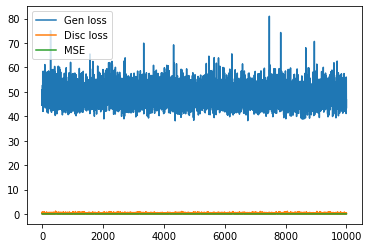

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


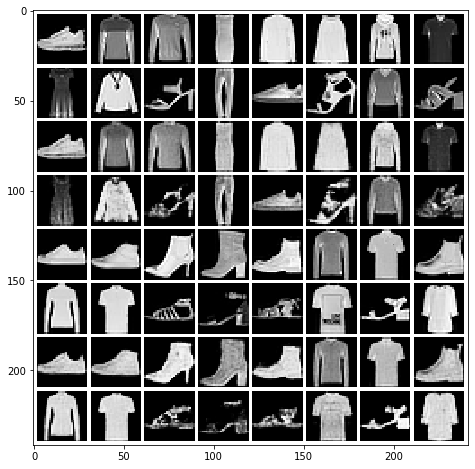

Mean squared dist: 0.018096726
epoch: 53 	 step:0 	 loss: 47.43
epoch: 53 	 step:100 	 loss: 45.1
epoch: 53 	 step:200 	 loss: 41.68
epoch: 53 	 step:300 	 loss: 41.97
epoch: 53 	 step:400 	 loss: 47.92
epoch: 53 	 step:500 	 loss: 46.94
epoch: 53 	 step:600 	 loss: 45.6
epoch: 53 	 step:700 	 loss: 51.63
epoch: 53 	 step:800 	 loss: 49.73
epoch: 53 	 step:900 	 loss: 52.05
epoch: 53 	 step:1000 	 loss: 44.94
epoch: 53 	 step:1100 	 loss: 54.68
epoch: 53 	 step:1200 	 loss: 45.89
epoch: 53 	 step:1300 	 loss: 44.42
epoch: 53 	 step:1400 	 loss: 47.81
epoch: 53 	 step:1500 	 loss: 43.26
epoch: 53 	 step:1600 	 loss: 49.34
epoch: 53 	 step:1700 	 loss: 44.24
epoch: 53 	 step:1800 	 loss: 51.54


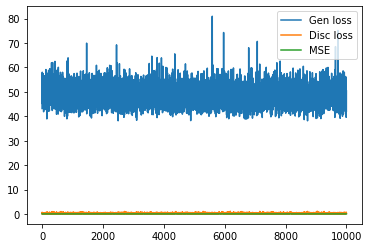

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


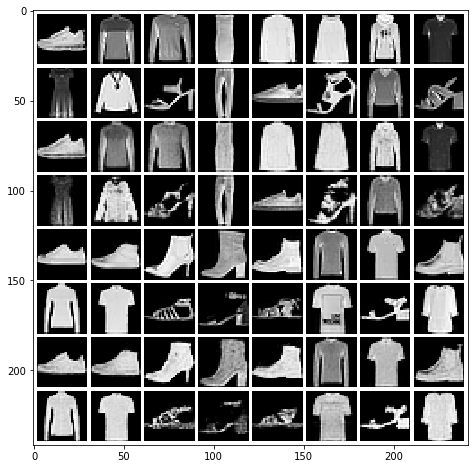

Mean squared dist: 0.018057166
epoch: 54 	 step:0 	 loss: 50.39
epoch: 54 	 step:100 	 loss: 48.72
epoch: 54 	 step:200 	 loss: 46.52
epoch: 54 	 step:300 	 loss: 51.73
epoch: 54 	 step:400 	 loss: 52.65
epoch: 54 	 step:500 	 loss: 48.18
epoch: 54 	 step:600 	 loss: 54.03
epoch: 54 	 step:700 	 loss: 49.55
epoch: 54 	 step:800 	 loss: 45.0
epoch: 54 	 step:900 	 loss: 45.16
epoch: 54 	 step:1000 	 loss: 47.32
epoch: 54 	 step:1100 	 loss: 44.25
epoch: 54 	 step:1200 	 loss: 48.84
epoch: 54 	 step:1300 	 loss: 49.35
epoch: 54 	 step:1400 	 loss: 52.79
epoch: 54 	 step:1500 	 loss: 42.68
epoch: 54 	 step:1600 	 loss: 45.18
epoch: 54 	 step:1700 	 loss: 44.98
epoch: 54 	 step:1800 	 loss: 44.91


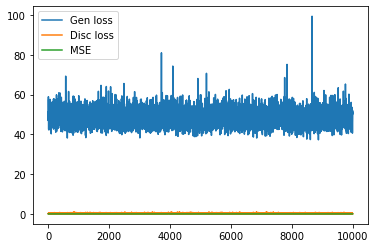

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


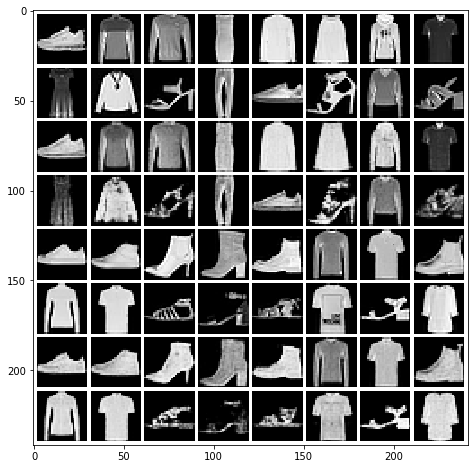

Mean squared dist: 0.018048322
epoch: 55 	 step:0 	 loss: 42.6
epoch: 55 	 step:100 	 loss: 40.89
epoch: 55 	 step:200 	 loss: 47.0
epoch: 55 	 step:300 	 loss: 47.08
epoch: 55 	 step:400 	 loss: 41.85
epoch: 55 	 step:500 	 loss: 53.92
epoch: 55 	 step:600 	 loss: 52.58
epoch: 55 	 step:700 	 loss: 44.65
epoch: 55 	 step:800 	 loss: 53.12
epoch: 55 	 step:900 	 loss: 44.0
epoch: 55 	 step:1000 	 loss: 45.9
epoch: 55 	 step:1100 	 loss: 50.77
epoch: 55 	 step:1200 	 loss: 49.8
epoch: 55 	 step:1300 	 loss: 47.66
epoch: 55 	 step:1400 	 loss: 45.54
epoch: 55 	 step:1500 	 loss: 50.65
epoch: 55 	 step:1600 	 loss: 47.82
epoch: 55 	 step:1700 	 loss: 45.89
epoch: 55 	 step:1800 	 loss: 46.42


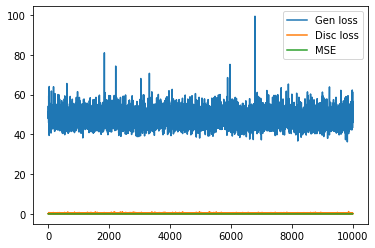

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


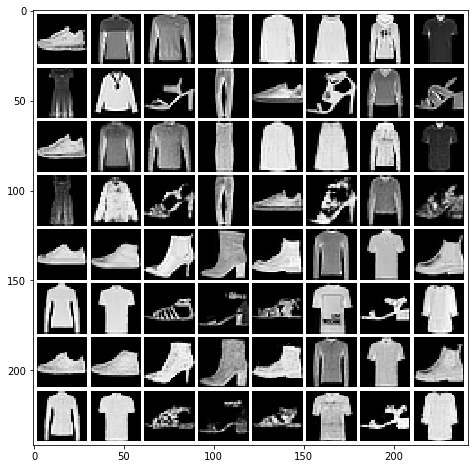

Mean squared dist: 0.018348146
epoch: 56 	 step:0 	 loss: 40.45
epoch: 56 	 step:100 	 loss: 44.58
epoch: 56 	 step:200 	 loss: 48.42
epoch: 56 	 step:300 	 loss: 44.39
epoch: 56 	 step:400 	 loss: 46.69
epoch: 56 	 step:500 	 loss: 46.74
epoch: 56 	 step:600 	 loss: 48.46
epoch: 56 	 step:700 	 loss: 43.03
epoch: 56 	 step:800 	 loss: 52.69
epoch: 56 	 step:900 	 loss: 45.06
epoch: 56 	 step:1000 	 loss: 43.9
epoch: 56 	 step:1100 	 loss: 42.31
epoch: 56 	 step:1200 	 loss: 46.01
epoch: 56 	 step:1300 	 loss: 50.05
epoch: 56 	 step:1400 	 loss: 50.61
epoch: 56 	 step:1500 	 loss: 46.23
epoch: 56 	 step:1600 	 loss: 46.99
epoch: 56 	 step:1700 	 loss: 50.3
epoch: 56 	 step:1800 	 loss: 49.08


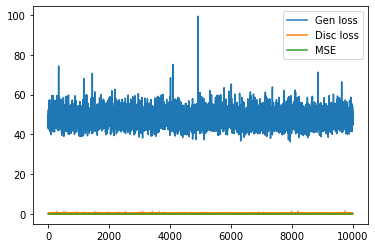

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


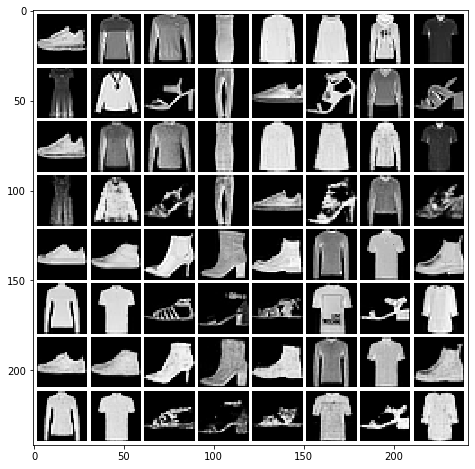

Mean squared dist: 0.018323261
epoch: 57 	 step:0 	 loss: 50.0
epoch: 57 	 step:100 	 loss: 46.73
epoch: 57 	 step:200 	 loss: 44.24
epoch: 57 	 step:300 	 loss: 49.47
epoch: 57 	 step:400 	 loss: 46.12
epoch: 57 	 step:500 	 loss: 53.09
epoch: 57 	 step:600 	 loss: 43.35
epoch: 57 	 step:700 	 loss: 50.64
epoch: 57 	 step:800 	 loss: 45.1
epoch: 57 	 step:900 	 loss: 49.99
epoch: 57 	 step:1000 	 loss: 45.97
epoch: 57 	 step:1100 	 loss: 44.53
epoch: 57 	 step:1200 	 loss: 47.09
epoch: 57 	 step:1300 	 loss: 47.33
epoch: 57 	 step:1400 	 loss: 45.3
epoch: 57 	 step:1500 	 loss: 43.93
epoch: 57 	 step:1600 	 loss: 44.66
epoch: 57 	 step:1700 	 loss: 47.13
epoch: 57 	 step:1800 	 loss: 49.51


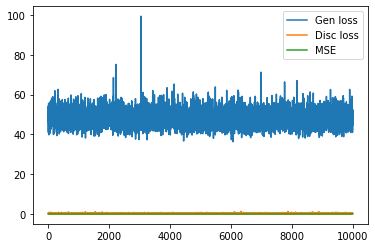

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


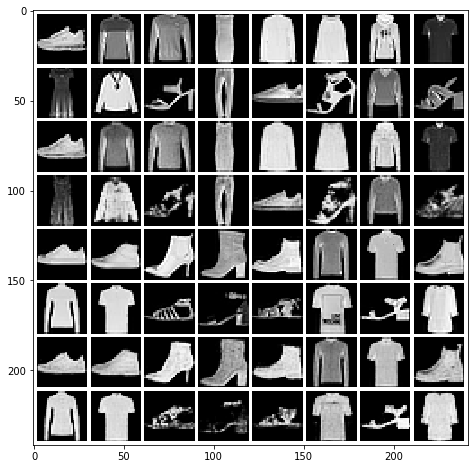

Mean squared dist: 0.018041806
epoch: 58 	 step:0 	 loss: 46.99
epoch: 58 	 step:100 	 loss: 42.91
epoch: 58 	 step:200 	 loss: 46.25
epoch: 58 	 step:300 	 loss: 43.05
epoch: 58 	 step:400 	 loss: 45.29
epoch: 58 	 step:500 	 loss: 46.47
epoch: 58 	 step:600 	 loss: 48.81
epoch: 58 	 step:700 	 loss: 41.41
epoch: 58 	 step:800 	 loss: 42.08
epoch: 58 	 step:900 	 loss: 47.84
epoch: 58 	 step:1000 	 loss: 47.54
epoch: 58 	 step:1100 	 loss: 47.53
epoch: 58 	 step:1200 	 loss: 46.12
epoch: 58 	 step:1300 	 loss: 52.36
epoch: 58 	 step:1400 	 loss: 49.25
epoch: 58 	 step:1500 	 loss: 46.83
epoch: 58 	 step:1600 	 loss: 40.73
epoch: 58 	 step:1700 	 loss: 47.33
epoch: 58 	 step:1800 	 loss: 52.21


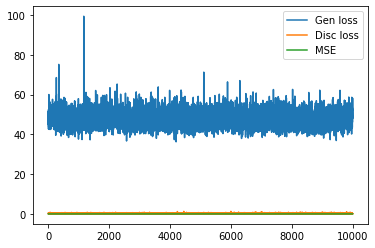

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


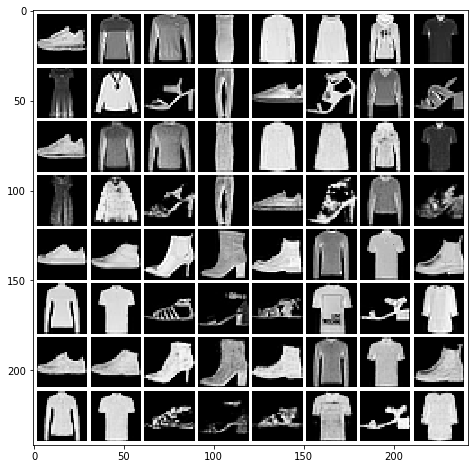

Mean squared dist: 0.018237501
epoch: 59 	 step:0 	 loss: 50.8
epoch: 59 	 step:100 	 loss: 42.28
epoch: 59 	 step:200 	 loss: 46.18
epoch: 59 	 step:300 	 loss: 45.08
epoch: 59 	 step:400 	 loss: 41.96
epoch: 59 	 step:500 	 loss: 51.95
epoch: 59 	 step:600 	 loss: 50.7
epoch: 59 	 step:700 	 loss: 49.29
epoch: 59 	 step:800 	 loss: 35.95
epoch: 59 	 step:900 	 loss: 47.33
epoch: 59 	 step:1000 	 loss: 49.55
epoch: 59 	 step:1100 	 loss: 50.05
epoch: 59 	 step:1200 	 loss: 46.08
epoch: 59 	 step:1300 	 loss: 49.79
epoch: 59 	 step:1400 	 loss: 49.77
epoch: 59 	 step:1500 	 loss: 45.58
epoch: 59 	 step:1600 	 loss: 49.7
epoch: 59 	 step:1700 	 loss: 45.22
epoch: 59 	 step:1800 	 loss: 43.4


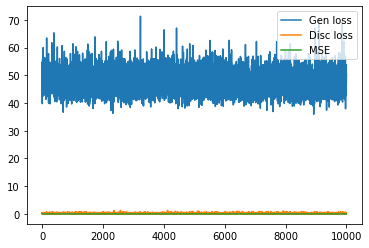

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


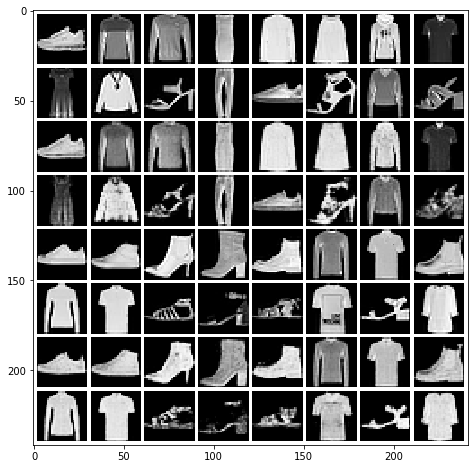

Mean squared dist: 0.018203352
epoch: 60 	 step:0 	 loss: 44.09
epoch: 60 	 step:100 	 loss: 44.47
epoch: 60 	 step:200 	 loss: 49.97
epoch: 60 	 step:300 	 loss: 44.25
epoch: 60 	 step:400 	 loss: 40.76
epoch: 60 	 step:500 	 loss: 48.55
epoch: 60 	 step:600 	 loss: 50.47
epoch: 60 	 step:700 	 loss: 44.95
epoch: 60 	 step:800 	 loss: 47.8
epoch: 60 	 step:900 	 loss: 46.2
epoch: 60 	 step:1000 	 loss: 47.27
epoch: 60 	 step:1100 	 loss: 47.66
epoch: 60 	 step:1200 	 loss: 43.33
epoch: 60 	 step:1300 	 loss: 51.08
epoch: 60 	 step:1400 	 loss: 38.99
epoch: 60 	 step:1500 	 loss: 45.93
epoch: 60 	 step:1600 	 loss: 52.55
epoch: 60 	 step:1700 	 loss: 49.19
epoch: 60 	 step:1800 	 loss: 47.83


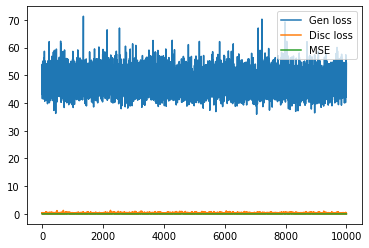

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


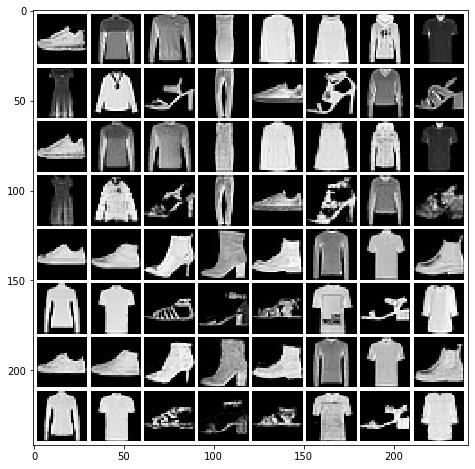

Mean squared dist: 0.017897468
epoch: 61 	 step:0 	 loss: 40.49
epoch: 61 	 step:100 	 loss: 45.02
epoch: 61 	 step:200 	 loss: 44.64
epoch: 61 	 step:300 	 loss: 42.38
epoch: 61 	 step:400 	 loss: 50.33
epoch: 61 	 step:500 	 loss: 45.0
epoch: 61 	 step:600 	 loss: 52.19
epoch: 61 	 step:700 	 loss: 45.56
epoch: 61 	 step:800 	 loss: 48.83
epoch: 61 	 step:900 	 loss: 46.39
epoch: 61 	 step:1000 	 loss: 48.5
epoch: 61 	 step:1100 	 loss: 51.95
epoch: 61 	 step:1200 	 loss: 50.15
epoch: 61 	 step:1300 	 loss: 43.04
epoch: 61 	 step:1400 	 loss: 42.75
epoch: 61 	 step:1500 	 loss: 42.77
epoch: 61 	 step:1600 	 loss: 44.93
epoch: 61 	 step:1700 	 loss: 42.24
epoch: 61 	 step:1800 	 loss: 51.75


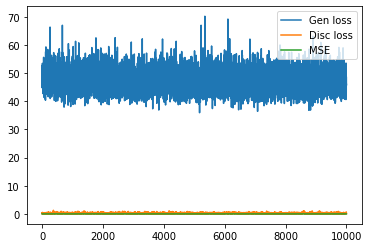

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


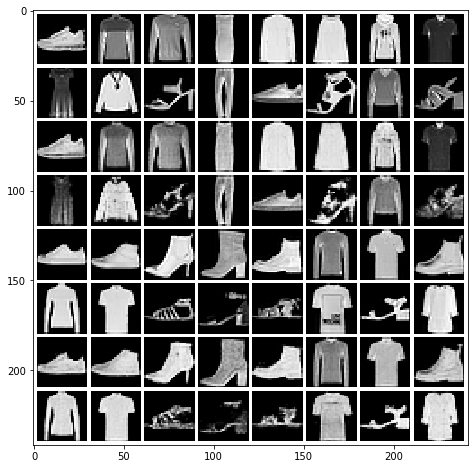

Mean squared dist: 0.01827447
epoch: 62 	 step:0 	 loss: 46.25
epoch: 62 	 step:100 	 loss: 51.06
epoch: 62 	 step:200 	 loss: 49.84
epoch: 62 	 step:300 	 loss: 48.26
epoch: 62 	 step:400 	 loss: 44.84
epoch: 62 	 step:500 	 loss: 43.41
epoch: 62 	 step:600 	 loss: 49.95
epoch: 62 	 step:700 	 loss: 49.88
epoch: 62 	 step:800 	 loss: 48.87
epoch: 62 	 step:900 	 loss: 47.66
epoch: 62 	 step:1000 	 loss: 46.83
epoch: 62 	 step:1100 	 loss: 48.37
epoch: 62 	 step:1200 	 loss: 47.1
epoch: 62 	 step:1300 	 loss: 46.82
epoch: 62 	 step:1400 	 loss: 45.44
epoch: 62 	 step:1500 	 loss: 43.81
epoch: 62 	 step:1600 	 loss: 41.24
epoch: 62 	 step:1700 	 loss: 42.77
epoch: 62 	 step:1800 	 loss: 47.05


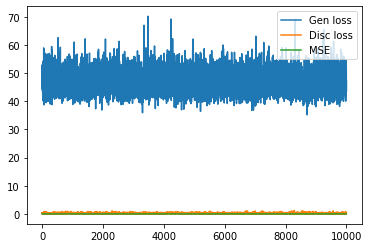

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


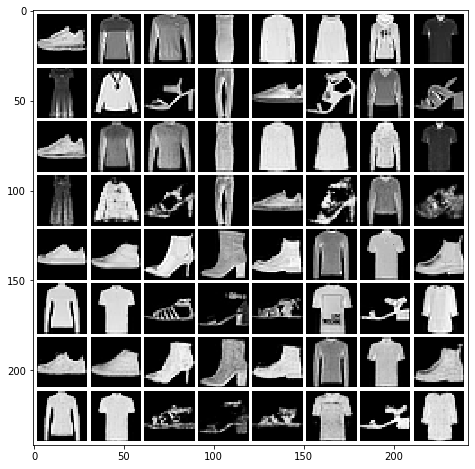

Mean squared dist: 0.018064851
epoch: 63 	 step:0 	 loss: 46.5
epoch: 63 	 step:100 	 loss: 49.77
epoch: 63 	 step:200 	 loss: 49.29
epoch: 63 	 step:300 	 loss: 46.93
epoch: 63 	 step:400 	 loss: 43.51
epoch: 63 	 step:500 	 loss: 47.97
epoch: 63 	 step:600 	 loss: 51.21
epoch: 63 	 step:700 	 loss: 46.47
epoch: 63 	 step:800 	 loss: 43.11
epoch: 63 	 step:900 	 loss: 46.13
epoch: 63 	 step:1000 	 loss: 43.12
epoch: 63 	 step:1100 	 loss: 45.28
epoch: 63 	 step:1200 	 loss: 43.86
epoch: 63 	 step:1300 	 loss: 48.51
epoch: 63 	 step:1400 	 loss: 47.36
epoch: 63 	 step:1500 	 loss: 49.04
epoch: 63 	 step:1600 	 loss: 44.24
epoch: 63 	 step:1700 	 loss: 49.99
epoch: 63 	 step:1800 	 loss: 51.17


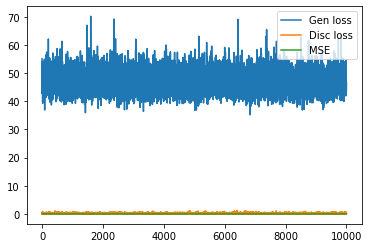

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


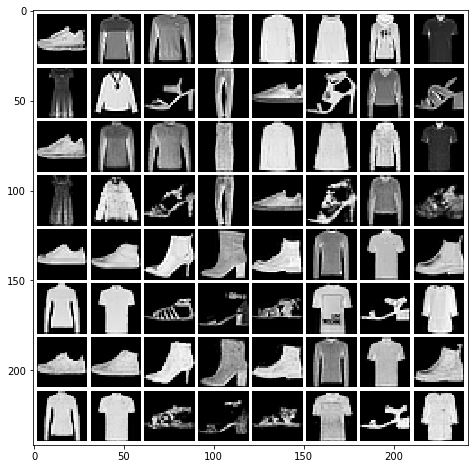

Mean squared dist: 0.017879792
epoch: 64 	 step:0 	 loss: 49.53
epoch: 64 	 step:100 	 loss: 51.09
epoch: 64 	 step:200 	 loss: 43.83
epoch: 64 	 step:300 	 loss: 44.04
epoch: 64 	 step:400 	 loss: 43.44
epoch: 64 	 step:500 	 loss: 45.11
epoch: 64 	 step:600 	 loss: 45.43
epoch: 64 	 step:700 	 loss: 44.8
epoch: 64 	 step:800 	 loss: 45.04
epoch: 64 	 step:900 	 loss: 43.61
epoch: 64 	 step:1000 	 loss: 42.33
epoch: 64 	 step:1100 	 loss: 49.5
epoch: 64 	 step:1200 	 loss: 50.62
epoch: 64 	 step:1300 	 loss: 50.25
epoch: 64 	 step:1400 	 loss: 47.69
epoch: 64 	 step:1500 	 loss: 50.09
epoch: 64 	 step:1600 	 loss: 48.34
epoch: 64 	 step:1700 	 loss: 46.07
epoch: 64 	 step:1800 	 loss: 45.47


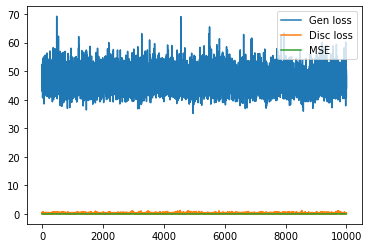

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


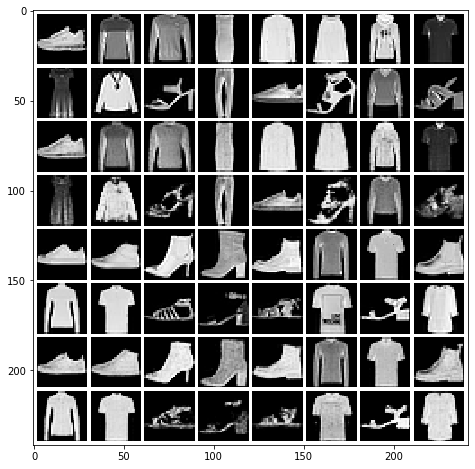

Mean squared dist: 0.01816668
epoch: 65 	 step:0 	 loss: 44.96
epoch: 65 	 step:100 	 loss: 50.73
epoch: 65 	 step:200 	 loss: 42.56
epoch: 65 	 step:300 	 loss: 45.94
epoch: 65 	 step:400 	 loss: 41.16
epoch: 65 	 step:500 	 loss: 45.08
epoch: 65 	 step:600 	 loss: 48.05
epoch: 65 	 step:700 	 loss: 48.84
epoch: 65 	 step:800 	 loss: 45.38
epoch: 65 	 step:900 	 loss: 44.84
epoch: 65 	 step:1000 	 loss: 47.96
epoch: 65 	 step:1100 	 loss: 50.67
epoch: 65 	 step:1200 	 loss: 49.96
epoch: 65 	 step:1300 	 loss: 46.43
epoch: 65 	 step:1400 	 loss: 50.78
epoch: 65 	 step:1500 	 loss: 48.45
epoch: 65 	 step:1600 	 loss: 40.54
epoch: 65 	 step:1700 	 loss: 43.12
epoch: 65 	 step:1800 	 loss: 42.42


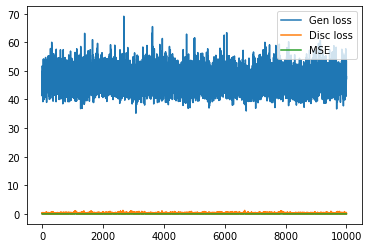

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


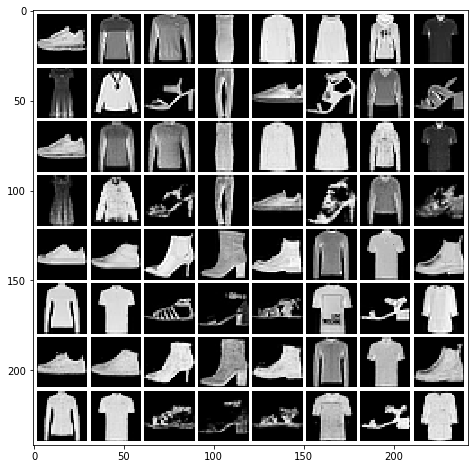

Mean squared dist: 0.018098975
epoch: 66 	 step:0 	 loss: 38.17
epoch: 66 	 step:100 	 loss: 49.62
epoch: 66 	 step:200 	 loss: 40.97
epoch: 66 	 step:300 	 loss: 43.7
epoch: 66 	 step:400 	 loss: 45.81
epoch: 66 	 step:500 	 loss: 52.54
epoch: 66 	 step:600 	 loss: 54.35
epoch: 66 	 step:700 	 loss: 42.88
epoch: 66 	 step:800 	 loss: 51.16
epoch: 66 	 step:900 	 loss: 41.86
epoch: 66 	 step:1000 	 loss: 44.19
epoch: 66 	 step:1100 	 loss: 47.12
epoch: 66 	 step:1200 	 loss: 50.04
epoch: 66 	 step:1300 	 loss: 42.77
epoch: 66 	 step:1400 	 loss: 47.86
epoch: 66 	 step:1500 	 loss: 47.11
epoch: 66 	 step:1600 	 loss: 45.28
epoch: 66 	 step:1700 	 loss: 42.82
epoch: 66 	 step:1800 	 loss: 47.54


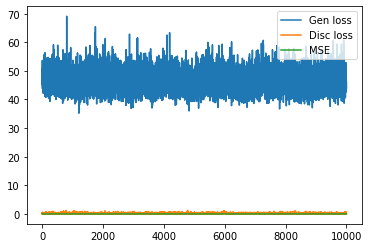

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


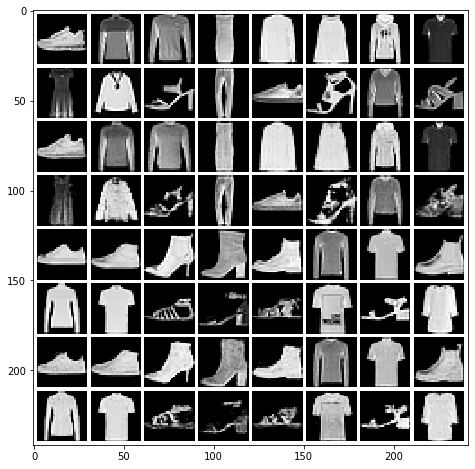

Mean squared dist: 0.01811341
epoch: 67 	 step:0 	 loss: 41.9
epoch: 67 	 step:100 	 loss: 49.07
epoch: 67 	 step:200 	 loss: 48.1
epoch: 67 	 step:300 	 loss: 46.29
epoch: 67 	 step:400 	 loss: 43.33
epoch: 67 	 step:500 	 loss: 50.71
epoch: 67 	 step:600 	 loss: 42.92
epoch: 67 	 step:700 	 loss: 43.82
epoch: 67 	 step:800 	 loss: 47.07
epoch: 67 	 step:900 	 loss: 51.06
epoch: 67 	 step:1000 	 loss: 44.82
epoch: 67 	 step:1100 	 loss: 48.61
epoch: 67 	 step:1200 	 loss: 52.05
epoch: 67 	 step:1300 	 loss: 51.42
epoch: 67 	 step:1400 	 loss: 48.53
epoch: 67 	 step:1500 	 loss: 41.92
epoch: 67 	 step:1600 	 loss: 42.55
epoch: 67 	 step:1700 	 loss: 54.99
epoch: 67 	 step:1800 	 loss: 48.09


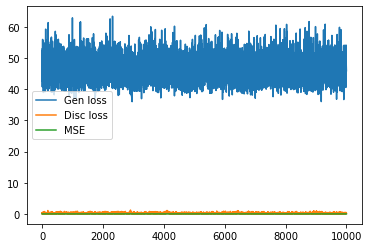

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


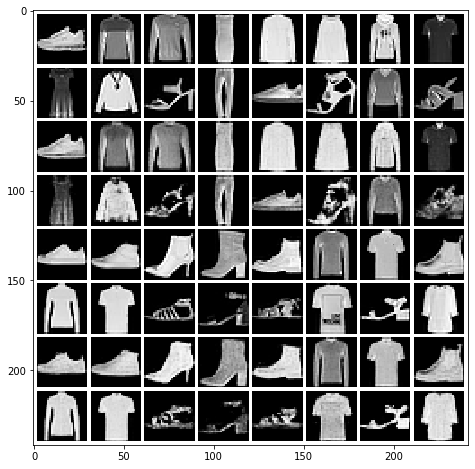

Mean squared dist: 0.018245032
epoch: 68 	 step:0 	 loss: 42.81
epoch: 68 	 step:100 	 loss: 47.23
epoch: 68 	 step:200 	 loss: 45.93
epoch: 68 	 step:300 	 loss: 46.8
epoch: 68 	 step:400 	 loss: 43.64
epoch: 68 	 step:500 	 loss: 48.87
epoch: 68 	 step:600 	 loss: 44.69
epoch: 68 	 step:700 	 loss: 42.56
epoch: 68 	 step:800 	 loss: 39.08
epoch: 68 	 step:900 	 loss: 41.68
epoch: 68 	 step:1000 	 loss: 47.61
epoch: 68 	 step:1100 	 loss: 49.29
epoch: 68 	 step:1200 	 loss: 44.52
epoch: 68 	 step:1300 	 loss: 47.31
epoch: 68 	 step:1400 	 loss: 52.02
epoch: 68 	 step:1500 	 loss: 40.56
epoch: 68 	 step:1600 	 loss: 39.33
epoch: 68 	 step:1700 	 loss: 44.71
epoch: 68 	 step:1800 	 loss: 55.87


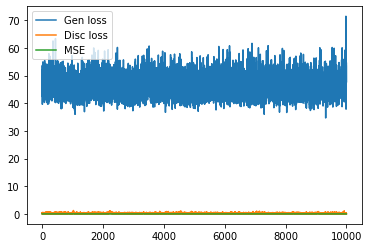

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


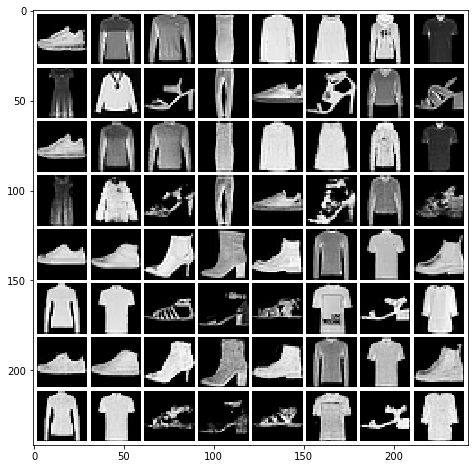

Mean squared dist: 0.01822809
epoch: 69 	 step:0 	 loss: 52.21
epoch: 69 	 step:100 	 loss: 44.06
epoch: 69 	 step:200 	 loss: 44.48
epoch: 69 	 step:300 	 loss: 45.69
epoch: 69 	 step:400 	 loss: 47.42
epoch: 69 	 step:500 	 loss: 42.84
epoch: 69 	 step:600 	 loss: 47.3
epoch: 69 	 step:700 	 loss: 51.19
epoch: 69 	 step:800 	 loss: 52.09
epoch: 69 	 step:900 	 loss: 44.34
epoch: 69 	 step:1000 	 loss: 52.33
epoch: 69 	 step:1100 	 loss: 51.54
epoch: 69 	 step:1200 	 loss: 44.02
epoch: 69 	 step:1300 	 loss: 45.09
epoch: 69 	 step:1400 	 loss: 46.93
epoch: 69 	 step:1500 	 loss: 39.85
epoch: 69 	 step:1600 	 loss: 47.12
epoch: 69 	 step:1700 	 loss: 48.83
epoch: 69 	 step:1800 	 loss: 45.58


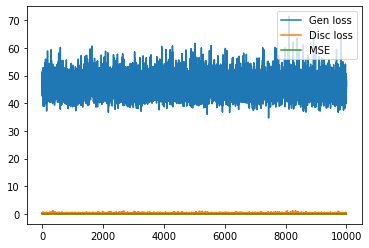

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


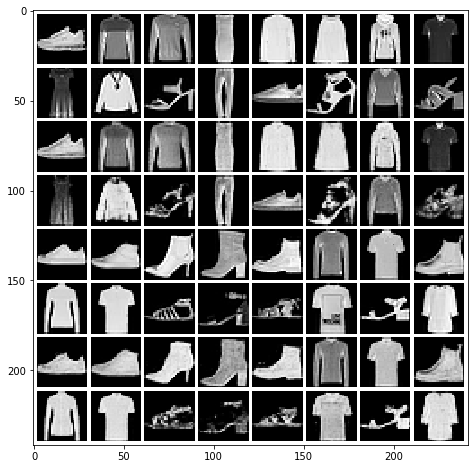

Mean squared dist: 0.018134374
epoch: 70 	 step:0 	 loss: 42.06
epoch: 70 	 step:100 	 loss: 46.33
epoch: 70 	 step:200 	 loss: 47.27
epoch: 70 	 step:300 	 loss: 47.67
epoch: 70 	 step:400 	 loss: 60.19
epoch: 70 	 step:500 	 loss: 42.8
epoch: 70 	 step:600 	 loss: 46.8
epoch: 70 	 step:700 	 loss: 41.49
epoch: 70 	 step:800 	 loss: 47.44
epoch: 70 	 step:900 	 loss: 43.32
epoch: 70 	 step:1000 	 loss: 44.03
epoch: 70 	 step:1100 	 loss: 49.57
epoch: 70 	 step:1200 	 loss: 52.1
epoch: 70 	 step:1300 	 loss: 47.31
epoch: 70 	 step:1400 	 loss: 37.62
epoch: 70 	 step:1500 	 loss: 39.26
epoch: 70 	 step:1600 	 loss: 57.53
epoch: 70 	 step:1700 	 loss: 43.23
epoch: 70 	 step:1800 	 loss: 48.51


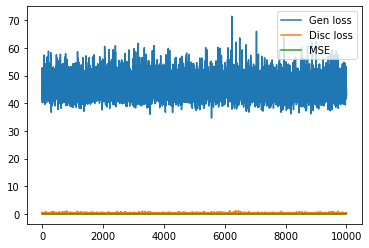

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


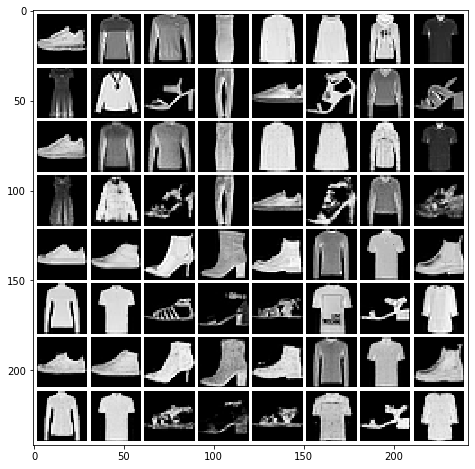

Mean squared dist: 0.018196514
epoch: 71 	 step:0 	 loss: 42.67
epoch: 71 	 step:100 	 loss: 48.71
epoch: 71 	 step:200 	 loss: 42.49
epoch: 71 	 step:300 	 loss: 46.16
epoch: 71 	 step:400 	 loss: 50.07
epoch: 71 	 step:500 	 loss: 46.76
epoch: 71 	 step:600 	 loss: 45.41
epoch: 71 	 step:700 	 loss: 44.07
epoch: 71 	 step:800 	 loss: 43.91
epoch: 71 	 step:900 	 loss: 42.7
epoch: 71 	 step:1000 	 loss: 47.1
epoch: 71 	 step:1100 	 loss: 44.13
epoch: 71 	 step:1200 	 loss: 51.87
epoch: 71 	 step:1300 	 loss: 52.22
epoch: 71 	 step:1400 	 loss: 43.74
epoch: 71 	 step:1500 	 loss: 43.4
epoch: 71 	 step:1600 	 loss: 43.03
epoch: 71 	 step:1700 	 loss: 42.33
epoch: 71 	 step:1800 	 loss: 44.75


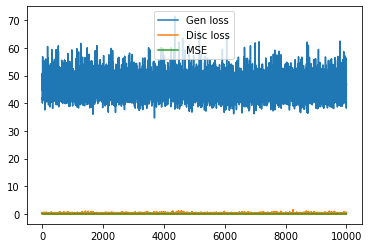

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


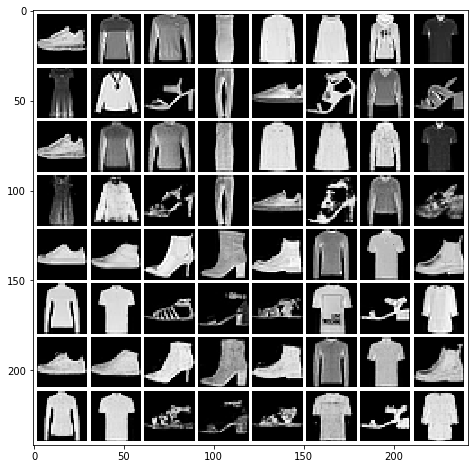

Mean squared dist: 0.018112527
epoch: 72 	 step:0 	 loss: 50.54
epoch: 72 	 step:100 	 loss: 46.0
epoch: 72 	 step:200 	 loss: 45.17
epoch: 72 	 step:300 	 loss: 43.0
epoch: 72 	 step:400 	 loss: 44.5
epoch: 72 	 step:500 	 loss: 40.97
epoch: 72 	 step:600 	 loss: 51.5
epoch: 72 	 step:700 	 loss: 47.27
epoch: 72 	 step:800 	 loss: 42.12
epoch: 72 	 step:900 	 loss: 50.18
epoch: 72 	 step:1000 	 loss: 47.1
epoch: 72 	 step:1100 	 loss: 48.53
epoch: 72 	 step:1200 	 loss: 47.74
epoch: 72 	 step:1300 	 loss: 46.57
epoch: 72 	 step:1400 	 loss: 43.73
epoch: 72 	 step:1500 	 loss: 45.98
epoch: 72 	 step:1600 	 loss: 48.91
epoch: 72 	 step:1700 	 loss: 45.42
epoch: 72 	 step:1800 	 loss: 45.74


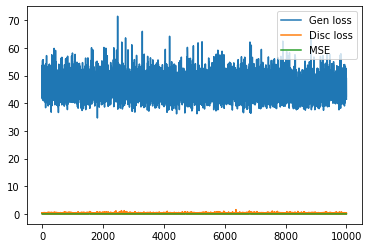

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


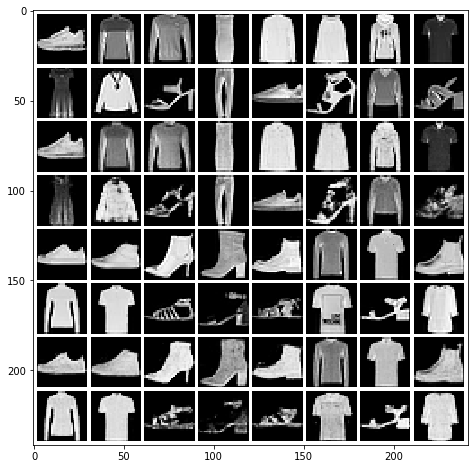

Mean squared dist: 0.018162286
epoch: 73 	 step:0 	 loss: 44.88
epoch: 73 	 step:100 	 loss: 41.51
epoch: 73 	 step:200 	 loss: 45.52
epoch: 73 	 step:300 	 loss: 46.09
epoch: 73 	 step:400 	 loss: 44.06
epoch: 73 	 step:500 	 loss: 43.66
epoch: 73 	 step:600 	 loss: 43.19
epoch: 73 	 step:700 	 loss: 38.08
epoch: 73 	 step:800 	 loss: 48.17
epoch: 73 	 step:900 	 loss: 45.27
epoch: 73 	 step:1000 	 loss: 42.78
epoch: 73 	 step:1100 	 loss: 45.57
epoch: 73 	 step:1200 	 loss: 48.23
epoch: 73 	 step:1300 	 loss: 45.98
epoch: 73 	 step:1400 	 loss: 45.29
epoch: 73 	 step:1500 	 loss: 44.25
epoch: 73 	 step:1600 	 loss: 42.8
epoch: 73 	 step:1700 	 loss: 45.49
epoch: 73 	 step:1800 	 loss: 42.61


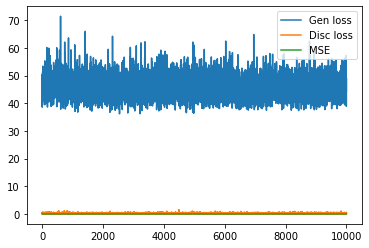

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


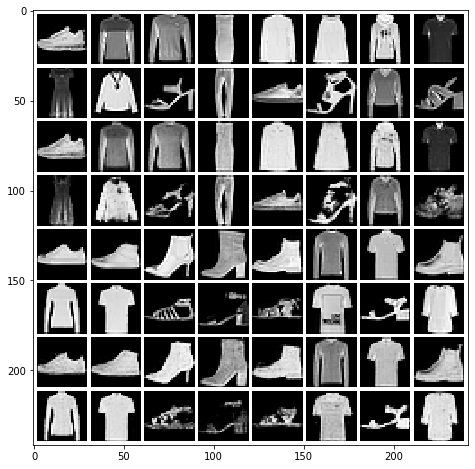

Mean squared dist: 0.018011961
epoch: 74 	 step:0 	 loss: 49.13
epoch: 74 	 step:100 	 loss: 47.32
epoch: 74 	 step:200 	 loss: 42.85
epoch: 74 	 step:300 	 loss: 43.4
epoch: 74 	 step:400 	 loss: 47.1
epoch: 74 	 step:500 	 loss: 41.44
epoch: 74 	 step:600 	 loss: 49.2
epoch: 74 	 step:700 	 loss: 43.89
epoch: 74 	 step:800 	 loss: 43.32
epoch: 74 	 step:900 	 loss: 44.32
epoch: 74 	 step:1000 	 loss: 42.85
epoch: 74 	 step:1100 	 loss: 46.48
epoch: 74 	 step:1200 	 loss: 46.9
epoch: 74 	 step:1300 	 loss: 44.7
epoch: 74 	 step:1400 	 loss: 47.5
epoch: 74 	 step:1500 	 loss: 41.78
epoch: 74 	 step:1600 	 loss: 43.63
epoch: 74 	 step:1700 	 loss: 42.97
epoch: 74 	 step:1800 	 loss: 47.31


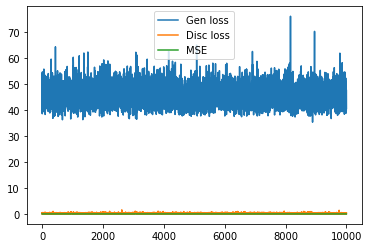

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


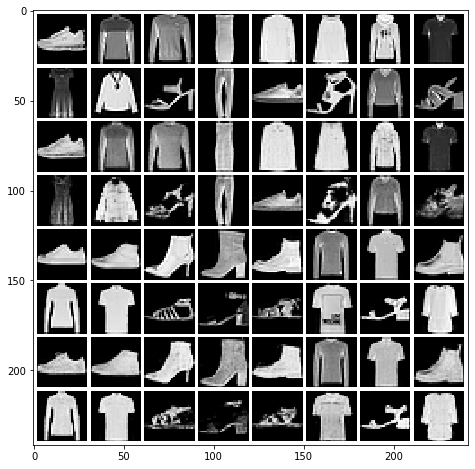

Mean squared dist: 0.018063592
epoch: 75 	 step:0 	 loss: 46.74
epoch: 75 	 step:100 	 loss: 40.95
epoch: 75 	 step:200 	 loss: 45.85
epoch: 75 	 step:300 	 loss: 51.59
epoch: 75 	 step:400 	 loss: 48.61
epoch: 75 	 step:500 	 loss: 54.97
epoch: 75 	 step:600 	 loss: 46.81
epoch: 75 	 step:700 	 loss: 43.46
epoch: 75 	 step:800 	 loss: 43.47
epoch: 75 	 step:900 	 loss: 43.87
epoch: 75 	 step:1000 	 loss: 51.28
epoch: 75 	 step:1100 	 loss: 43.7
epoch: 75 	 step:1200 	 loss: 40.51
epoch: 75 	 step:1300 	 loss: 46.7
epoch: 75 	 step:1400 	 loss: 43.2
epoch: 75 	 step:1500 	 loss: 49.72
epoch: 75 	 step:1600 	 loss: 45.03
epoch: 75 	 step:1700 	 loss: 40.17
epoch: 75 	 step:1800 	 loss: 49.01


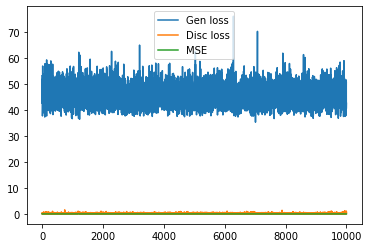

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


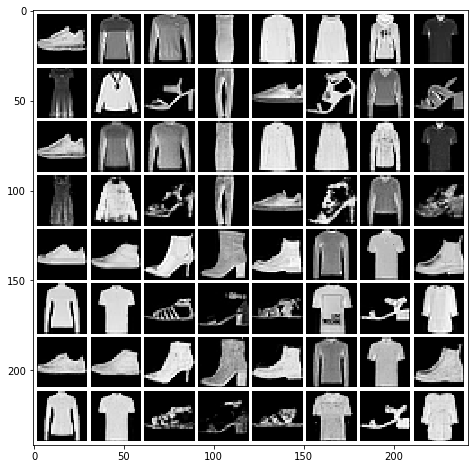

Mean squared dist: 0.018246612
epoch: 76 	 step:0 	 loss: 40.15
epoch: 76 	 step:100 	 loss: 41.5
epoch: 76 	 step:200 	 loss: 52.7
epoch: 76 	 step:300 	 loss: 51.2
epoch: 76 	 step:400 	 loss: 48.06
epoch: 76 	 step:500 	 loss: 47.07
epoch: 76 	 step:600 	 loss: 48.82
epoch: 76 	 step:700 	 loss: 44.87
epoch: 76 	 step:800 	 loss: 45.17
epoch: 76 	 step:900 	 loss: 45.97
epoch: 76 	 step:1000 	 loss: 40.66
epoch: 76 	 step:1100 	 loss: 44.01
epoch: 76 	 step:1200 	 loss: 49.48
epoch: 76 	 step:1300 	 loss: 43.26
epoch: 76 	 step:1400 	 loss: 44.19
epoch: 76 	 step:1500 	 loss: 42.63
epoch: 76 	 step:1600 	 loss: 46.56
epoch: 76 	 step:1700 	 loss: 45.89
epoch: 76 	 step:1800 	 loss: 51.3


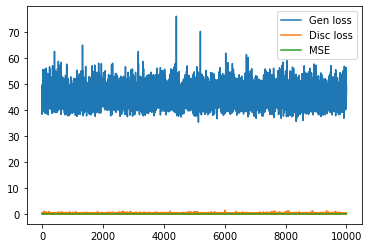

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


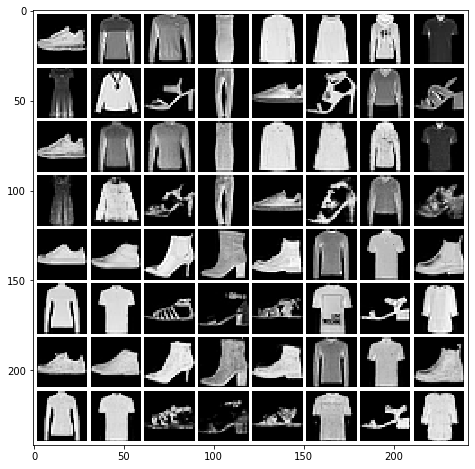

Mean squared dist: 0.017983144
epoch: 77 	 step:0 	 loss: 48.7
epoch: 77 	 step:100 	 loss: 46.54
epoch: 77 	 step:200 	 loss: 51.32
epoch: 77 	 step:300 	 loss: 40.38
epoch: 77 	 step:400 	 loss: 48.8
epoch: 77 	 step:500 	 loss: 43.3
epoch: 77 	 step:600 	 loss: 42.72
epoch: 77 	 step:700 	 loss: 46.01
epoch: 77 	 step:800 	 loss: 43.78
epoch: 77 	 step:900 	 loss: 40.49
epoch: 77 	 step:1000 	 loss: 44.87
epoch: 77 	 step:1100 	 loss: 42.36
epoch: 77 	 step:1200 	 loss: 42.77
epoch: 77 	 step:1300 	 loss: 48.78
epoch: 77 	 step:1400 	 loss: 38.15
epoch: 77 	 step:1500 	 loss: 42.88
epoch: 77 	 step:1600 	 loss: 44.51
epoch: 77 	 step:1700 	 loss: 41.9
epoch: 77 	 step:1800 	 loss: 43.51


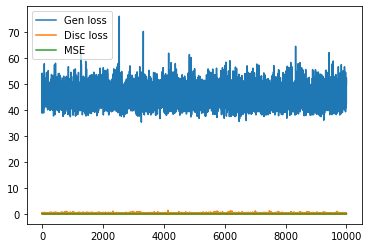

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


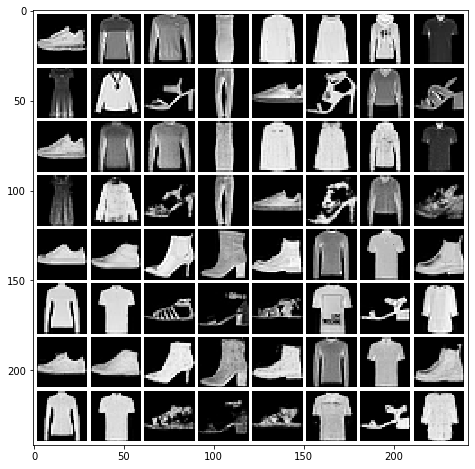

Mean squared dist: 0.01765978
epoch: 78 	 step:0 	 loss: 44.98
epoch: 78 	 step:100 	 loss: 44.26
epoch: 78 	 step:200 	 loss: 44.88
epoch: 78 	 step:300 	 loss: 45.17
epoch: 78 	 step:400 	 loss: 45.24
epoch: 78 	 step:500 	 loss: 42.95
epoch: 78 	 step:600 	 loss: 42.71
epoch: 78 	 step:700 	 loss: 46.56
epoch: 78 	 step:800 	 loss: 45.72
epoch: 78 	 step:900 	 loss: 48.25
epoch: 78 	 step:1000 	 loss: 45.05
epoch: 78 	 step:1100 	 loss: 47.57
epoch: 78 	 step:1200 	 loss: 37.42
epoch: 78 	 step:1300 	 loss: 46.77
epoch: 78 	 step:1400 	 loss: 47.04
epoch: 78 	 step:1500 	 loss: 41.93
epoch: 78 	 step:1600 	 loss: 48.09
epoch: 78 	 step:1700 	 loss: 43.22
epoch: 78 	 step:1800 	 loss: 38.49


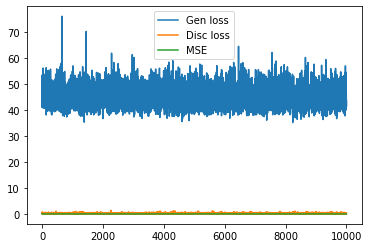

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


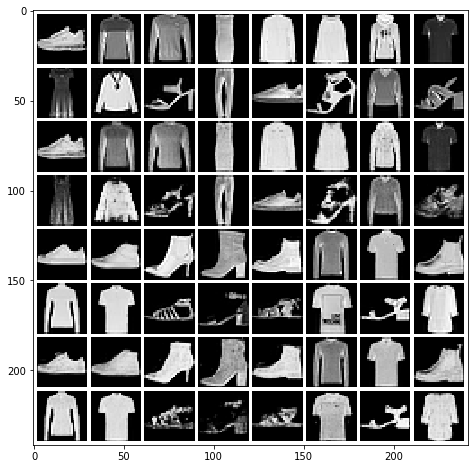

Mean squared dist: 0.018143829
epoch: 79 	 step:0 	 loss: 40.72
epoch: 79 	 step:100 	 loss: 44.65
epoch: 79 	 step:200 	 loss: 46.64
epoch: 79 	 step:300 	 loss: 51.54
epoch: 79 	 step:400 	 loss: 45.31
epoch: 79 	 step:500 	 loss: 46.04
epoch: 79 	 step:600 	 loss: 43.66
epoch: 79 	 step:700 	 loss: 49.81
epoch: 79 	 step:800 	 loss: 53.59
epoch: 79 	 step:900 	 loss: 49.08
epoch: 79 	 step:1000 	 loss: 40.28
epoch: 79 	 step:1100 	 loss: 46.61
epoch: 79 	 step:1200 	 loss: 45.47
epoch: 79 	 step:1300 	 loss: 50.22
epoch: 79 	 step:1400 	 loss: 45.65
epoch: 79 	 step:1500 	 loss: 49.91
epoch: 79 	 step:1600 	 loss: 48.05
epoch: 79 	 step:1700 	 loss: 42.49
epoch: 79 	 step:1800 	 loss: 47.21


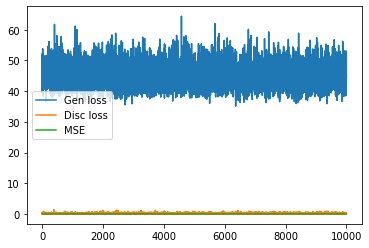

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


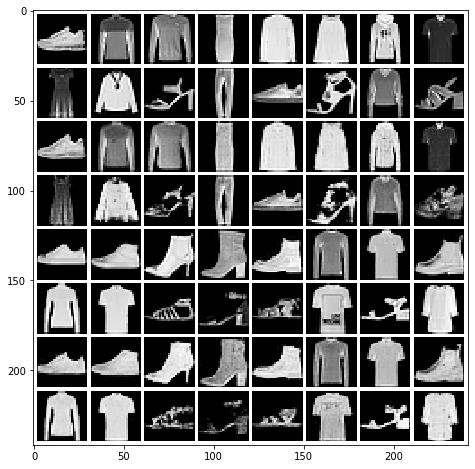

Mean squared dist: 0.018145135
epoch: 80 	 step:0 	 loss: 42.24
epoch: 80 	 step:100 	 loss: 49.04
epoch: 80 	 step:200 	 loss: 44.47
epoch: 80 	 step:300 	 loss: 45.01
epoch: 80 	 step:400 	 loss: 42.95
epoch: 80 	 step:500 	 loss: 44.09
epoch: 80 	 step:600 	 loss: 41.87
epoch: 80 	 step:700 	 loss: 47.25
epoch: 80 	 step:800 	 loss: 45.9
epoch: 80 	 step:900 	 loss: 49.46
epoch: 80 	 step:1000 	 loss: 41.71
epoch: 80 	 step:1100 	 loss: 42.31
epoch: 80 	 step:1200 	 loss: 45.64
epoch: 80 	 step:1300 	 loss: 49.14
epoch: 80 	 step:1400 	 loss: 46.32
epoch: 80 	 step:1500 	 loss: 45.0
epoch: 80 	 step:1600 	 loss: 42.39
epoch: 80 	 step:1700 	 loss: 46.8
epoch: 80 	 step:1800 	 loss: 44.47


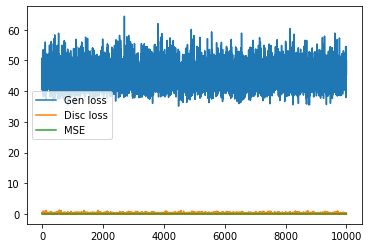

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


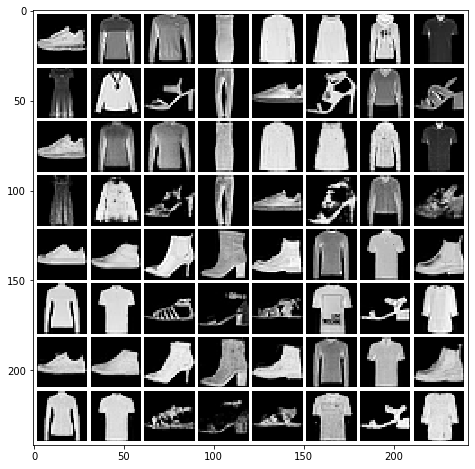

Mean squared dist: 0.017858218
epoch: 81 	 step:0 	 loss: 39.31
epoch: 81 	 step:100 	 loss: 43.0
epoch: 81 	 step:200 	 loss: 42.58
epoch: 81 	 step:300 	 loss: 44.87
epoch: 81 	 step:400 	 loss: 40.99
epoch: 81 	 step:500 	 loss: 39.51
epoch: 81 	 step:600 	 loss: 41.14
epoch: 81 	 step:700 	 loss: 48.86
epoch: 81 	 step:800 	 loss: 44.35
epoch: 81 	 step:900 	 loss: 40.81
epoch: 81 	 step:1000 	 loss: 46.82
epoch: 81 	 step:1100 	 loss: 45.55
epoch: 81 	 step:1200 	 loss: 45.83
epoch: 81 	 step:1300 	 loss: 43.1
epoch: 81 	 step:1400 	 loss: 56.12
epoch: 81 	 step:1500 	 loss: 39.65
epoch: 81 	 step:1600 	 loss: 43.61
epoch: 81 	 step:1700 	 loss: 49.23
epoch: 81 	 step:1800 	 loss: 38.35


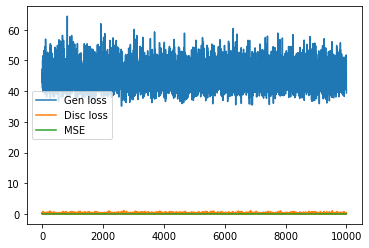

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


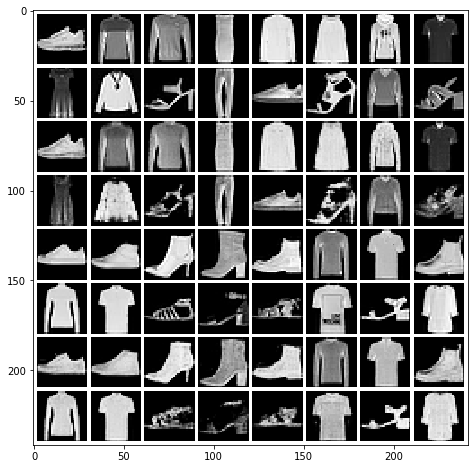

Mean squared dist: 0.017940976
epoch: 82 	 step:0 	 loss: 44.73
epoch: 82 	 step:100 	 loss: 44.81
epoch: 82 	 step:200 	 loss: 44.04
epoch: 82 	 step:300 	 loss: 42.76
epoch: 82 	 step:400 	 loss: 40.44
epoch: 82 	 step:500 	 loss: 39.49
epoch: 82 	 step:600 	 loss: 41.43
epoch: 82 	 step:700 	 loss: 43.28
epoch: 82 	 step:800 	 loss: 42.09
epoch: 82 	 step:900 	 loss: 42.79
epoch: 82 	 step:1000 	 loss: 51.02
epoch: 82 	 step:1100 	 loss: 42.51
epoch: 82 	 step:1200 	 loss: 42.5
epoch: 82 	 step:1300 	 loss: 52.43
epoch: 82 	 step:1400 	 loss: 48.05
epoch: 82 	 step:1500 	 loss: 44.05
epoch: 82 	 step:1600 	 loss: 41.96
epoch: 82 	 step:1700 	 loss: 49.45
epoch: 82 	 step:1800 	 loss: 46.83


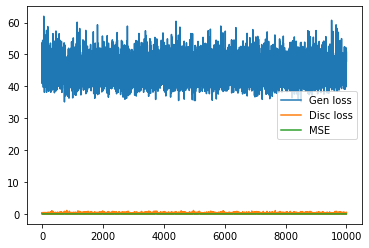

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


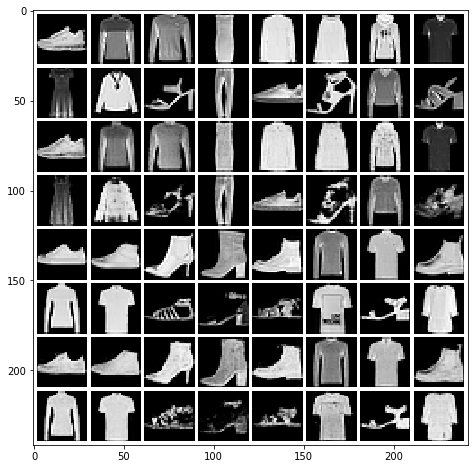

Mean squared dist: 0.018062044
epoch: 83 	 step:0 	 loss: 49.33
epoch: 83 	 step:100 	 loss: 45.02
epoch: 83 	 step:200 	 loss: 43.89
epoch: 83 	 step:300 	 loss: 45.8
epoch: 83 	 step:400 	 loss: 46.65
epoch: 83 	 step:500 	 loss: 44.43
epoch: 83 	 step:600 	 loss: 42.07
epoch: 83 	 step:700 	 loss: 42.6
epoch: 83 	 step:800 	 loss: 44.63
epoch: 83 	 step:900 	 loss: 43.02
epoch: 83 	 step:1000 	 loss: 45.73
epoch: 83 	 step:1100 	 loss: 43.11
epoch: 83 	 step:1200 	 loss: 43.93
epoch: 83 	 step:1300 	 loss: 45.31
epoch: 83 	 step:1400 	 loss: 37.88
epoch: 83 	 step:1500 	 loss: 47.0
epoch: 83 	 step:1600 	 loss: 43.94
epoch: 83 	 step:1700 	 loss: 43.78
epoch: 83 	 step:1800 	 loss: 49.14


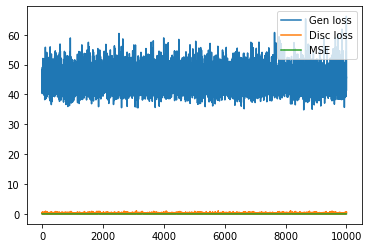

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


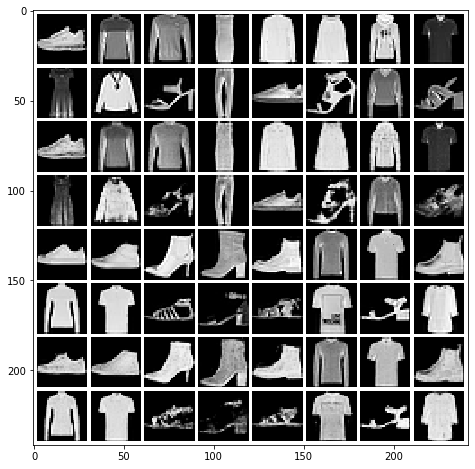

Mean squared dist: 0.018182453
epoch: 84 	 step:0 	 loss: 48.44
epoch: 84 	 step:100 	 loss: 44.15
epoch: 84 	 step:200 	 loss: 40.72
epoch: 84 	 step:300 	 loss: 40.23
epoch: 84 	 step:400 	 loss: 42.04
epoch: 84 	 step:500 	 loss: 42.43
epoch: 84 	 step:600 	 loss: 46.64
epoch: 84 	 step:700 	 loss: 44.08
epoch: 84 	 step:800 	 loss: 45.59
epoch: 84 	 step:900 	 loss: 40.92
epoch: 84 	 step:1000 	 loss: 44.29
epoch: 84 	 step:1100 	 loss: 45.12
epoch: 84 	 step:1200 	 loss: 42.39
epoch: 84 	 step:1300 	 loss: 45.14
epoch: 84 	 step:1400 	 loss: 47.9
epoch: 84 	 step:1500 	 loss: 53.66
epoch: 84 	 step:1600 	 loss: 39.91
epoch: 84 	 step:1700 	 loss: 48.16
epoch: 84 	 step:1800 	 loss: 42.06


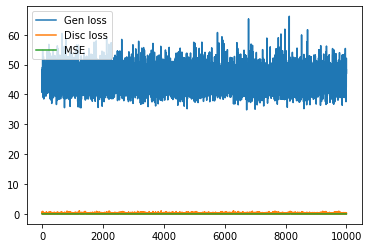

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


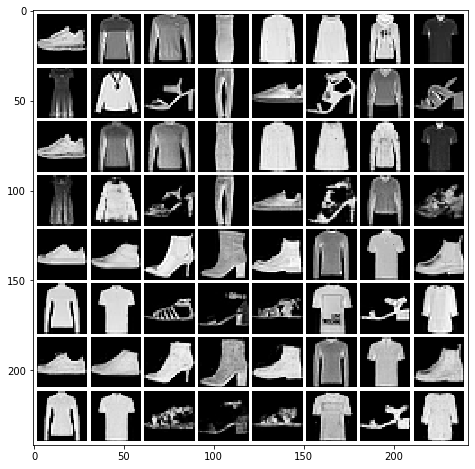

Mean squared dist: 0.017821914
epoch: 85 	 step:0 	 loss: 45.28
epoch: 85 	 step:100 	 loss: 43.45
epoch: 85 	 step:200 	 loss: 41.52
epoch: 85 	 step:300 	 loss: 43.18
epoch: 85 	 step:400 	 loss: 56.18
epoch: 85 	 step:500 	 loss: 42.64
epoch: 85 	 step:600 	 loss: 41.87
epoch: 85 	 step:700 	 loss: 40.85
epoch: 85 	 step:800 	 loss: 42.61
epoch: 85 	 step:900 	 loss: 48.23
epoch: 85 	 step:1000 	 loss: 44.93
epoch: 85 	 step:1100 	 loss: 44.9
epoch: 85 	 step:1200 	 loss: 43.48
epoch: 85 	 step:1300 	 loss: 43.33
epoch: 85 	 step:1400 	 loss: 43.88
epoch: 85 	 step:1500 	 loss: 43.56
epoch: 85 	 step:1600 	 loss: 48.72
epoch: 85 	 step:1700 	 loss: 43.59
epoch: 85 	 step:1800 	 loss: 43.95


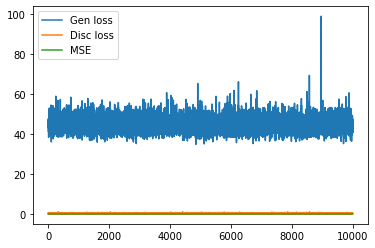

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


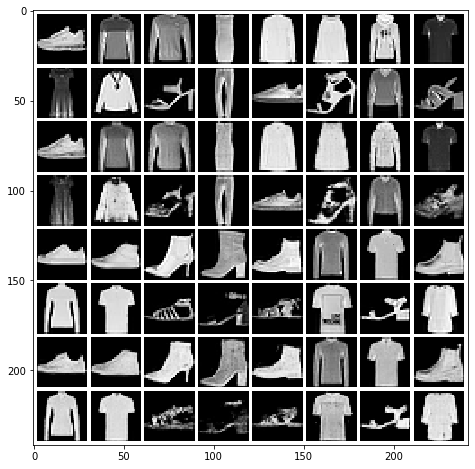

Mean squared dist: 0.01794821
epoch: 86 	 step:0 	 loss: 48.61
epoch: 86 	 step:100 	 loss: 42.45
epoch: 86 	 step:200 	 loss: 41.59
epoch: 86 	 step:300 	 loss: 44.12
epoch: 86 	 step:400 	 loss: 46.39
epoch: 86 	 step:500 	 loss: 44.2
epoch: 86 	 step:600 	 loss: 47.58
epoch: 86 	 step:700 	 loss: 47.8
epoch: 86 	 step:800 	 loss: 44.72
epoch: 86 	 step:900 	 loss: 45.05
epoch: 86 	 step:1000 	 loss: 46.41
epoch: 86 	 step:1100 	 loss: 53.63
epoch: 86 	 step:1200 	 loss: 46.61
epoch: 86 	 step:1300 	 loss: 45.08
epoch: 86 	 step:1400 	 loss: 38.97
epoch: 86 	 step:1500 	 loss: 43.67
epoch: 86 	 step:1600 	 loss: 46.82
epoch: 86 	 step:1700 	 loss: 45.19
epoch: 86 	 step:1800 	 loss: 44.42


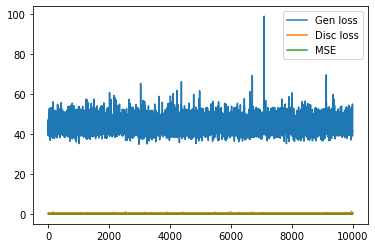

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


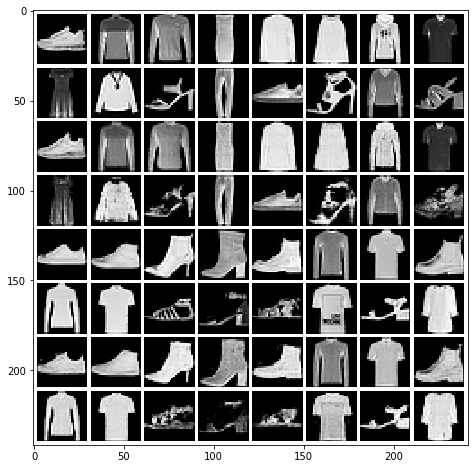

Mean squared dist: 0.018154632
epoch: 87 	 step:0 	 loss: 42.62
epoch: 87 	 step:100 	 loss: 49.04
epoch: 87 	 step:200 	 loss: 41.82
epoch: 87 	 step:300 	 loss: 40.25
epoch: 87 	 step:400 	 loss: 51.29
epoch: 87 	 step:500 	 loss: 46.86
epoch: 87 	 step:600 	 loss: 42.32
epoch: 87 	 step:700 	 loss: 40.61
epoch: 87 	 step:800 	 loss: 46.97
epoch: 87 	 step:900 	 loss: 52.42
epoch: 87 	 step:1000 	 loss: 43.96
epoch: 87 	 step:1100 	 loss: 47.23
epoch: 87 	 step:1200 	 loss: 40.01
epoch: 87 	 step:1300 	 loss: 44.07
epoch: 87 	 step:1400 	 loss: 40.19
epoch: 87 	 step:1500 	 loss: 42.45
epoch: 87 	 step:1600 	 loss: 39.62
epoch: 87 	 step:1700 	 loss: 47.69
epoch: 87 	 step:1800 	 loss: 44.75


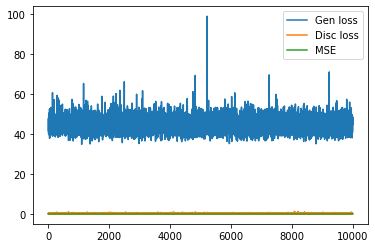

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


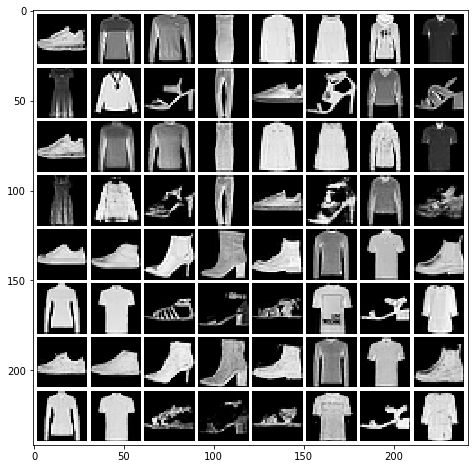

Mean squared dist: 0.017956998
epoch: 88 	 step:0 	 loss: 42.87
epoch: 88 	 step:100 	 loss: 39.83
epoch: 88 	 step:200 	 loss: 47.49
epoch: 88 	 step:300 	 loss: 45.87
epoch: 88 	 step:400 	 loss: 42.88
epoch: 88 	 step:500 	 loss: 47.52
epoch: 88 	 step:600 	 loss: 46.1
epoch: 88 	 step:700 	 loss: 44.19
epoch: 88 	 step:800 	 loss: 45.49
epoch: 88 	 step:900 	 loss: 45.2
epoch: 88 	 step:1000 	 loss: 41.84
epoch: 88 	 step:1100 	 loss: 51.78
epoch: 88 	 step:1200 	 loss: 44.6
epoch: 88 	 step:1300 	 loss: 53.06
epoch: 88 	 step:1400 	 loss: 46.81
epoch: 88 	 step:1500 	 loss: 47.25
epoch: 88 	 step:1600 	 loss: 46.73
epoch: 88 	 step:1700 	 loss: 42.54
epoch: 88 	 step:1800 	 loss: 40.44


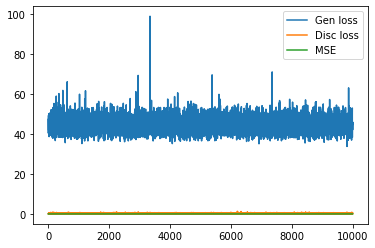

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


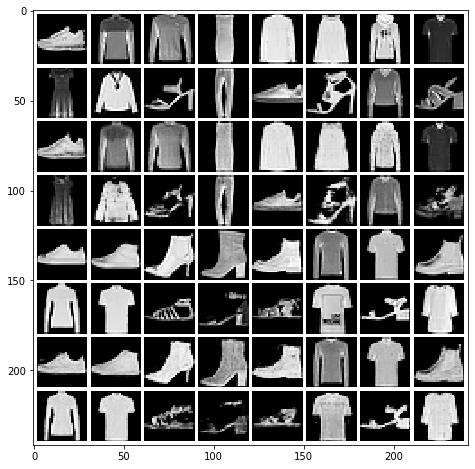

Mean squared dist: 0.018161532
epoch: 89 	 step:0 	 loss: 39.25
epoch: 89 	 step:100 	 loss: 42.29
epoch: 89 	 step:200 	 loss: 45.2
epoch: 89 	 step:300 	 loss: 39.88
epoch: 89 	 step:400 	 loss: 43.83
epoch: 89 	 step:500 	 loss: 43.11
epoch: 89 	 step:600 	 loss: 43.76
epoch: 89 	 step:700 	 loss: 46.03
epoch: 89 	 step:800 	 loss: 44.51
epoch: 89 	 step:900 	 loss: 42.78
epoch: 89 	 step:1000 	 loss: 40.35
epoch: 89 	 step:1100 	 loss: 45.65
epoch: 89 	 step:1200 	 loss: 42.92
epoch: 89 	 step:1300 	 loss: 48.02
epoch: 89 	 step:1400 	 loss: 46.57
epoch: 89 	 step:1500 	 loss: 47.72
epoch: 89 	 step:1600 	 loss: 46.94
epoch: 89 	 step:1700 	 loss: 44.63
epoch: 89 	 step:1800 	 loss: 43.01


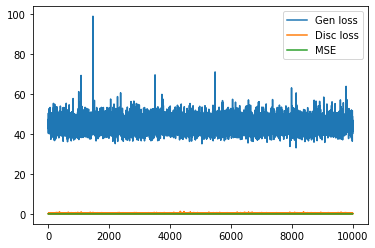

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


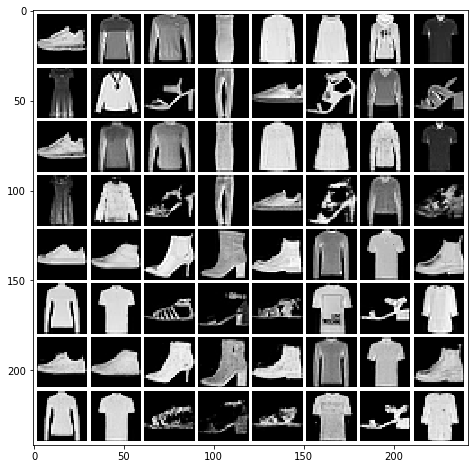

Mean squared dist: 0.01821877
epoch: 90 	 step:0 	 loss: 49.28
epoch: 90 	 step:100 	 loss: 45.46
epoch: 90 	 step:200 	 loss: 39.39
epoch: 90 	 step:300 	 loss: 53.03
epoch: 90 	 step:400 	 loss: 43.43
epoch: 90 	 step:500 	 loss: 45.14
epoch: 90 	 step:600 	 loss: 39.31
epoch: 90 	 step:700 	 loss: 40.15
epoch: 90 	 step:800 	 loss: 44.84
epoch: 90 	 step:900 	 loss: 44.46
epoch: 90 	 step:1000 	 loss: 48.82
epoch: 90 	 step:1100 	 loss: 47.0
epoch: 90 	 step:1200 	 loss: 43.8
epoch: 90 	 step:1300 	 loss: 41.65
epoch: 90 	 step:1400 	 loss: 50.33
epoch: 90 	 step:1500 	 loss: 49.92
epoch: 90 	 step:1600 	 loss: 46.89
epoch: 90 	 step:1700 	 loss: 41.42
epoch: 90 	 step:1800 	 loss: 42.15


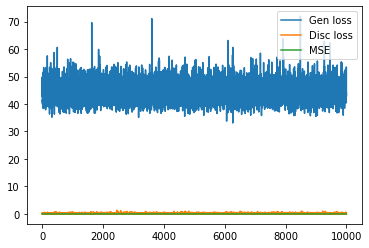

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


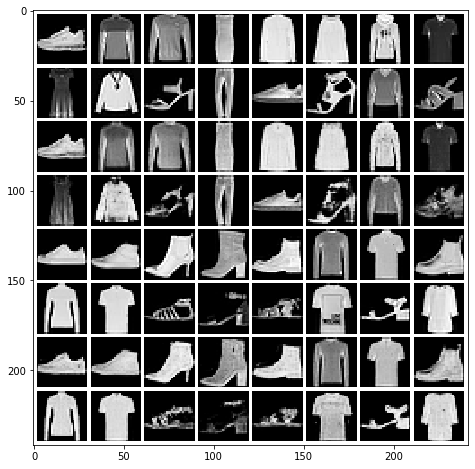

Mean squared dist: 0.018042535
epoch: 91 	 step:0 	 loss: 49.62
epoch: 91 	 step:100 	 loss: 44.01
epoch: 91 	 step:200 	 loss: 39.55
epoch: 91 	 step:300 	 loss: 45.72
epoch: 91 	 step:400 	 loss: 56.33
epoch: 91 	 step:500 	 loss: 40.76
epoch: 91 	 step:600 	 loss: 43.91
epoch: 91 	 step:700 	 loss: 47.68
epoch: 91 	 step:800 	 loss: 47.13
epoch: 91 	 step:900 	 loss: 44.48
epoch: 91 	 step:1000 	 loss: 43.87
epoch: 91 	 step:1100 	 loss: 41.92
epoch: 91 	 step:1200 	 loss: 47.82
epoch: 91 	 step:1300 	 loss: 40.41
epoch: 91 	 step:1400 	 loss: 45.32
epoch: 91 	 step:1500 	 loss: 44.27
epoch: 91 	 step:1600 	 loss: 46.99
epoch: 91 	 step:1700 	 loss: 42.09
epoch: 91 	 step:1800 	 loss: 42.83


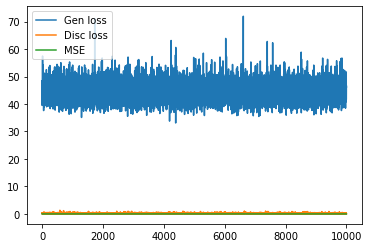

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


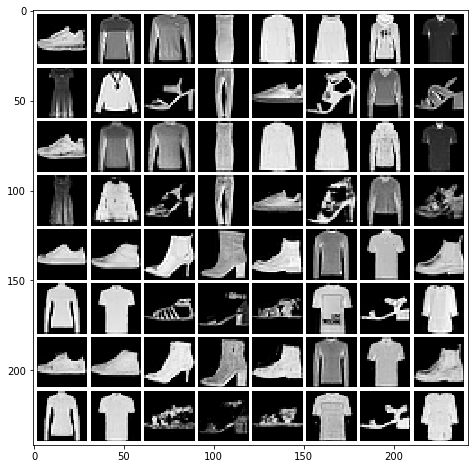

Mean squared dist: 0.017886436
epoch: 92 	 step:0 	 loss: 49.09
epoch: 92 	 step:100 	 loss: 50.18
epoch: 92 	 step:200 	 loss: 42.19
epoch: 92 	 step:300 	 loss: 45.96
epoch: 92 	 step:400 	 loss: 39.72
epoch: 92 	 step:500 	 loss: 46.39
epoch: 92 	 step:600 	 loss: 49.55
epoch: 92 	 step:700 	 loss: 43.91
epoch: 92 	 step:800 	 loss: 44.53
epoch: 92 	 step:900 	 loss: 43.16
epoch: 92 	 step:1000 	 loss: 45.51
epoch: 92 	 step:1100 	 loss: 42.53
epoch: 92 	 step:1200 	 loss: 41.47
epoch: 92 	 step:1300 	 loss: 39.34
epoch: 92 	 step:1400 	 loss: 40.92
epoch: 92 	 step:1500 	 loss: 44.79
epoch: 92 	 step:1600 	 loss: 47.51
epoch: 92 	 step:1700 	 loss: 38.04
epoch: 92 	 step:1800 	 loss: 43.85


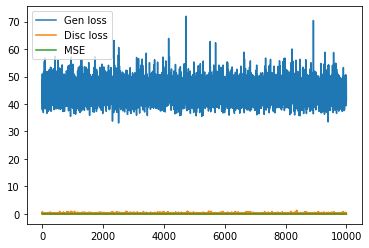

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


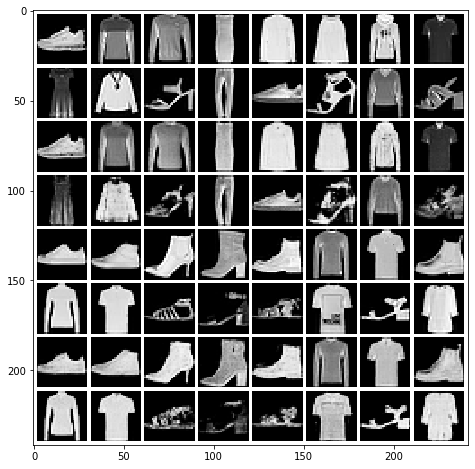

Mean squared dist: 0.018044274
epoch: 93 	 step:0 	 loss: 42.48
epoch: 93 	 step:100 	 loss: 43.95
epoch: 93 	 step:200 	 loss: 38.51
epoch: 93 	 step:300 	 loss: 45.53
epoch: 93 	 step:400 	 loss: 42.4
epoch: 93 	 step:500 	 loss: 37.98
epoch: 93 	 step:600 	 loss: 49.46
epoch: 93 	 step:700 	 loss: 44.01
epoch: 93 	 step:800 	 loss: 40.94
epoch: 93 	 step:900 	 loss: 46.76
epoch: 93 	 step:1000 	 loss: 43.03
epoch: 93 	 step:1100 	 loss: 47.6
epoch: 93 	 step:1200 	 loss: 41.23
epoch: 93 	 step:1300 	 loss: 44.09
epoch: 93 	 step:1400 	 loss: 38.47
epoch: 93 	 step:1500 	 loss: 42.32
epoch: 93 	 step:1600 	 loss: 41.17
epoch: 93 	 step:1700 	 loss: 40.09
epoch: 93 	 step:1800 	 loss: 48.46


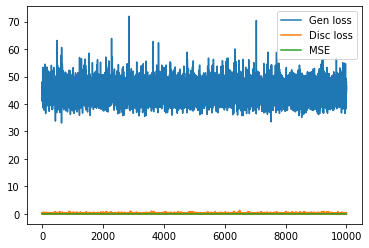

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


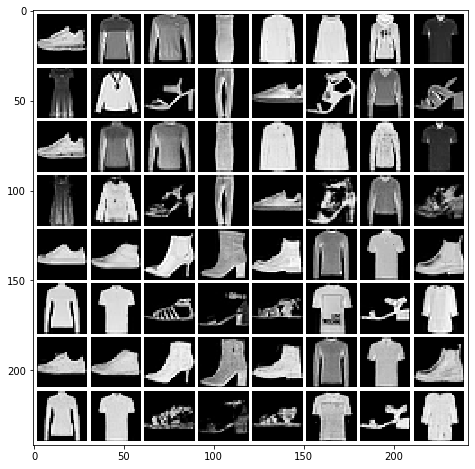

Mean squared dist: 0.017939137
epoch: 94 	 step:0 	 loss: 47.97
epoch: 94 	 step:100 	 loss: 40.86
epoch: 94 	 step:200 	 loss: 44.83
epoch: 94 	 step:300 	 loss: 39.04
epoch: 94 	 step:400 	 loss: 46.48
epoch: 94 	 step:500 	 loss: 40.36
epoch: 94 	 step:600 	 loss: 47.74
epoch: 94 	 step:700 	 loss: 45.45
epoch: 94 	 step:800 	 loss: 45.81
epoch: 94 	 step:900 	 loss: 46.72
epoch: 94 	 step:1000 	 loss: 40.61
epoch: 94 	 step:1100 	 loss: 46.74
epoch: 94 	 step:1200 	 loss: 46.57
epoch: 94 	 step:1300 	 loss: 45.04
epoch: 94 	 step:1400 	 loss: 41.5
epoch: 94 	 step:1500 	 loss: 45.89
epoch: 94 	 step:1600 	 loss: 45.26
epoch: 94 	 step:1700 	 loss: 40.34
epoch: 94 	 step:1800 	 loss: 45.48


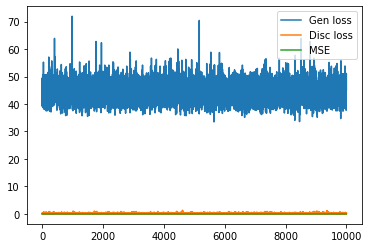

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


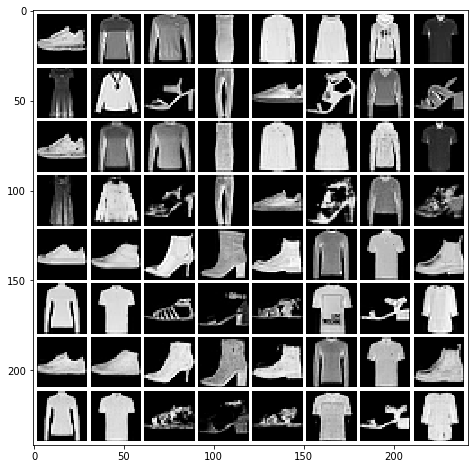

Mean squared dist: 0.018086739
epoch: 95 	 step:0 	 loss: 40.92
epoch: 95 	 step:100 	 loss: 48.17
epoch: 95 	 step:200 	 loss: 45.07
epoch: 95 	 step:300 	 loss: 46.98
epoch: 95 	 step:400 	 loss: 43.25
epoch: 95 	 step:500 	 loss: 40.58
epoch: 95 	 step:600 	 loss: 41.9
epoch: 95 	 step:700 	 loss: 40.24
epoch: 95 	 step:800 	 loss: 45.18
epoch: 95 	 step:900 	 loss: 41.1
epoch: 95 	 step:1000 	 loss: 48.38
epoch: 95 	 step:1100 	 loss: 44.19
epoch: 95 	 step:1200 	 loss: 46.55
epoch: 95 	 step:1300 	 loss: 41.24
epoch: 95 	 step:1400 	 loss: 46.23
epoch: 95 	 step:1500 	 loss: 44.1
epoch: 95 	 step:1600 	 loss: 48.09
epoch: 95 	 step:1700 	 loss: 45.53
epoch: 95 	 step:1800 	 loss: 40.23


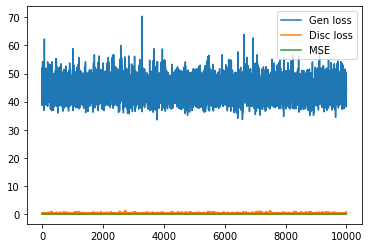

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


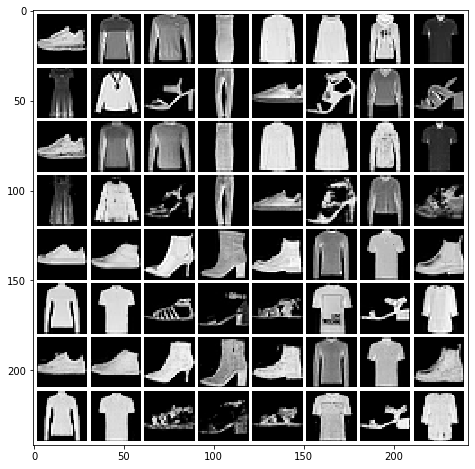

Mean squared dist: 0.018101458
epoch: 96 	 step:0 	 loss: 39.87
epoch: 96 	 step:100 	 loss: 46.36
epoch: 96 	 step:200 	 loss: 44.53
epoch: 96 	 step:300 	 loss: 42.1
epoch: 96 	 step:400 	 loss: 48.2
epoch: 96 	 step:500 	 loss: 41.08
epoch: 96 	 step:600 	 loss: 41.66
epoch: 96 	 step:700 	 loss: 48.17
epoch: 96 	 step:800 	 loss: 51.88
epoch: 96 	 step:900 	 loss: 40.08
epoch: 96 	 step:1000 	 loss: 42.51
epoch: 96 	 step:1100 	 loss: 46.85
epoch: 96 	 step:1200 	 loss: 40.8
epoch: 96 	 step:1300 	 loss: 46.63
epoch: 96 	 step:1400 	 loss: 51.38
epoch: 96 	 step:1500 	 loss: 44.61
epoch: 96 	 step:1600 	 loss: 45.31
epoch: 96 	 step:1700 	 loss: 42.67
epoch: 96 	 step:1800 	 loss: 45.77


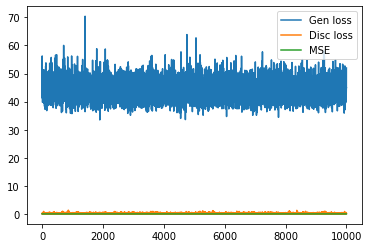

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


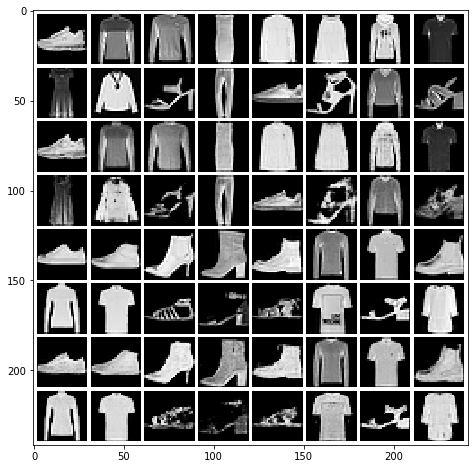

Mean squared dist: 0.017909257
epoch: 97 	 step:0 	 loss: 43.02
epoch: 97 	 step:100 	 loss: 46.9
epoch: 97 	 step:200 	 loss: 49.63
epoch: 97 	 step:300 	 loss: 45.44
epoch: 97 	 step:400 	 loss: 41.21
epoch: 97 	 step:500 	 loss: 46.24
epoch: 97 	 step:600 	 loss: 42.35
epoch: 97 	 step:700 	 loss: 48.41
epoch: 97 	 step:800 	 loss: 40.63
epoch: 97 	 step:900 	 loss: 49.98
epoch: 97 	 step:1000 	 loss: 38.95
epoch: 97 	 step:1100 	 loss: 37.93
epoch: 97 	 step:1200 	 loss: 43.15
epoch: 97 	 step:1300 	 loss: 49.03
epoch: 97 	 step:1400 	 loss: 53.66
epoch: 97 	 step:1500 	 loss: 44.3
epoch: 97 	 step:1600 	 loss: 42.8
epoch: 97 	 step:1700 	 loss: 42.6
epoch: 97 	 step:1800 	 loss: 44.48


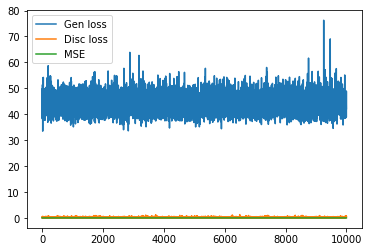

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


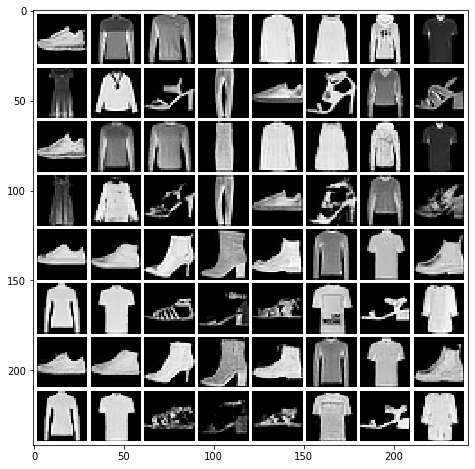

Mean squared dist: 0.017807849
epoch: 98 	 step:0 	 loss: 44.99
epoch: 98 	 step:100 	 loss: 40.68
epoch: 98 	 step:200 	 loss: 44.99
epoch: 98 	 step:300 	 loss: 39.05
epoch: 98 	 step:400 	 loss: 41.07
epoch: 98 	 step:500 	 loss: 39.71
epoch: 98 	 step:600 	 loss: 42.59
epoch: 98 	 step:700 	 loss: 48.02
epoch: 98 	 step:800 	 loss: 43.03
epoch: 98 	 step:900 	 loss: 47.73
epoch: 98 	 step:1000 	 loss: 45.12
epoch: 98 	 step:1100 	 loss: 44.88
epoch: 98 	 step:1200 	 loss: 44.74
epoch: 98 	 step:1300 	 loss: 42.25
epoch: 98 	 step:1400 	 loss: 47.17
epoch: 98 	 step:1500 	 loss: 47.16
epoch: 98 	 step:1600 	 loss: 46.32
epoch: 98 	 step:1700 	 loss: 43.44
epoch: 98 	 step:1800 	 loss: 44.01


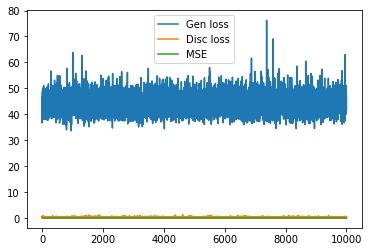

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


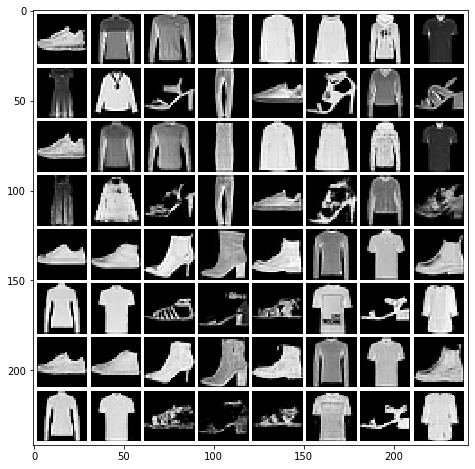

Mean squared dist: 0.01773619
epoch: 99 	 step:0 	 loss: 40.26
epoch: 99 	 step:100 	 loss: 41.89
epoch: 99 	 step:200 	 loss: 46.29
epoch: 99 	 step:300 	 loss: 49.2
epoch: 99 	 step:400 	 loss: 42.54
epoch: 99 	 step:500 	 loss: 40.07
epoch: 99 	 step:600 	 loss: 44.95
epoch: 99 	 step:700 	 loss: 42.9
epoch: 99 	 step:800 	 loss: 41.2
epoch: 99 	 step:900 	 loss: 50.54
epoch: 99 	 step:1000 	 loss: 43.25
epoch: 99 	 step:1100 	 loss: 38.91
epoch: 99 	 step:1200 	 loss: 44.79
epoch: 99 	 step:1300 	 loss: 48.45
epoch: 99 	 step:1400 	 loss: 40.71
epoch: 99 	 step:1500 	 loss: 42.3
epoch: 99 	 step:1600 	 loss: 42.85
epoch: 99 	 step:1700 	 loss: 37.32
epoch: 99 	 step:1800 	 loss: 42.59


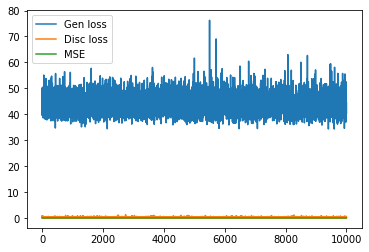

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


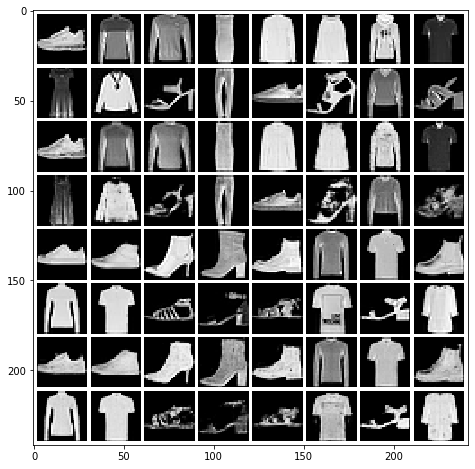

Mean squared dist: 0.017860308
epoch: 100 	 step:0 	 loss: 39.68
epoch: 100 	 step:100 	 loss: 42.37
epoch: 100 	 step:200 	 loss: 41.78
epoch: 100 	 step:300 	 loss: 42.67
epoch: 100 	 step:400 	 loss: 41.78
epoch: 100 	 step:500 	 loss: 37.24
epoch: 100 	 step:600 	 loss: 48.2
epoch: 100 	 step:700 	 loss: 46.99
epoch: 100 	 step:800 	 loss: 43.33
epoch: 100 	 step:900 	 loss: 41.84
epoch: 100 	 step:1000 	 loss: 43.74
epoch: 100 	 step:1100 	 loss: 42.19
epoch: 100 	 step:1200 	 loss: 41.07
epoch: 100 	 step:1300 	 loss: 44.72
epoch: 100 	 step:1400 	 loss: 39.14
epoch: 100 	 step:1500 	 loss: 49.93
epoch: 100 	 step:1600 	 loss: 48.73
epoch: 100 	 step:1700 	 loss: 48.78
epoch: 100 	 step:1800 	 loss: 43.58


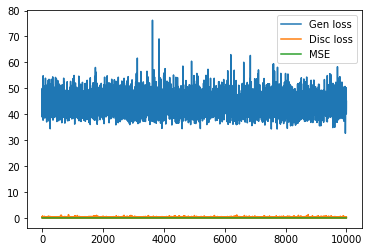

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


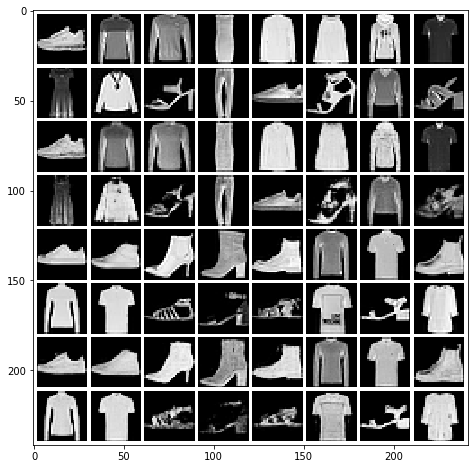

Mean squared dist: 0.017917406


In [12]:
### TRAIN MODEL ###

import time
num_epochs = 100

train_model(gen, disc, g_opt, d_opt, device, dataloader['train'], epochs=num_epochs)

gen_weights = gen.state_dict().copy()
disc_weights = disc.state_dict().copy()

torch.save(gen_weights, "../cache/cGAN/FCGenerator2048Fashion_{0:04d}_{1}.sd".format(num_epochs, time.strftime("%Y%m%d_%H%M%S")))
torch.save(disc_weights, "../cache/cGAN/ConvDiscriminator64Fashion_{0:04d}_{1}.sd".format(num_epochs, time.strftime("%Y%m%d_%H%M%S")))

In [6]:
### LOAD MODEL ####

model_nr = 4

gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=2048)
#disc = models.FCDiscriminator(imsize=imsize, h=2048)
#disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=64)

# TODO: map storage location to correct GPU!
gen.load_state_dict(torch.load("../cache/models/cGAN_Fashion/FCGenerator2048Fashion_{}.sd".format(model_nr), map_location={'cuda:1': device.__str__()}));
#disc.load_state_dict(torch.load("../cache/cGAN/ConvDiscriminator64MNIST_{}.sd".format(model_nr), map_location={'cuda:1': device.__str__()}));

Version 0.4


In [8]:
# Calculate test predictions #

test_predicted, test_original = test_generator(gen, device, dataloader['test'])
print(test_predicted.shape)

(8000, 1, 28, 28)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


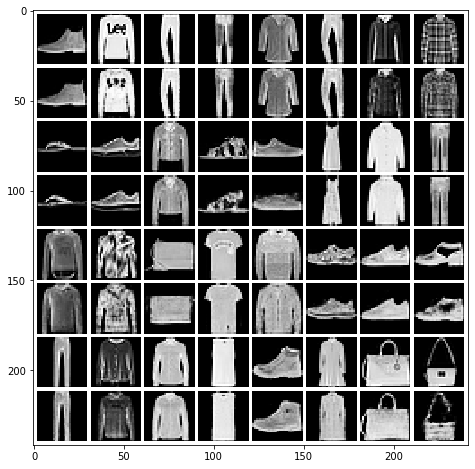

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


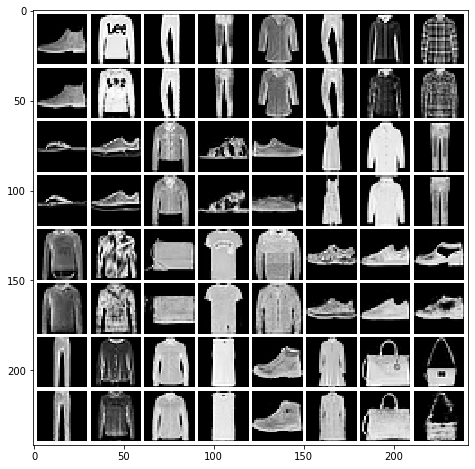

In [9]:
# Print test predictions 2 #
# Print predictions #
to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                    test_predicted[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/FCGenerator2048Fashion_{}.png".format(model_nr))

print("Registered:")
results_reg = register_croco(test_predicted[:32], test_original[:32])
to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                    results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/FCGenerator2048Fashion_{}_reg.png".format(model_nr))

In [12]:
# Benchmark test predictions #

benchmark(pred=test_predicted[:1024], true=test_original[:1024], check_all=True)

Signal error:
  MSE: 0.0176014236036508, std: 0.016680054740477342
  MAE: 0.06071698127925629, std: 0.03359037003855609
  SSIM: 0.7561813545444882, std: 0.16664304369934405
  PhCo-MSE: 0.01768027145215001, std: 0.02246583986665267
  PhCo-MAE: 0.061203732428111834, std: 0.040589182302923
  PhCo-SSIM: 0.7596188459986115, std: 0.17773052471325093
  CroCo-MSE: 0.015120019254823092, std: 0.013447392632543298
  CroCo-MAE: 0.05723015519652108, std: 0.030469165330602548
  CroCo-SSIM: 0.7749387963343463, std: 0.15259981628331004

Magnitude error:
  MSE Magnitude: 3.3654730169213165, std: 2.8489942889441937

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01760 | 0.06072 | 0.7562 | 0.01768 | 0.06120 | 0.7596 | 0.01512 | 0.05723 | 0.7749 | 3.365 |


## Evaluation for different cGAN models (random z and 1024 samples)

| Nr | Type | clipping | Loss | Size | epochs | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magn
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | FC + FC | 1e-1 | log GAN + 1e3 * MAE | 2048 | 100 |
| 2 | FC + FC |  1e-1 | log GAN + 1e3 * MSE | 2048 | 100 | 
| 3 | FC + FC |  1e-1 | log GAN + 1e2 * MAE | 2048 | 100 | 
| 4 | FC + CNN |  0.0 | log GAN + 1e3 * MAE | 2048 + 64 | 100 | 0.01760 | 0.06072 | 0.7562 | 0.01768 | 0.06120 | 0.7596 | 0.01512 | 0.05723 | 0.7749 | 3.365 |
| 5 | FC + CNN |  1e-1 | log GAN + 1e1 * MAE | 2048 + 64 | 100 | 
| 6 | FC + CNN |  0.0 | log GAN + 1e1 * MAE | 2048 + 64 | 100 | 
| 7 | FC + CNN | 0.0 | log GAN + 1e4 * MAE | 2048 + 64 | 100 | 
| 8 | FC + CNN | 0.0 | log GAN + 1e2 * MAE | 2048 + 64 | 100 | 



In [16]:
# Latent z optimization

def genopt(sample_magnitudes, gen, disc, device, init_x=None, max_steps=5000, max_loss=0.0, mue=1.0, lr=1.0):
    
    if disc is not None:
        disc.to(device)
        disc.eval()
    gen.to(device)
    gen.eval()
    
    if init_x is None:
        z = torch.randn((sample_magnitudes.shape), requires_grad=True, device=device)
    else:
        raise NotImplementedError
    
    optimizer = optim.Adam([z], lr=lr)
    
    losses = []
    last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
    
    for i in range(max_steps):
        magnitudes = calc_mags(last_out)

        mse_all = torch.mean((magnitudes - sample_magnitudes) ** 2, dim=(1, 2, 3))
        reconstruction = torch.sum(mse_all)
        #adversarial = -torch.mean(torch.log(disc(torch.cat([last_out, sample_magnitudes], dim=1))))
        #loss = reconstruction + mue * adversarial
        loss = reconstruction + mue * torch.mean(z ** 2)
        
        if loss < max_loss:
            break
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
        
        losses.append(loss.item())
    
    return last_out.detach(), losses, mse_all

Batch 1/32 finished
Batch 2/32 finished
Batch 3/32 finished
Batch 4/32 finished
Batch 5/32 finished
Batch 6/32 finished
Batch 7/32 finished
Batch 8/32 finished
Batch 9/32 finished
Batch 10/32 finished
Batch 11/32 finished
Batch 12/32 finished
Batch 13/32 finished
Batch 14/32 finished
Batch 15/32 finished
Batch 16/32 finished
Batch 17/32 finished
Batch 18/32 finished
Batch 19/32 finished
Batch 20/32 finished
Batch 21/32 finished
Batch 22/32 finished
Batch 23/32 finished
Batch 24/32 finished
Batch 25/32 finished
Batch 26/32 finished
Batch 27/32 finished
Batch 28/32 finished
Batch 29/32 finished
Batch 30/32 finished
Batch 31/32 finished
Batch 32/32 finished


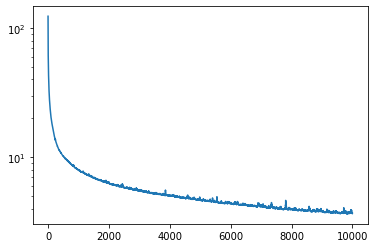

In [23]:
### Latent z optimization ###

num_batches = 32
batch_size = 32
max_steps = 10000
max_loss = 0.0
mue = 0.0
lr = 1.0

###

out_original = np.zeros((batch_size * num_batches, *imsize))
out_results = np.zeros((batch_size * num_batches, *imsize))
mse_all = np.full((batch_size * num_batches), np.inf)

for batch_i, batch in enumerate(dataloader['test']):
    test_sample = batch.to(device)
    test_magnitudes = calc_mags(test_sample)   
    out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()
    

    cur_out_results, cur_loss, cur_mse_all = genopt(sample_magnitudes=test_magnitudes, gen=gen, disc=None, device=device,
                                          max_steps=max_steps, max_loss=max_loss, mue=mue, lr=lr)
    cur_out_results = cur_out_results.cpu().numpy()
    
    out_results[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_out_results
    mse_all[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_mse_all.detach().cpu().numpy()

    print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
    if batch_i + 1 >= num_batches:
        break

plt.semilogy(cur_loss)
plt.show()

In [24]:
### CACHE RESULTS ###

import pickle
pickle.dump(out_original, open("/home/shared/phase-retrieval/test/cGAN_Fashion/cgan_original_4_1024.p", "wb"))
pickle.dump(out_results, open("/home/shared/phase-retrieval/test/cGAN_Fashion/cgan_4_1024.p", "wb"))

In [19]:
### LOAD RESULTS ###
import pickle

out_original = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/cgan_original_4_1024.p", "rb"))
out_results = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/cgan_4_1024.p", "rb"))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


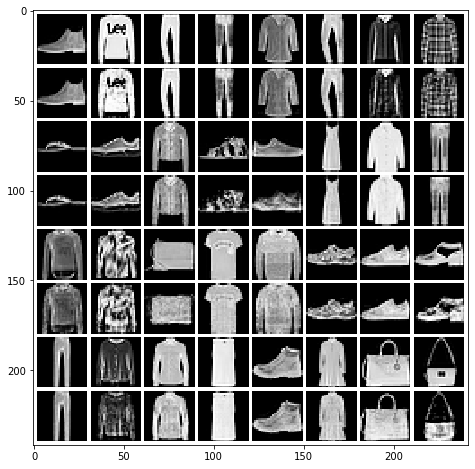

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


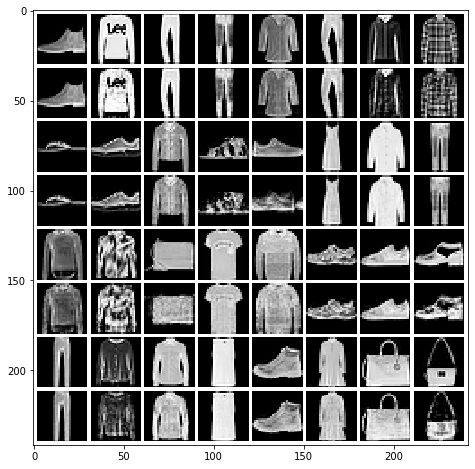

In [20]:
# Print predictions #
to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                    out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/FCGenerator2048Fashion_4_1024_10000latentSteps.png".format(model_nr))

print("Registered:")
results_reg = register_croco(out_results[:32], out_original[:32])
to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                    results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/FCGenerator2048Fashion_4_1024_10000latentSteps_reg.png".format(model_nr))

In [21]:
# Benchmark test predictions #

benchmark(pred=out_results[:1024], true=out_original[:1024], check_all=True)

Signal error:
  MSE: 0.01509008376097954, std: 0.021495760410225745
  MAE: 0.05117703435157838, std: 0.043095780227851696
  SSIM: 0.8074640282850867, std: 0.1982696630000954
  PhCo-MSE: 0.010064022780877317, std: 0.018749418312717144
  PhCo-MAE: 0.04327650730422576, std: 0.040814084431913235
  PhCo-SSIM: 0.849507047230295, std: 0.17257310033903464
  CroCo-MSE: 0.008671910641577626, std: 0.012833584880916552
  CroCo-MAE: 0.04116837085129945, std: 0.0345706563900644
  CroCo-SSIM: 0.8579703699816132, std: 0.15550923764015373

Magnitude error:
  MSE Magnitude: 0.0893684454577698, std: 0.09876548876453652

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01509 | 0.05118 | 0.8075 | 0.01006 | 0.04328 | 0.8495 | 0.008672 | 0.04117 | 0.8580 | 0.08937 |


## Evaluation for different z optimizations (32 samples)

| Nr Type | iterations | mue | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 10000 | 0.0 | 1.0 | 
| 2 | 10000 | 0.0 | 1.0 | 
| 3 | 10000 | 0.0 | 1.0 | 
| 4 | 10000 | 0.0 | 1.0 | 0.01485 | 0.05006 | 0.8221 | 0.008836 | 0.04091 | 0.8674 | 0.008643 | 0.04043 | 0.8696 | 0.07849 |
| 4 | 50000 | 0.0 | 1.0 | 0.01646 | 0.05328 | 0.8072 | 0.01058 | 0.04365 | ? | 0.009376 | 0.04796 | ? | ? |
| 5 | 10000 | 0.0 | 1.0 | 
| 6 | 10000 | 0.0 | 1.0 | 
| 7 | 10000 | 0.0 | 1.0 | 
| 8 | 10000 | 0.0 | 1.0 | 


## Final Evaluation (1024 samples)

| Nr Type | iterations | mue | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 4 | 10000 | 0.0 | 1.0 | 0.01509 | 0.05118 | 0.8075 | 0.01006 | 0.04328 | 0.8495 | 0.008672 | 0.04117 | 0.8580 | 0.08937 |
